In [1]:
import math
import random
from typing import Tuple
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import csv
random.seed(10)

In [2]:
import pickle
from pathlib import Path

# Structure: (theta, phi) -> (theta_etilt, phi_scan)
saved_tp = dict()
saved_tp_file = Path("t1p1.pkl")
if saved_tp_file.is_file():
    with open(saved_tp_file, "rb") as f:
        saved_tp = pickle.load(f)
        
# Structure: (segment, polygon) -> (boolean True or False)
saved_los = dict()

saved_los_file = Path("los1.pkl")
if saved_los_file.is_file():
    with open(saved_los_file, "rb") as f:
        saved_los = pickle.load(f)

In [3]:
!pip install Geometry3D shapely

In [4]:
from Geometry3D import *
from shapely import geometry

In [5]:
data = pd.read_csv("C:\\Users\\tniloy\\Downloads\\opencellid dataset\\310.csv", names=['radio', 'mcc', 'mnc', 'lac', 'cid', 'unit', 'longitude', 'latitude', 'range', 'samples', 'changeable', 'created', 'updated', 'averageSignal'])

In [6]:
data.head (10)

,radio,mcc,mnc,lac,cid,unit,longitude,latitude,range,samples,changeable,created,updated,averageSignal
0,GSM,310,260,32192,22568,0,-73.858566,40.898438,1779,12,1,1459696254,1489125559,0
1,GSM,310,260,22629,61562,0,-95.876501,41.286475,3367,17,1,1459810860,1609205988,0
2,GSM,310,260,51052,44152,0,-71.084483,42.381728,1000,44,1,1459812328,1514115939,0
3,GSM,310,260,51051,40311,0,-71.085559,42.381356,1000,52,1,1459812328,1527695374,0
4,GSM,310,260,5973,60092,0,-95.570630,29.735371,1000,22,1,1459692332,1490851584,0
5,GSM,310,410,19007,7133,0,-87.258205,40.153886,19135,6,1,1459699529,1472415099,0
6,GSM,310,410,53005,50671,0,-95.563889,30.280380,1000,1,1,1459775023,1459775023,0
7,GSM,310,260,46136,15418,0,-76.999741,39.160080,1000,1,1,1459663271,1459663271,0
8,GSM,310,410,27672,59021,0,-81.741964,26.213691,1000,11,1,1459687298,1491031828,0
9,GSM,310,260,5973,50942,0,-95.560226,29.736557,1000,6,1,1459692332,1469493454,0


In [7]:
# center_x = 0
# center_y = 0
# center_z = 0
# FSS POsition:
lat_FSS= 37.20250
lon_FSS= -80.43444
R  = 6.371e6  #Radius of the earth

x_FSS = R * math.cos(math.radians(lat_FSS)) * math.cos(math.radians(lon_FSS))
y_FSS = R * math.cos(math.radians(lat_FSS)) * math.sin(math.radians(lon_FSS))
z_FSS = R * math.sin(math.radians(lat_FSS))

print("X, Y, Z = "+ str([x_FSS, y_FSS, z_FSS]))


radius=5000 #radius of the inclusion zone
latitude_range = radius / 110574
longitude_range = radius/(111320*math.cos(math.radians(latitude_range)))
print("Total area of inclusion zone is = " + str(radius*radius*math.pi))

X, Y, Z = [843264.3231973607, -5003968.368478095, 3852122.3823358943]
Total area of inclusion zone is = 78539816.33974482


In [8]:
print(latitude_range)
print(longitude_range)

0.04521858664785573
0.044915572737550945


In [9]:
data_within_zone = data[(data['radio'] == 'GSM') & (data['longitude'] <= (lon_FSS + longitude_range)) & (data['longitude'] >= (lon_FSS - longitude_range)) & (data['latitude'] <= (lat_FSS + latitude_range)) & (data['latitude'] >= (lat_FSS - latitude_range))]

data_within_zone.head(10)


,radio,mcc,mnc,lac,cid,unit,longitude,latitude,range,samples,changeable,created,updated,averageSignal
780410,GSM,310,260,37630,43582,0,-80.393175,37.196127,8733,3992,1,1413757287,1435049916,0
1813932,GSM,310,260,32453,43561,0,-80.421524,37.189560,1000,9,1,1458834001,1491931840,0
1813934,GSM,310,260,32453,43602,0,-80.410309,37.233810,1000,6,1,1458834001,1479555225,0
1814053,GSM,310,260,32453,43822,0,-80.406704,37.227516,1000,8,1,1458834001,1479576548,0
1814075,GSM,310,260,32453,43583,0,-80.461073,37.203233,2207,15,1,1458834001,1477155991,0
1814213,GSM,310,260,32453,43581,0,-80.409897,37.217972,1000,5,1,1458834001,1473235293,0
1814220,GSM,310,260,32453,43601,0,-80.425186,37.236099,1000,6,1,1458834001,1473191254,0
1814361,GSM,310,260,32453,43562,0,-80.391645,37.165063,1000,11,1,1458834001,1489446412,0
1814366,GSM,310,260,32453,43603,0,-80.425415,37.222710,1000,4,1,1458834001,1474352285,0
1814368,GSM,310,260,32453,43621,0,-80.393486,37.224279,1033,56,1,1458834001,1482422269,0


In [10]:
len(data_within_zone)

33

In [11]:
import json
with open ('C:\\Users\\tniloy\\Downloads\\export (1).geojson') as f:
    df=json.load(f)
    data1=pd.json_normalize(df,record_path=['features'])
data1.head(10)

,type,id,properties.@id,properties.addr:housenumber,properties.addr:street,properties.building,properties.height,properties.name,properties.operator,properties.type,...,properties.automatic_door,properties.access,properties.button_operated,properties.door,properties.operator:short,properties.operator:type,properties.operator:wikidata,properties.operator:wikipedia,properties.foot,properties.vehicle
0,Feature,relation/308029,relation/308029,630,Washington Street Southwest,dormitory,15.7,Pritchard Hall,Virginia Tech,multipolygon,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,Feature,relation/548333,relation/548333,NaN,NaN,yes,NaN,NaN,NaN,multipolygon,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,Feature,relation/548339,relation/548339,NaN,NaN,yes,NaN,NaN,NaN,multipolygon,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,Feature,relation/548344,relation/548344,1406,Giles Road,church,NaN,Blacksburg First Wesleyan Church,NaN,multipolygon,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,Feature,relation/548347,relation/548347,NaN,NaN,yes,NaN,NaN,NaN,multipolygon,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,Feature,relation/548348,relation/548348,NaN,NaN,residential,NaN,NaN,NaN,multipolygon,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,Feature,relation/548371,relation/548371,1416,Palmer Drive,detached,NaN,NaN,NaN,multipolygon,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,Feature,relation/548372,relation/548372,900,Dickerson Lane,detached,NaN,NaN,NaN,multipolygon,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8,Feature,relation/548373,relation/548373,NaN,NaN,yes,NaN,NaN,NaN,multipolygon,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9,Feature,relation/548386,relation/548386,NaN,NaN,yes,NaN,NaN,NaN,multipolygon,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [12]:
data1[data1["properties.height"].notnull()].head(20)

,type,id,properties.@id,properties.addr:housenumber,properties.addr:street,properties.building,properties.height,properties.name,properties.operator,properties.type,...,properties.automatic_door,properties.access,properties.button_operated,properties.door,properties.operator:short,properties.operator:type,properties.operator:wikidata,properties.operator:wikipedia,properties.foot,properties.vehicle
0,Feature,relation/308029,relation/308029,630,Washington Street Southwest,dormitory,15.7,Pritchard Hall,Virginia Tech,multipolygon,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
33,Feature,relation/1360465,relation/1360465,NaN,NaN,university,14.86,East Eggleston Hall,Virginia Tech,multipolygon,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
34,Feature,relation/1360466,relation/1360466,NaN,NaN,dormitory,14.86,West Eggleston Hall,Virginia Tech,multipolygon,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
35,Feature,relation/1360467,relation/1360467,NaN,NaN,dormitory,11.27,Slusher Wing,Virginia Tech,multipolygon,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
36,Feature,relation/1360468,relation/1360468,NaN,NaN,dormitory,33.59,Slusher Tower,Virginia Tech,multipolygon,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
37,Feature,relation/1360469,relation/1360469,NaN,NaN,dormitory,14.86,Main Eggleston Hall,Virginia Tech,multipolygon,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
66,Feature,way/26210227,way/26210227,NaN,NaN,university,15.47,Cheatham Hall,Virginia Tech,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
67,Feature,way/26210236,way/26210236,285,Ag Quad Lane,university,11.57,Dietrick Hall,Virginia Tech,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
69,Feature,way/32709325,way/32709325,570,Washington Street Southwest,dormitory,25.82,Hoge Hall,Virginia Tech,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
98,Feature,way/32953606,way/32953606,210,Drillfield Drive,university,11.61,Sandy Hall,Virginia Tech,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [13]:
data1["geometry.coordinates"].head(10)

0    [[[-80.4194702, 37.2238774], [-80.4194505, 37....
1    [[[-80.4070717, 37.2320238], [-80.4069865, 37....
2    [[[-80.4068521, 37.2319488], [-80.4069373, 37....
3    [[[-80.4104274, 37.2506844], [-80.4104412, 37....
4    [[[-80.4355296, 37.2138316], [-80.4355103, 37....
5    [[[-80.4416012, 37.2238365], [-80.4417281, 37....
6    [[[-80.3924701, 37.2185727], [-80.3923812, 37....
7    [[[-80.4121293, 37.2397986], [-80.4121648, 37....
8    [[[-80.4075916, 37.2253453], [-80.4076676, 37....
9    [[[-80.4071473, 37.2322051], [-80.4072218, 37....
Name: geometry.coordinates, dtype: object

In [14]:
class Building:
    def __init__(self, coordinates=None, height=None):
        self.coordinates = []
        if coordinates is not None:
            self.coordinates = coordinates
        
        if height is None or not str(height).isdigit():
            self.height = random.uniform(10, 40)
        else:
            self.height = height
        
        self.x_coord, self.y_coord, self.z_coord = self.latlon_to_XYZ()
        
        self.points = []
        for i in range(len(self.x_coord)):
            x, y, z = self.x_coord[i], self.y_coord[i], self.z_coord[i]
            self.points.append(Point(x,y,z))
        
        self.xy_points = np.array([(p.x, p.y) for p in self.points])
        self.xy_polygon = geometry.Polygon(self.xy_points)
        
        self.wall_polygons = self.get_wall_polygons()
    
    def latlon_to_XYZ(self):
        x_coord = np.array([])
        y_coord = np.array([])
        z_coord = np.array([])
        
        # bottom points of building at each coordinate
        for lon, lat in self.coordinates:
            x = R * math.cos(math.radians(lat)) * math.cos(math.radians(lon))
            y = R * math.cos(math.radians(lat)) * math.sin(math.radians(lon))
            x_coord = np.append(x_coord, x)
            y_coord = np.append(y_coord, y)
            z_coord = np.append(z_coord, 0)
            # z_coord = np.append(z_coord, self.height)
            
        # make coordinates to relative to FSS position
        x_coord -= x_FSS
        y_coord -= y_FSS
        
        return x_coord, y_coord, z_coord

    def get_wall_polygons(self):
        polygons = []

        # points = [Point(x,y,0) for x,y in p.boundary.coords]
        # polygons.append(ConvexPolygon(points))
        points = [Point(x,y,self.height) for x,y in self.xy_polygon.boundary.coords]
        # polygons.append(ConvexPolygon(points))

        for i in range(len(points)-1):
            high_point_1 = points[i]
            high_point_2 = points[i + 1]
            low_point_1 = Point(high_point_1.x, high_point_1.y, 0)
            low_point_2 = Point(high_point_2.x, high_point_2.y, 0)

            poly_points = [low_point_1, low_point_2, high_point_1, high_point_2]
            #print(poly_points)
            polygons.append(ConvexPolygon(poly_points))
            
        return polygons
        

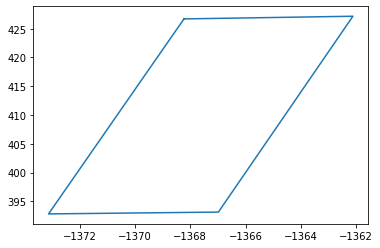

In [15]:
from shapely import geometry

b = Building(data1.iloc[500]["geometry.coordinates"][0], data1.iloc[500]["properties.height"])
x, y = b.xy_polygon.boundary.xy
plt.plot(x, y)

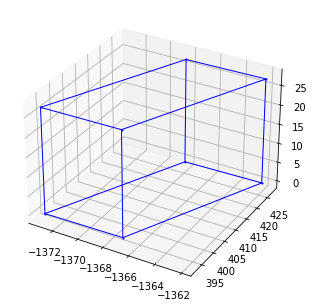

In [16]:
r = Renderer(backend='matplotlib')
for p in b.wall_polygons:
    r.add((p,'b',1),normal_length=0)
r.show()

In [17]:
from tqdm import tqdm
buildings = []

for i in tqdm(range(len(data1))):
    for coords in data1.iloc[i]["geometry.coordinates"]:
        try:
            buildings.append(Building(coords, data1.iloc[i]["properties.height"]))
        except:
            print(f"Skipping building {i}")

  1%|▍                                                                              | 46/8644 [00:00<00:37, 231.10it/s]

Skipping building 26
Skipping building 26
Skipping building 27
Skipping building 27
Skipping building 27
Skipping building 28
Skipping building 28
Skipping building 29
Skipping building 29
Skipping building 29
Skipping building 29
Skipping building 29
Skipping building 29
Skipping building 29
Skipping building 29
Skipping building 29
Skipping building 29
Skipping building 29
Skipping building 53
Skipping building 53
Skipping building 53
Skipping building 53


100%|█████████████████████████████████████████████████████████████████████████████| 8644/8644 [00:17<00:00, 507.33it/s]

Skipping building 8165
Skipping building 8165
Skipping building 8165
Skipping building 8165
Skipping building 8165
Skipping building 8165
Skipping building 8165
Skipping building 8165
Skipping building 8165
Skipping building 8166
Skipping building 8166
Skipping building 8166
Skipping building 8166
Skipping building 8166
Skipping building 8166
Skipping building 8166
Skipping building 8166
Skipping building 8166
Skipping building 8166
Skipping building 8166
Skipping building 8166
Skipping building 8167
Skipping building 8167
Skipping building 8167
Skipping building 8167
Skipping building 8167
Skipping building 8167
Skipping building 8167
Skipping building 8167
Skipping building 8168
Skipping building 8168
Skipping building 8168
Skipping building 8168
Skipping building 8168
Skipping building 8168
Skipping building 8169
Skipping building 8169
Skipping building 8169
Skipping building 8169
Skipping building 8169
Skipping building 8170
Skipping building 8170
Skipping building 8170
Skipping bu

In [18]:
class FSS_Channels:
  # channels start at 0, so a channel plan with 8 channels is from 0 to 7

  band_width = 240e6 # 240MHz

  # 10.7-12.7 GHz frequency range
  range_start = 10.7e9 # 10.7GHz
  range_end = 12.7e9 # 12.7GHz

  channel_count = 8

  range_size = range_end - range_start
  unused_space = range_size - band_width * channel_count

  # FSS channel spacing should be 10MHz
  space_between_channels = unused_space / channel_count

  @staticmethod
  def getChannelRange(channel) -> Tuple[int, int]:
    channel_start = int((0.5 + channel) * FSS_Channels.space_between_channels + channel * FSS_Channels.band_width)
    channel_end = channel_start + FSS_Channels.band_width
    return channel_start, channel_end

  def __init__(channel):
    self.channel = channel

In [19]:
class BS_Channels:
  # channels start at 1, so a channel plan with 5 channels is from 1 to 5

  band_width = 100e6 # 100MHz

  # 12.2-12.7 GHz frequency range
  range_start = 12.2e9 # 12.2GHz
  range_end = 12.7e9 # 12.7GHz

  channel_count = 5

  range_size = range_end - range_start
  unused_space = range_size - band_width * channel_count

  # BS channel spacing should be 0MHz
  space_between_channels = unused_space / channel_count

  @staticmethod
  def getChannelRange(channel) -> Tuple[int, int]:
    channel -= 1
    
    channel_start = int((0.5 + channel) * BS_Channels.space_between_channels + channel * BS_Channels.band_width)
    channel_end = channel_start + BS_Channels.band_width
    return channel_start, channel_end

  def __init__(channel):
    self.channel = channel

In [20]:
def path_loss_UMi(BS_X,BS_Y,BS_Z,FSS_X,FSS_Y,FSS_Z):
##UMi
##LOS,SF=4:

##(10m<=d_2D)<=D_BP:
    h=5
    d_2D=math.sqrt(((FSS_X-BS_X)**2)+((FSS_Y-BS_Y)**2)+((4.5-10)**2))
    hBs=10
    fc=12
    d_3D=math.sqrt(hBs**2+d_2D**2)
    PL1umi=32.4+21*math.log10(d_3D)+20*math.log10(fc)
    
##(D_BP<=d_2D)<=5000m:
    hBs=10
    hUT=4.5
    hE=1
    hBs1=hBs-hE
    hUT1=hUT-hE
    c=3e8
    D_BP= (4*hBs1*hUT1*12e9)/c
    PL2umi=32.4+40*math.log10(d_3D)+20*math.log10(fc)-9.5*math.log10((D_BP)**2+(hBs-hUT)**2)
    
    if 10 <=d_2D and d_2D<=D_BP:
        PLUMiLOS=PL1umi
    elif D_BP<=d_2D and  d_2D<=5000:
        PLUMiLOS= PL2umi  
    else:
        PLUMiLOS=1

##NLOS,SF=7.82:
    PL1umiNLOS= 35.3*math.log10(d_3D)+22.4+21.3*math.log10(fc)-0.3*(hUT-1.5)
    PLUMiNLOS= max(PLUMiLOS,PL1umiNLOS)
    
    line_of_sight = True
    
##realistic pathloss:
    bs_to_fss_segment = Segment(Point(BS_X, BS_Y, 10), Point(FSS_X, FSS_Y, 4.5))
    for i in tqdm(range(len(buildings))):
#     for i in range(len(buildings)):
        for polygon in buildings[i].wall_polygons:
            if (hash(bs_to_fss_segment), hash(polygon)) in saved_los:
                if saved_los.get((hash(bs_to_fss_segment), hash(polygon))):
                    path_loss_UMi = PLUMiNLOS
                    line_of_sight = False
                else:
                    path_loss_UMi = PLUMiLOS
#                     line_of_sight = True
    
 # intersection(line, polygon): [Intersection], None
            elif intersection(bs_to_fss_segment, polygon) is not None:
                path_loss_UMi = PLUMiNLOS
                line_of_sight = False
                saved_los[(hash(bs_to_fss_segment), hash(polygon))] = True
            else:
                path_loss_UMi = PLUMiLOS
#                 line_of_sight = True
                saved_los[(hash(bs_to_fss_segment), hash(polygon))] = False
    
# #Loss Probability:
#     if d_2D>18:
#         PrLosUmi=(18/d_2D)+math.exp((-(d_2D/36))*(1-(18/d_2D)))     
#     else:
#         PrLosUmi=1 ##d_2d<=18     
#     if PrLosUmi > random.random():
#         path_loss_UMi = PLUMiLOS   
#     else:
#         path_loss_UMi = PLUMiNLOS   
##path_loss 
#     path_loss_UMi= PL2umi*PrLosUmi+PL1umiNLOS*(1-PrLosUmi)
    
    return path_loss_UMi, d_2D, line_of_sight

In [21]:
def path_loss_UMa(BS_X,BS_Y,BS_Z,FSS_X,FSS_Y,FSS_Z):
##LOS,SF=4:
##(10m<=d_2D)<=D_BP:
    fc=12
    h=5
    d_2D=math.sqrt(((FSS_X-BS_X)**2)+(FSS_Y- BS_Y)**2)+((FSS_Z-BS_Z)**2)
    hBs=25
    d_3D=math.sqrt(hBs**2+d_2D**2)
    PL3uma=28.0+22*math.log10(d_3D)+20*math.log10(fc)
    
##(D_BP<=d_2D) <=5000m:
    hUT=1.5
    hE=1
    hBs1=hBs-hE
    hUT1=hUT-hE
    c=3e8
    D_BP= (4*hBs1*hUT1*12e9)/c
    PL4uma=28.0+40*math.log10(d_3D)+20*math.log10(fc)-9*math.log10((D_BP)**2+(hBs-hUT)**2)
    
    if 10 <=d_2D and d_2D<=D_BP:
        PLUMALOS=PL3uma
    elif D_BP<=d_2D and d_2D<=5000:
         PLUMALOS= PL4uma  
    else:
        PLUMALOS=1
        
##NLOS,SF=6:
    PL1NLOSuma=13.54+39.08*math.log10(d_3D)+20*math.log10(fc)-0.6*(hUT-1.5)
    PLUMANLOS=max(PLUMALOS,PL1NLOSuma)
    
    line_of_sight = True

##NLOS,SF=7.8 (optional)
##PL_Optional=32.4+20*math.log(fc)+30*math.log(d_3D)


##realistic pathloss:
    bs_to_fss_segment = Segment(Point(BS_X, BS_Y, BS_Z), Point(FSS_X, FSS_Y, FSS_Z))
    for i in tqdm(range(len(buildings))):
#     for i in range(len(buildings)):
        for polygon in buildings[i].wall_polygons:
            if (hash(bs_to_fss_segment), hash(polygon)) in saved_los:
                if saved_los.get((hash(bs_to_fss_segment), hash(polygon))):
                    path_loss_UMa = PLUMANLOS
                    line_of_sight = False
                else:
                    path_loss_UMa = PLUMALOS
#                     line_of_sight = True
                
            elif intersection(bs_to_fss_segment, polygon) is not None:
                path_loss_UMa = PLUMANLOS
                line_of_sight = False
                saved_los[(hash(bs_to_fss_segment), hash(polygon))] = True
            else:
                path_loss_UMa = PLUMALOS
#                 line_of_sight = True
                saved_los[(hash(bs_to_fss_segment), hash(polygon))] = False


##Loss Probability:
#     if d_2D >18:
#         if hUT<=13:
#             ChUT=0
#         elif 13<hUT and hUT<=23:
#             ChUT=((hUT-13)/10)**1.5  
#         PrLOSUma=((18/d_2D)+math.exp((-(d_2D/63))*(1-(18/d_2D))))*(1+ChUT*(5/4)*((d_2D/100)**3)*math.exp(-(d_2D/150)))
#     else:##18m<d_2D:
#         PrLOSUma=1
        
#     if PrLOSUma > random.random():
#         path_loss_UMa = PLUMALOS
    
#     else:
#         path_loss_UMa = PLUMANLOS
    
##Path Loss
#     path_loss_UMa= PL4uma*PrLOSUma+PL1NLOSuma*(1-PrLOSUma)
    return path_loss_UMa, d_2D, line_of_sight

In [22]:
def path_loss_RMa(BS_X,BS_Y,BS_Z,FSS_X,FSS_Y,FSS_Z):
##LOS,SF=4(PL1),SF=6(PL2)
##10m<=d_2D<=d_BP: 
    fc=12
    h=5
    d_2D=math.sqrt(((FSS_X-BS_X)**2)+((FSS_Y- BS_Y)**2)+((FSS_Z-BS_Z)**2))
    hBs=35
    d_3D= math.sqrt(hBs**2+d_2D**2)
    PL1rma=20*math.log10((40*math.pi*d_3D*fc)/3)+ min(0.03*h**1.72,10)*math.log10(d_3D)-min(0.044*h**1.72,14.77)+0.002*math.log10(h)*d_3D
    
##d_BP<=d_2D<=10km:
    hUT=1.5
    c=3e8
    d_BP= (2*math.pi*hBs*hUT*12e9)/c
    PL2rma= PL1rma*(d_BP)+40*math.log10(d_3D/d_BP)

    if 10<=d_2D and d_2D <=d_BP:
        PLRMALOS=PL1rma
    elif d_BP<=d_2D and d_2D <=10000:
        PLRMALOS= PL2rma  
    else:
        PLRMALOS=1

##NLOS,SF=8:
    W=20
    h=5
    PL1NLOSrma= 161.04-7.11*math.log10(W)+7.5*math.log10(h)-(24.37-3.7*(h/hBs)**2)*math.log10(hBs)+(43.42-3.1*math.log10(hBs))*(math.log10(d_3D)-3)+20*math.log10(fc)-(3.2*(math.log10(11.75*hUT))**2-4.97)
    PLRMANLOS=max(PLRMALOS,PL1NLOSrma)
    
    line_of_sight = True
    
##realistic pathloss:
    bs_to_fss_segment = Segment(Point(BS_X, BS_Y, BS_Z), Point(FSS_X, FSS_Y, FSS_Z))
    for i in tqdm(range(len(buildings))):
#     for i in range(len(buildings)):
        for polygon in buildings[i].wall_polygons:
            if (hash(bs_to_fss_segment), hash(polygon)) in saved_los:
                if saved_los.get((hash(bs_to_fss_segment), hash(polygon))):
                    path_loss_RMa = PLRMANLOS
                    line_of_sight = False
                else:
                    path_loss_RMa = PLRMALOS
                    # line_of_sight = True
   
            elif intersection(bs_to_fss_segment, polygon) is not None:
                path_loss_RMa = PLRMANLOS
                line_of_sight = False
                saved_los[(hash(bs_to_fss_segment), hash(polygon))] = True
            else:
                path_loss_RMa = PLRMALOS
                # line_of_sight = True
                saved_los[(hash(bs_to_fss_segment), hash(polygon))] = False
                
    

# ##Loss Probability:
#     if d_2D>10:
#         PrLOSrma=math.exp(-((d_2D-10)/1000))
        
# ## 10m<d_2D:
#     else:
#         PrLOSrma=1
        
#     if PrLOSrma > random.random():
#         path_loss_RMa= PLRMALOS
    
#     else:
#         path_loss_RMa = PLRMANLOS

##PathLoss:
#     path_loss_RMa=PL2rma*PrLOSrma+PL1NLOSrma*(1-PrLOSrma)
    return path_loss_RMa, d_2D,  line_of_sight

In [23]:
def Interface_UMi_1(BS_X,BS_Y,BS_Z,FSS_X,FSS_Y,FSS_Z,FSS_phi,pathloss_UMi,output=False):
        LBodyLoss=4
#         LSpectralOverlap=10*math.log(10)
        # theta_tilt, phi_scan = max_gain_5g_parameters(theta, phi)
        x, y, z = BS_X-FSS_X, BS_Y-FSS_Y, (10-4.5)

        theta_bs_es = math.degrees(math.atan(y/x)) % 360
        phi_bs_es = math.degrees(math.sqrt(x**2 + y**2) / z) % 360
        fss_phi_difference = abs(FSS_phi - phi_bs_es)
#         print("Angle between interference axis and FSS main lobe:", fss_phi_difference)
        if output: print("theta_bs_es:", theta_bs_es, "phi_bs_es:", phi_bs_es)

#         G_5G_R=gain_5g(theta_bs_es, phi_bs_es, theta_tilt, phi_scan)
        G_Rx_5G=gain_fss_wbes_b(fss_phi_difference)

        TXPower= 8
#         LBuildingLoss=1
        interface1=TXPower+ 0-pathloss_UMi- LBodyLoss + G_Rx_5G 
        return interface1,pathloss_UMi

In [25]:
def Interface_UMa_1(BS_X,BS_Y,BS_Z,FSS_X,FSS_Y,FSS_Z,FSS_phi,pathloss_UMa,theta_tilt,phi_scan,output=False):
        LBodyLoss=4
#         LSpectralOverlap=10*math.log(10)
        x, y, z = BS_X-FSS_X, BS_Y-FSS_Y, BS_Z-FSS_Z

        theta_bs_es = math.degrees(math.atan(y/x)) % 360
        phi_bs_es = math.degrees(math.sqrt(x**2 + y**2) / z) % 360
        fss_phi_difference = abs(FSS_phi - phi_bs_es)
        if output: print("theta_bs_es:", theta_bs_es, "phi_bs_es:", phi_bs_es)
#         G_5G_R=gain_5g(theta_bs_es, phi_bs_es, theta_tilt, phi_scan)
        G_Rx_5G=gain_fss_wbes_b(fss_phi_difference)
        
        TXPower= 8
#         LBuildingLoss=1
        interface2=TXPower+ 0-pathloss_UMa- LBodyLoss + G_Rx_5G
        return interface2,pathloss_UMa
    

In [26]:
def Interface_RMa_1(BS_X,BS_Y,BS_Z,FSS_X,FSS_Y,FSS_Z,FSS_phi,pathloss_RMa,theta_tilt,phi_scan,output=False):
        LBodyLoss=4
#         LSpectralOverlap=10*math.log(10)
        x, y, z = BS_X-FSS_X, BS_Y-FSS_Y, BS_Z-FSS_Z

        theta_bs_es = math.degrees(math.atan(y/x)) % 360
        phi_bs_es = math.degrees(math.sqrt(x**2 + y**2) / z) % 360
        # if output: print("theta_bs_es:", theta_bs_es, "phi_bs_es:", phi_bs_es)
        fss_phi_difference = abs(FSS_phi - phi_bs_es)
        if output: print("fss_phi_difference:", fss_phi_difference)
#         G_5G_R=gain_5g(theta_bs_es, phi_bs_es, theta_tilt, phi_scan)
        G_Rx_5G=gain_fss_wbes_b(fss_phi_difference)
        
        TXPower= 8
#         LBuildingLoss=1
        interface3=TXPower+ 0-pathloss_RMa-LBodyLoss + G_Rx_5G
        return interface3,pathloss_RMa

In [27]:
k = 1.38064852*10**(-23)
T=200
B=240e6
Noise = 10*math.log10(k*T*B)
Noise_W = 10 ** (Noise / 10)
print('Noise:', Noise)
print('Noise in Watts:', Noise_W)

Noise: -121.78675630934148
Noise in Watts: 6.627112895999999e-13


In [34]:
bs_ue_max_radius = 1000
bs_ue_min_radius= 1
base_station_count=33

# fss1 = BS(radius, max_height=1.5, carr_freq=12e9, interference_type=None)
x,y,z = 0,0,4.5

FSS_phi = {
    'UMi': 15,
    'UMa': 48,
    'RMa': 5
}

exclusion_zones = [500, 1000, 2000, 3000, 4000]
        
def simulate(output=True):
    FSS_X=np.array([])
    FSS_Y=np.array([])
    FSS_Z=np.array([])
    FSS_CHANNELS = []
    for i in range (1):
        FSS_X = np.append(FSS_X, x)
        FSS_Y = np.append(FSS_Y, y)
        FSS_Z = np.append(FSS_Z, 4.5)
        # 0 means not in use, 1 means in use
        channel_status = [random.randint(0, 1) for i in range(FSS_Channels.channel_count)]
        channels_used = np.array([i for i in range(FSS_Channels.channel_count) if channel_status[i] == 1])
        FSS_CHANNELS.append(channels_used)
        if output: print("FSS Co-ordinates=" +str (x)+ "," + str(y)+ "," + str(z) + ", channel: " + str(channels_used))
    if output: print(FSS_X, FSS_Y, FSS_Z, FSS_CHANNELS)

    # Create base stations
    BS_X=np.array([])
    BS_Y=np.array([])
    BS_Z=np.array([])
    
    # Randomly select base stations 
    # base_station_indexes = random.sample(range(len(data_within_zone)), base_station_count)

    # for i in base_station_indexes:
    for i in range(base_station_count):
        lat_BS, lon_BS = data_within_zone.iloc[i]['latitude'], data_within_zone.iloc[i]['longitude']
#         bs1 = BS(radius, max_height=35, carr_freq=12e9, interference_type=None)
        x_BS = R * math.cos(math.radians(lat_BS)) * math.cos(math.radians(lon_BS))
        y_BS = R * math.cos(math.radians(lat_BS)) * math.sin(math.radians(lon_BS))
#         z_BS = R * math.sin(math.radians(lat_BS))

        BS_X = np.append(BS_X, x_BS - x_FSS)
        BS_Y = np.append(BS_Y, y_BS - y_FSS)
        BS_Z = np.append(BS_Z, 0)
        if output: print("Bs Co-ordinates=" +str (x_BS)+ "," + str(y_BS)+ "," + str(z_BS))
    
    if output: print(BS_X,BS_Y,BS_Z)

    # Create user equipment
    UE_X=np.array([])
    UE_Y=np.array([])
    UE_Z=np.array([])
    UE_CHANNEL=np.array([])
    for p in range (len(BS_X)):
        for i in range(3):
    # number of split regions
    # i is the sector number
            for j in range(10):
      # number of UEs per region
      # j is the number of the UE in one sector
                bs_x, bs_y, bs_z = BS_X[p], BS_Y[p],BS_Z[p]
                theta_bs_ue = random.uniform(120 * i, 120 * (i+1))
                # 0-120, 120-240, 240-360
                radius_bs_ue = random.uniform(bs_ue_min_radius, bs_ue_max_radius)

                x1 = bs_x + radius_bs_ue * math.cos(math.radians(theta_bs_ue))
                y1 = bs_y + radius_bs_ue * math.sin(math.radians(theta_bs_ue))

                UE_X = np.append(UE_X, x1)
                UE_Y = np.append(UE_Y, y1)
                UE_Z = np.append(UE_Z, 1.5)

                maximum_UEs_per_channel = 4

                if j > maximum_UEs_per_channel * BS_Channels.channel_count:
                    raise Exception(f"BS cannot support {j} UEs")

                count = {i: 0 for i in range(1, BS_Channels.channel_count + 1)}

                channel = random.randint(1, BS_Channels.channel_count)

                while count[channel] >= maximum_UEs_per_channel:
                    channel = random.randint(1, BS_Channels.channel_count)

                count[channel] += 1

                UE_CHANNEL = np.append(UE_CHANNEL, channel)

                if output: print("UE Co-ordinates=" +str (x1)+ "," + str(y1)+ "," + str(z1) + ", channel: " + str(channel))
            if output: print(UE_X,UE_Y,UE_Z)
        
    pathloss_UMa=np.empty([0])
    pathloss_UMi=np.empty([0])
    pathloss_RMa=np.empty([0])
    distance_UMa=np.empty([0])
    distance_UMi=np.empty([0])
    distance_RMa=np.empty([0])
    line_of_sight=np.empty([0])
    for i in range(len(BS_X)):
        for j in range (len(FSS_X)):
            pathlossumi,distance,los_single = path_loss_UMi(BS_X[i],BS_Y[i],10,FSS_X[j],FSS_Y[j],4.5)
            pathlossuma,distance,los_single = path_loss_UMa(BS_X[i],BS_Y[i],25,FSS_X[j],FSS_Y[j],FSS_Z[j])
            pathlossrma,distance,los_single = path_loss_RMa(BS_X[i],BS_Y[i],35,FSS_X[j],FSS_Y[j],FSS_Z[j])
            if output: print("pathloss umi:", pathlossumi, "uma:", pathlossuma, "rma:", pathlossrma, "for distance", distance)
            
            if not los_single:
                pathloss_UMa=np.append(pathloss_UMa,pathlossuma)
                distance_UMa=np.append(distance_UMa,distance)
                pathloss_UMi=np.append(pathloss_UMi,pathlossumi)
                distance_UMi=np.append(distance_UMi,distance)
                pathloss_RMa=np.append(pathloss_RMa,pathlossrma)
                distance_RMa=np.append(distance_RMa,distance)

                line_of_sight=np.append(line_of_sight,los_single)
                
            

    if output: print(pathloss_UMi,distance_UMi)
    if output: print(pathloss_UMa,distance_UMa)
    if output: print(pathloss_RMa,distance_RMa)

    interface_UMi_W = {exclusion_zone: np.empty([0]) for exclusion_zone in exclusion_zones}
    interface_UMa_W = {exclusion_zone: np.empty([0]) for exclusion_zone in exclusion_zones}
    interface_RMa_W = {exclusion_zone: np.empty([0]) for exclusion_zone in exclusion_zones}
    for i in range(len(pathloss_UMi)):
        interface_UMi_BS=np.empty([0])
        interface_UMa_BS=np.empty([0])
        interface_RMa_BS=np.empty([0])
       
        for j in range(len(FSS_X)):
            print(f"BS {i}, FSS {j}, pathloss {pathloss_UMi[i*len(FSS_X)+j]}")
            for k in random.sample(range(len(UE_X)),30):
                # channel check
                # if UE is using channel 1, the start is 12.2GHz and the end is 12.3GHz
                bs_channel_start, bs_channel_end = BS_Channels.getChannelRange(UE_CHANNEL[k])
                bs_channel_range = range(bs_channel_start, int(bs_channel_end + (5e6)), int(5e6))

                interference_found = False

                for fss_channel in FSS_CHANNELS[j]:
                    # if fss_channel >= 6:
                    fss_channel_start, fss_channel_end = FSS_Channels.getChannelRange(fss_channel)
                    fss_channel_range = range(bs_channel_start, int(bs_channel_end + (5e6)), int(5e6))
                    
                    bs_set = set(bs_channel_range)
                    if len(bs_set.intersection(fss_channel_range)):
                        interference_found = True

                if not interference_found:
#                     interface_UMi_W=np.append(interface_UMi_W,0)
#                     interface_UMa_W=np.append(interface_UMa_W,0)
#                     interface_RMa_W=np.append(interface_RMa_W,0)
                    continue

                for interference_type in ["UMi", "UMa", "RMa"]:
                    if interference_type == "UMi":
                        BS_Z = np.array([10 for i in range(len(BS_X))])
                    elif interference_type == "UMa":
                        BS_Z = np.array([25 for i in range(len(BS_X))])
                    elif interference_type == "RMa":
                        BS_Z = np.array([35 for i in range(len(BS_X))])
                    # bs_ue_x, bs_ue_y, bs_ue_z = BS_X-UE_X, BS_Y-UE_Y, BS_Z-UE_Z
                    bs_ue_x, bs_ue_y, bs_ue_z = UE_X[k]-BS_X[i], UE_Y[k]-BS_Y[i], UE_Z[k]-BS_Z[i]

                    theta_bs_ue = np.arctan(bs_ue_y/bs_ue_x)
                    phi_bs_ue = np.sqrt(bs_ue_x**2 + bs_ue_y**2) / bs_ue_z

                    theta_bs_ue = np.degrees(theta_bs_ue) % 360
                    phi_bs_ue = np.degrees(phi_bs_ue) % 360
                    if output: print("theta_bs_ue:", theta_bs_ue, "phi_bs_ue:", phi_bs_ue)

#                     theta_tilt, phi_scan = max_gain_5g_parameters(theta_bs_ue, phi_bs_ue)
                    

                    if interference_type == "UMi":
                        interfaceumi,pathloss_UMi_x= Interface_UMi_1(BS_X[i],BS_Y[i],10,FSS_X[j],FSS_Y[j],4.5,FSS_phi['UMi'],pathloss_UMi[i*len(FSS_X)+j])
                        print("UE:", k, "/ interference umi:", interfaceumi, "/ pathloss:", pathlossumi)
                        interface_UMi_BS=np.append(interface_UMi_BS,interfaceumi)
#                     elif interference_type == "UMa":
#                         interfaceuma,pathloss_UMa_x= Interface_UMa_1(BS_X[i],BS_Y[i],BS_Z[i],FSS_X[j],FSS_Y[j],FSS_Z[j],FSS_phi['UMa'],pathloss_UMa[i*len(FSS_X)+j],theta_tilt,phi_scan)
#                         print("UE:", k, "/ interference uma:", interfaceuma, "/ pathloss:", pathlossuma)
#                         interface_UMa_BS=np.append(interface_UMa_BS,interfaceuma)
#                     elif interference_type == "RMa":
#                         interfacerma,pathloss_RMa_x= Interface_RMa_1(BS_X[i],BS_Y[i],BS_Z[i],FSS_X[j],FSS_Y[j],FSS_Z[j],FSS_phi['RMa'],pathloss_RMa[i*len(FSS_X)+j],theta_tilt,phi_scan)
#                         print("UE:", k, "/ interference rma:", interfacerma, "/ pathloss:", pathlossrma)
#                         interface_RMa_BS=np.append(interface_RMa_BS,interfacerma)
        
        for exclusion_zone in exclusion_zones:
            if distance_UMi[i*len(FSS_X)+j] > exclusion_zone:
                interface_UMi_W[exclusion_zone] = np.append(interface_UMi_W[exclusion_zone], np.sum(10 ** (interface_UMi_BS / 10))/30)
            if distance_UMa[i*len(FSS_X)+j] > exclusion_zone:
                interface_UMa_W[exclusion_zone] = np.append(interface_UMa_W[exclusion_zone], np.sum(10 ** (interface_UMa_BS / 10))/30)
            if distance_RMa[i*len(FSS_X)+j] > exclusion_zone:
                interface_RMa_W[exclusion_zone] = np.append(interface_RMa_W[exclusion_zone], np.sum(10 ** (interface_RMa_BS / 10))/30)
              
    if output: print(interface_UMi_W,pathloss_UMi)
    if output: print(interface_UMa_W,pathloss_UMa)
    if output: print(interface_RMa_W,pathloss_RMa)

    # I_N_UMi = np.array([interfaceumi-Noise for interfaceumi in interface_UMi])
    I_N_UMi, I_N_UMa, I_N_RMa = dict(), dict(), dict()
    for exclusion_zone in exclusion_zones:
        I_N_UMi[exclusion_zone] = interface_UMi_W[exclusion_zone] / Noise_W
    if output: print('I/N UMi:', I_N_UMi) 
    for exclusion_zone in exclusion_zones:
        I_N_UMa[exclusion_zone] = interface_UMa_W[exclusion_zone] / Noise_W  
    if output: print('I/N UMa:', I_N_UMa)
    for exclusion_zone in exclusion_zones:
        I_N_RMa[exclusion_zone] = interface_RMa_W[exclusion_zone] / Noise_W
    if output: print('I/N RMa:', I_N_RMa)  

    return distance_RMa, I_N_RMa, distance_UMa, I_N_UMa, distance_UMi, I_N_UMi, line_of_sight
        

In [35]:
# Prototype functions to calculate antenna gain of 5G base station and FSS earth station

import math, cmath
from scipy import optimize

# gain is in dBi

# 3GPP TR 38.901
# https://www.etsi.org/deliver/etsi_tr/138900_138999/138901/14.00.00_60/tr_138901v140000p.pdf
antenna_gain_max = 8

# values recommended by Dr. Zoheb
rows = 16  # Nv
cols = 16  # Nh
hspace = 0.5  # dh/λ
vspace = 0.5  # dv/λ

# constant values based on ECC Rep 281
phi_3db = 80  # degrees
theta_3db = 65  # degrees
front_to_back_ratio = 30  # dB
side_lobe_level_limit = 30  # dB

# antenna horizontal pattern
def gain_antenna_element_horizontal(phi) -> float:
    return -min(
                12 * (phi / phi_3db)**2, 
                front_to_back_ratio
            )

# antenna vertical pattern
def gain_antenna_element_vertical(theta) -> float:
    return -min(
                12 * ((theta - 90) / theta_3db)**2,
                side_lobe_level_limit
            )

# antenna element gain of elevation and azimuth plane
def gain_antenna_element(theta, phi) -> float:
    return antenna_gain_max - \
            min(
                -(gain_antenna_element_horizontal(phi) + gain_antenna_element_vertical(theta)), 
                front_to_back_ratio
            )

def superposition(n, m, theta, phi, hspace, vspace) -> complex:
    return cmath.exp(complex(0, 2 * math.pi * \
                (
                    (n-1) * vspace * math.cos(math.radians(theta)) + \
                    (m-1) * hspace * math.sin(math.radians(theta)) * math.sin(math.radians(phi))
                )
            ))

def weighting(n, m, theta_tilt, phi_scan, hspace, vspace) -> complex:
    return cmath.exp(complex(0, -2 * math.pi * \
                (
                    (n-1) * vspace * math.sin(math.radians(theta_tilt)) + \
                    (m-1) * hspace * math.cos(math.radians(theta_tilt)) * math.sin(math.radians(phi_scan))
                )
            )) / cmath.sqrt(rows * cols)

# returns theta_tilt and phi_scan which yield maximum antenna gain given theta and phi
# def max_gain_5g_parameters(theta, phi, coarse=True, rounding_precision=0) -> tuple:
#     if coarse:
#         theta = round(theta, rounding_precision)
#         phi = round(phi, rounding_precision)
#     if (theta, phi) in saved_tp:
#         # print(f'match found for ({theta}, {phi}), using that')
#         return saved_tp.get((theta, phi))
    
    
    
#     # return max_parameters
#     # scipy's optimization can only find the minimum, so we pass a function which returns the negative of the weighting function
#     result = optimize.brute(
#         lambda x: -beam_pattern_5g(theta, phi, x[0], x[1]),  # x[0] = theta_tilt, x[1] = phi_scan
#         # theta_tilt is between -90 and 90 degrees, phi_scan is between -180 and 180 degrees
#         ranges = [(-90, 90), (-180, 180)]
        
#     )
#     saved_tp[(theta, phi)] = tuple(x for x in result)
    
#     return saved_tp[(theta, phi)]


# a_A, the directional pattern from beam forming with an array of elements
# def beam_pattern_5g(theta, phi, theta_tilt, phi_scan) -> float:
#     summation = 0
#     # weighting multiplied by the superposition vector
#     for n in range(1, rows+1):
#         for m in range(1, cols+1):
#             # print(f"{theta_tilt}, {phi_scan}, {abs(weighting(n, m, theta_tilt, phi_scan, hspace, vspace))}")
#             summation += weighting(n, m, theta_tilt, phi_scan, hspace, vspace) * superposition(n, m, theta, phi, hspace, vspace)

#     return abs(summation)**2

# # antenna gain of 5G base station (represented by a single beam i)
# # def gain_5g(theta, phi, theta_tilt, phi_scan) -> float:
# #     beam_pattern = beam_pattern_5g(theta, phi, theta_tilt, phi_scan)

# #     return gain_antenna_element(theta, phi) + \
# #            10 * math.log10(beam_pattern)

# # space refers to D/λ
# def get_phi_min(space) -> float:
#     # Rec. ITU-R S.465-6
#     if space >= 50:
#         return max(1.0, 100 * (1 / space))
#     else:
#         return max(2.0, 114 * (space ** -1.09))

# receiving antenna gain of FSS earth station
# phi is an angle between base station antenna direction and FSS ES antenna's main axis (elevation angle)
# def gain_fss_s1428(phi, phi_min) -> float:

#     if 0 < phi < phi_min:
#         return 32 - 25 * math.log10(phi_min)
#     elif phi_min <= phi < 48:
#         return 32 - 25 * math.log10(phi)
#     elif 48 <= phi <= 180:
#         return -10

#     # This function is only defined where phi is within (0, 180]
#     raise ValueError(f'Angle phi must be within the interval (0, 180] degrees, was {phi} degrees instead')

# co-polarized components only
# https://www.etsi.org/deliver/etsi_en/303900_303999/303981/01.02.01_60/en_303981v010201p.pdf
def gain_fss_wbes_b(phi) -> float:
    if 0 <= phi < 6:
        return 20
    elif 6 <= phi < 48:
        return 40 - 25 * math.log10(phi)
    elif 48 <= phi <= 180:
        return -2
    elif 180 <= phi <= 360:
        return gain_fss_wbes_b(360 - phi)

    # This function is only defined where phi is within [6, 180]
    raise ValueError(f'Angle phi must be within the interval [6, 180] degrees, was {phi} degrees instead')
    

In [36]:
from tqdm import tqdm
distance_RMa, distance_UMa, distance_UMi, line_of_sight = [np.empty([0]) for x in range(4)]
I_N_RMa_W, I_N_RMa_noAverage, I_N_UMa_W, I_N_UMa_noAverage, I_N_UMi_W, I_N_UMi_noAverage = [{exclusion_zone: np.empty([0]) for exclusion_zone in exclusion_zones} for x in range(6)]

simulation_count = 10
for i in tqdm(range(simulation_count)):
    distance_RMa_single, I_N_RMa_single_W, distance_UMa_single, I_N_UMa_single_W, distance_UMi_single, I_N_UMi_single_W, line_of_sight_single = simulate(output=False)
    distance_RMa = np.append(distance_RMa, distance_RMa_single)
    distance_UMa = np.append(distance_UMa, distance_UMa_single)
    distance_UMi = np.append(distance_UMi, distance_UMi_single)

    I_N_groups = [
      (I_N_RMa_W, I_N_RMa_noAverage, I_N_RMa_single_W),
      (I_N_UMa_W, I_N_UMa_noAverage, I_N_UMa_single_W),
      (I_N_UMi_W, I_N_UMi_noAverage, I_N_UMi_single_W)
   ]
    for I_N_W, I_N_noAverage, I_N_single_W in I_N_groups:
        for exclusion_zone in exclusion_zones:
            I_N_W[exclusion_zone] = np.append(I_N_W[exclusion_zone], I_N_single_W[exclusion_zone])
            I_N_noAverage[exclusion_zone] = np.append(I_N_noAverage[exclusion_zone], 10 * np.log10(I_N_single_W[exclusion_zone]))
    
    line_of_sight = np.append(line_of_sight, line_of_sight_single)
    
for arr in (I_N_RMa_noAverage,I_N_UMa_noAverage,I_N_UMi_noAverage):
    arr[arr == -np.inf]=0

# for arr in (I_N_RMa_noAverage,I_N_UMa_noAverage,I_N_UMi_noAverage):
#     for exclusion_zone in exclusion_zones:
#         arr[exclusion_zone][arr[exclusion_zone] == -np.inf]=0
    
I_N_RMa = {exclusion_zone: 10 * np.log10(np.sum(I_N_RMa_W[exclusion_zone])) for exclusion_zone in I_N_RMa_W}
I_N_UMa = {exclusion_zone: 10 * np.log10(np.sum(I_N_UMa_W[exclusion_zone])) for exclusion_zone in I_N_UMa_W}
I_N_UMi = {exclusion_zone: 10 * np.log10(np.sum(I_N_UMi_W[exclusion_zone])) for exclusion_zone in I_N_UMi_W}

pairs = {
  'RMa': (np.average(distance_RMa), I_N_RMa),
  'UMa': (np.average(distance_UMa), I_N_UMa),
  'UMi': (np.average(distance_UMi), I_N_UMi)
}

pairs_noAverage = {
  'RMa': (distance_RMa, I_N_RMa_noAverage),
  'UMa': (distance_UMa, I_N_UMa_noAverage),
  'UMi': (distance_UMi, I_N_UMi_noAverage)
}


 66%|██████████████████████████████████████████████████▍                          | 5358/8177 [00:07<00:03, 811.80it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 758.57it/s]

 34%|██████████████████████████▏                                                  | 2779/8177 [00:03<00:06, 811.52it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 765.27it/s]

  2%|█▉                                                                            | 199/8177 [00:00<00:16, 479.95it/s]


 72%|███████████████████████████████████████████████████████▋                     | 5913/8177 [00:07<00:02, 812.88it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 767.08it/s]

 40%|██████████████████████████████▍                                              | 3235/8177 [00:04<00:08, 555.84it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 768.39it/s]

  8%|██████▌                                                                       | 694/8177 [00:01<00:11, 654.39it/s]


 81%|██████████████████████████████████████████████████████████████▎              | 6618/8177 [00:08<00:02, 779.33it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 769.40it/s]

 48%|█████████████████████████████████████▏                                       | 3955/8177 [00:05<00:04, 877.29it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 768.08it/s]

 16%|████████████▋                                                                | 1345/8177 [00:01<00:08, 821.68it/s]


 86%|██████████████████████████████████████████████████████████████████▌          | 7068/8177 [00:09<00:01, 653.41it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 756.54it/s]

 54%|█████████████████████████████████████████▎                                   | 4384/8177 [00:05<00:04, 862.56it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 759.61it/s]

 20%|███████████████▌                                                             | 1655/8177 [00:02<00:08, 785.30it/s]


 89%|████████████████████████████████████████████████████████████████████▊        | 7314/8177 [00:09<00:01, 762.30it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 747.98it/s]

 56%|██████████████████████████████████████████▉                                  | 4566/8177 [00:06<00:04, 877.75it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 755.81it/s]

 23%|█████████████████▋                                                           | 1872/8177 [00:02<00:07, 832.60it/s]


 94%|████████████████████████████████████████████████████████████████████████▎    | 7675/8177 [00:10<00:00, 602.10it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 761.37it/s]

 60%|██████████████████████████████████████████████▏                              | 4909/8177 [00:06<00:03, 822.29it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 759.09it/s]

 27%|████████████████████▉                                                        | 2226/8177 [00:03<00:08, 702.56it/s]


 98%|███████████████████████████████████████████████████████████████████████████▌ | 8019/8177 [00:10<00:00, 716.40it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 763.51it/s]

 65%|██████████████████████████████████████████████████                           | 5310/8177 [00:07<00:03, 803.66it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 758.89it/s]

 33%|█████████████████████████▍                                                   | 2703/8177 [00:03<00:06, 810.40it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 763.92it/s]

  2%|█▎                                                                            | 135/8177 [00:00<00:20, 385.69it/s]


 71%|██████████████████████████████████████████████████████▍                      | 5780/8177 [00:07<00:02, 841.56it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 763.26it/s]

 38%|█████████████████████████████▏                                               | 3095/8177 [00:04<00:07, 663.00it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 765.02it/s]

  6%|████▌                                                                         | 473/8177 [00:00<00:13, 558.40it/s]


 77%|███████████████████████████████████████████████████████████▍                 | 6315/8177 [00:08<00:02, 901.74it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 763.93it/s]

 44%|█████████████████████████████████▊                                           | 3585/8177 [00:05<00:05, 813.87it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 763.20it/s]

 11%|████████▉                                                                     | 933/8177 [00:01<00:09, 750.25it/s]


 83%|████████████████████████████████████████████████████████████████▏            | 6813/8177 [00:08<00:01, 822.92it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 762.28it/s]

 50%|██████████████████████████████████████▌                                      | 4092/8177 [00:05<00:04, 872.52it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 763.62it/s]

 17%|█████████████▎                                                               | 1411/8177 [00:02<00:08, 838.98it/s]


 86%|██████████████████████████████████████████████████████████████████           | 7019/8177 [00:09<00:01, 732.28it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 745.04it/s]

 53%|████████████████████████████████████████▊                                    | 4337/8177 [00:05<00:04, 878.43it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 765.06it/s]

 21%|███████████████▉                                                             | 1689/8177 [00:02<00:07, 821.68it/s]


 91%|█████████████████████████████████████████████████████████████████████▉       | 7425/8177 [00:09<00:00, 874.30it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 757.95it/s]

 59%|█████████████████████████████████████████████▍                               | 4828/8177 [00:06<00:03, 849.15it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 763.69it/s]

 26%|████████████████████                                                         | 2132/8177 [00:02<00:07, 798.91it/s]


 97%|██████████████████████████████████████████████████████████████████████████▉  | 7964/8177 [00:10<00:00, 751.09it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 765.54it/s]

 65%|██████████████████████████████████████████████████                           | 5312/8177 [00:07<00:03, 814.30it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 770.25it/s]

 33%|█████████████████████████▎                                                   | 2691/8177 [00:03<00:06, 805.61it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 763.74it/s]

  2%|█▎                                                                            | 135/8177 [00:00<00:20, 390.26it/s]


 72%|███████████████████████████████████████████████████████                      | 5853/8177 [00:07<00:02, 792.37it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 765.35it/s]

 38%|█████████████████████████████▏                                               | 3106/8177 [00:04<00:07, 665.97it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 765.65it/s]

  6%|████▌                                                                         | 473/8177 [00:00<00:14, 544.04it/s]


 76%|██████████████████████████████████████████████████████████▌                  | 6214/8177 [00:08<00:02, 869.28it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 757.96it/s]

 42%|████████████████████████████████                                             | 3404/8177 [00:04<00:06, 690.89it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 759.17it/s]

  9%|███████▍                                                                      | 774/8177 [00:01<00:10, 701.17it/s]


 79%|█████████████████████████████████████████████████████████████                | 6484/8177 [00:08<00:02, 832.24it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 753.56it/s]

 46%|███████████████████████████████████▌                                         | 3776/8177 [00:05<00:05, 871.91it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 771.38it/s]

 15%|███████████▋                                                                 | 1242/8177 [00:01<00:08, 787.03it/s]


 86%|██████████████████████████████████████████████████████████████████▌          | 7062/8177 [00:09<00:01, 682.05it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 764.74it/s]

 54%|█████████████████████████████████████████▋                                   | 4430/8177 [00:05<00:04, 906.04it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 767.74it/s]

 22%|████████████████▉                                                            | 1800/8177 [00:02<00:07, 866.94it/s]


 89%|████████████████████████████████████████████████████████████████████▏        | 7247/8177 [00:09<00:01, 667.27it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:11<00:00, 727.44it/s]

 52%|███████████████████████████████████████▉                                     | 4244/8177 [00:06<00:04, 867.33it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:11<00:00, 734.79it/s]

 19%|██████████████▉                                                              | 1583/8177 [00:02<00:08, 782.58it/s]


 89%|████████████████████████████████████████████████████████████████████▎        | 7250/8177 [00:09<00:01, 708.60it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 752.68it/s]

 56%|███████████████████████████████████████████▎                                 | 4605/8177 [00:06<00:04, 890.49it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 764.14it/s]

 24%|██████████████████▌                                                          | 1972/8177 [00:02<00:07, 843.18it/s]


 96%|█████████████████████████████████████████████████████████████████████████▌   | 7815/8177 [00:10<00:00, 662.26it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 769.86it/s]

 63%|████████████████████████████████████████████████▌                            | 5152/8177 [00:06<00:03, 818.58it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 765.42it/s]

 30%|██████████████████████▊                                                      | 2424/8177 [00:03<00:09, 620.15it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 766.14it/s]

  1%|▍                                                                              | 47/8177 [00:00<00:17, 461.98it/s]


 69%|█████████████████████████████████████████████████████▍                       | 5678/8177 [00:07<00:02, 866.84it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 767.18it/s]

 37%|████████████████████████████▎                                                | 3012/8177 [00:04<00:08, 624.51it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 766.32it/s]

  5%|███▉                                                                          | 414/8177 [00:00<00:13, 594.03it/s]


 75%|█████████████████████████████████████████████████████████▉                   | 6154/8177 [00:08<00:02, 864.84it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 761.66it/s]

 43%|████████████████████████████████▋                                            | 3476/8177 [00:04<00:06, 720.04it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 758.66it/s]

  9%|███████▍                                                                      | 776/8177 [00:01<00:10, 696.74it/s]


 81%|██████████████████████████████████████████████████████████████▎              | 6623/8177 [00:08<00:02, 743.00it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 762.03it/s]

 48%|████████████████████████████████████▊                                        | 3910/8177 [00:05<00:04, 896.59it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 764.46it/s]

 16%|████████████▌                                                                | 1328/8177 [00:01<00:08, 839.06it/s]


 88%|███████████████████████████████████████████████████████████████████▌         | 7169/8177 [00:09<00:01, 683.02it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 767.82it/s]

 55%|██████████████████████████████████████████▌                                  | 4526/8177 [00:06<00:03, 919.27it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 765.07it/s]

 23%|█████████████████▊                                                           | 1887/8177 [00:02<00:07, 793.88it/s]


 95%|████████████████████████████████████████████████████████████████████████▉    | 7739/8177 [00:10<00:00, 598.33it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 767.04it/s]

 62%|███████████████████████████████████████████████▋                             | 5069/8177 [00:06<00:03, 844.85it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 763.99it/s]

 29%|██████████████████████▋                                                      | 2407/8177 [00:03<00:09, 609.08it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 770.03it/s]

  0%|                                                                                         | 0/8177 [00:00<?, ?it/s]


 68%|████████████████████████████████████████████████████▍                        | 5573/8177 [00:07<00:02, 879.03it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 767.00it/s]

 36%|███████████████████████████▋                                                 | 2942/8177 [00:04<00:08, 653.00it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 765.08it/s]

  4%|███▎                                                                          | 351/8177 [00:00<00:12, 620.33it/s]


 75%|█████████████████████████████████████████████████████████▌                   | 6108/8177 [00:07<00:02, 883.79it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 767.62it/s]

 41%|███████████████████████████████▎                                             | 3328/8177 [00:04<00:07, 629.82it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 762.18it/s]

  8%|██████▌                                                                       | 694/8177 [00:01<00:11, 649.98it/s]


 81%|██████████████████████████████████████████████████████████████▏              | 6606/8177 [00:08<00:02, 772.71it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 766.69it/s]

 49%|█████████████████████████████████████▍                                       | 3980/8177 [00:05<00:04, 861.31it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 767.64it/s]

 16%|████████████▌                                                                | 1333/8177 [00:01<00:08, 827.40it/s]


 88%|███████████████████████████████████████████████████████████████████▌         | 7174/8177 [00:09<00:01, 696.97it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 769.01it/s]

 55%|██████████████████████████████████████████▎                                  | 4500/8177 [00:06<00:03, 923.35it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 763.70it/s]

 23%|█████████████████▊                                                           | 1891/8177 [00:02<00:07, 815.92it/s]


 94%|████████████████████████████████████████████████████████████████████████▌    | 7704/8177 [00:10<00:00, 592.30it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 764.13it/s]

 62%|███████████████████████████████████████████████▋                             | 5059/8177 [00:06<00:03, 849.38it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 765.11it/s]

 29%|██████████████████████▌                                                      | 2396/8177 [00:03<00:09, 584.09it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 763.51it/s]

  0%|                                                                                         | 0/8177 [00:00<?, ?it/s]


 69%|████████████████████████████████████████████████████▊                        | 5603/8177 [00:07<00:02, 865.22it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 771.20it/s]

 37%|████████████████████████████▍                                                | 3014/8177 [00:04<00:08, 631.32it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 766.15it/s]

  5%|███▉                                                                          | 415/8177 [00:00<00:13, 595.12it/s]


 75%|██████████████████████████████████████████████████████████▏                  | 6173/8177 [00:08<00:02, 883.46it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 763.56it/s]

 43%|████████████████████████████████▉                                            | 3493/8177 [00:04<00:06, 690.26it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 764.99it/s]

 10%|███████▉                                                                      | 827/8177 [00:01<00:10, 672.06it/s]


 82%|███████████████████████████████████████████████████████████████▍             | 6733/8177 [00:08<00:01, 836.90it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 764.49it/s]

 50%|██████████████████████████████████████▎                                      | 4075/8177 [00:05<00:04, 881.94it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 766.61it/s]

 17%|█████████████▎                                                               | 1414/8177 [00:02<00:07, 849.26it/s]


 89%|████████████████████████████████████████████████████████████████████▏        | 7238/8177 [00:09<00:01, 717.80it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 769.16it/s]

 56%|███████████████████████████████████████████▎                                 | 4605/8177 [00:06<00:04, 890.82it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 766.90it/s]

 24%|██████████████████▋                                                          | 1988/8177 [00:02<00:07, 846.63it/s]


 96%|█████████████████████████████████████████████████████████████████████████▋   | 7831/8177 [00:10<00:00, 673.42it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 766.62it/s]

 63%|████████████████████████████████████████████████▌                            | 5159/8177 [00:06<00:03, 828.20it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 768.91it/s]

 31%|███████████████████████▌                                                     | 2506/8177 [00:03<00:08, 703.34it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 755.36it/s]

  0%|                                                                                         | 0/8177 [00:00<?, ?it/s]


 67%|███████████████████████████████████████████████████▍                         | 5461/8177 [00:07<00:03, 852.10it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 756.47it/s]

 34%|██████████████████████████▏                                                  | 2782/8177 [00:03<00:06, 806.09it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 754.34it/s]

  2%|█▎                                                                            | 135/8177 [00:00<00:20, 389.34it/s]


 72%|███████████████████████████████████████████████████████▏                     | 5864/8177 [00:07<00:02, 810.78it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 767.85it/s]

 39%|██████████████████████████████▎                                              | 3216/8177 [00:04<00:09, 544.41it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 762.01it/s]

  7%|█████▋                                                                        | 600/8177 [00:01<00:14, 539.60it/s]


 79%|████████████████████████████████████████████████████████████▋                | 6450/8177 [00:08<00:01, 875.94it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 765.07it/s]

 46%|███████████████████████████████████                                          | 3724/8177 [00:05<00:05, 870.87it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 764.78it/s]

 14%|██████████▋                                                                  | 1139/8177 [00:01<00:09, 743.63it/s]


 86%|██████████████████████████████████████████████████████████████████           | 7016/8177 [00:09<00:01, 762.39it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 767.66it/s]

 53%|████████████████████████████████████████▉                                    | 4346/8177 [00:05<00:04, 870.85it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 767.57it/s]

 22%|████████████████▊                                                            | 1791/8177 [00:02<00:07, 872.70it/s]


 93%|███████████████████████████████████████████████████████████████████████▊     | 7632/8177 [00:09<00:00, 683.00it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 766.75it/s]

 60%|██████████████████████████████████████████████▏                              | 4908/8177 [00:06<00:03, 835.29it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 764.70it/s]

 28%|█████████████████████▌                                                       | 2288/8177 [00:03<00:08, 734.33it/s]


 99%|████████████████████████████████████████████████████████████████████████████ | 8075/8177 [00:10<00:00, 770.10it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 762.60it/s]

 66%|██████████████████████████████████████████████████▋                          | 5386/8177 [00:07<00:03, 831.50it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 766.64it/s]

 34%|██████████████████████████                                                   | 2771/8177 [00:03<00:06, 812.52it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 766.83it/s]

  2%|█▉                                                                            | 199/8177 [00:00<00:16, 470.36it/s]


 72%|███████████████████████████████████████████████████████▍                     | 5885/8177 [00:07<00:02, 832.60it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 767.14it/s]

 40%|██████████████████████████████▌                                              | 3239/8177 [00:04<00:09, 547.80it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 763.92it/s]

  7%|█████▋                                                                        | 598/8177 [00:01<00:13, 542.12it/s]


 79%|████████████████████████████████████████████████████████████▋                | 6444/8177 [00:08<00:01, 876.08it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 763.93it/s]

 45%|██████████████████████████████████▊                                          | 3698/8177 [00:05<00:05, 805.27it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:11<00:00, 728.28it/s]

  7%|█████▊                                                                        | 609/8177 [00:01<00:15, 504.25it/s]


 76%|██████████████████████████████████████████████████████████▉                  | 6253/8177 [00:08<00:02, 909.77it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:11<00:00, 736.37it/s]

 44%|█████████████████████████████████▉                                           | 3602/8177 [00:05<00:05, 838.57it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 764.98it/s]

 12%|█████████▏                                                                    | 958/8177 [00:01<00:08, 815.00it/s]


 84%|████████████████████████████████████████████████████████████████▊            | 6887/8177 [00:08<00:01, 861.24it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 769.81it/s]

 50%|██████████████████████████████████████▊                                      | 4120/8177 [00:05<00:04, 883.32it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 760.41it/s]

 19%|██████████████▎                                                              | 1523/8177 [00:02<00:07, 870.58it/s]


 90%|█████████████████████████████████████████████████████████████████████▌       | 7387/8177 [00:09<00:00, 889.94it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 765.65it/s]

 57%|████████████████████████████████████████████▏                                | 4694/8177 [00:06<00:03, 896.54it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 758.39it/s]
C:\Users\tniloy\AppData\Local\Temp\ipykernel_10572\1761302164.py:20: RuntimeWarning: divide by zero encountered in log10
  I_N_noAverage[exclusion_zone] = np.append(I_N_noAverage[exclusion_zone], 10 * np.log10(I_N_single_W[exclusion_zone]))
 10%|███████▉                                                                       | 1/10 [17:42<2:39:18, 1062.11s/it]

BS 0, FSS 0, pathloss 127.00332573369772
UE: 770 / interference umi: -125.00332573369772 / pathloss: 125.47617490800064
UE: 588 / interference umi: -125.00332573369772 / pathloss: 125.47617490800064
UE: 211 / interference umi: -125.00332573369772 / pathloss: 125.47617490800064
UE: 856 / interference umi: -125.00332573369772 / pathloss: 125.47617490800064
UE: 888 / interference umi: -125.00332573369772 / pathloss: 125.47617490800064
UE: 699 / interference umi: -125.00332573369772 / pathloss: 125.47617490800064
UE: 726 / interference umi: -125.00332573369772 / pathloss: 125.47617490800064
UE: 13 / interference umi: -125.00332573369772 / pathloss: 125.47617490800064
UE: 653 / interference umi: -125.00332573369772 / pathloss: 125.47617490800064
UE: 138 / interference umi: -125.00332573369772 / pathloss: 125.47617490800064
UE: 646 / interference umi: -125.00332573369772 / pathloss: 125.47617490800064
UE: 975 / interference umi: -125.00332573369772 / pathloss: 125.47617490800064
UE: 326 / in


 66%|██████████████████████████████████████████████████▉                          | 5406/8177 [00:07<00:03, 837.80it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 761.55it/s]

 33%|█████████████████████████▎                                                   | 2687/8177 [00:03<00:06, 792.46it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 748.96it/s]

  1%|▉                                                                              | 92/8177 [00:00<00:22, 359.53it/s]


 70%|██████████████████████████████████████████████████████▏                      | 5760/8177 [00:07<00:02, 831.08it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 765.36it/s]

 38%|█████████████████████████████                                                | 3083/8177 [00:04<00:07, 653.33it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 764.20it/s]

  6%|████▌                                                                         | 474/8177 [00:00<00:13, 552.77it/s]


 77%|██████████████████████████████████████████████████████████▉                  | 6259/8177 [00:08<00:02, 928.28it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 761.75it/s]

 44%|█████████████████████████████████▉                                           | 3601/8177 [00:05<00:05, 833.19it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 762.17it/s]

 11%|████████▊                                                                     | 925/8177 [00:01<00:09, 750.53it/s]


 81%|██████████████████████████████████████████████████████████████▏              | 6610/8177 [00:08<00:02, 756.08it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:11<00:00, 741.80it/s]

 42%|████████████████████████████████▍                                            | 3448/8177 [00:05<00:07, 657.54it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:12<00:00, 669.39it/s]

  4%|███                                                                           | 315/8177 [00:00<00:16, 487.63it/s]


 65%|██████████████████████████████████████████████████▎                          | 5346/8177 [00:08<00:03, 762.11it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:12<00:00, 655.38it/s]

 26%|████████████████████▎                                                        | 2163/8177 [00:03<00:08, 739.45it/s]


 93%|███████████████████████████████████████████████████████████████████████▊     | 7629/8177 [00:10<00:00, 678.29it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:11<00:00, 723.73it/s]

 59%|█████████████████████████████████████████████▎                               | 4806/8177 [00:06<00:04, 831.05it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 746.86it/s]

 26%|████████████████████▎                                                        | 2157/8177 [00:02<00:07, 802.80it/s]


 96%|██████████████████████████████████████████████████████████████████████████▏  | 7880/8177 [00:10<00:00, 677.74it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 758.02it/s]

 63%|████████████████████████████████████████████████▋                            | 5165/8177 [00:06<00:03, 811.73it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 759.10it/s]

 31%|███████████████████████▌                                                     | 2508/8177 [00:03<00:08, 695.07it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 759.40it/s]

  0%|                                                                                         | 0/8177 [00:00<?, ?it/s]


 69%|████████████████████████████████████████████████████▉                        | 5623/8177 [00:07<00:02, 873.79it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 771.39it/s]

 37%|████████████████████████████▍                                                | 3026/8177 [00:04<00:08, 626.88it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 767.55it/s]

  6%|████▌                                                                         | 480/8177 [00:00<00:13, 567.76it/s]


 78%|███████████████████████████████████████████████████████████▋                 | 6344/8177 [00:08<00:02, 894.10it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 769.36it/s]

 45%|██████████████████████████████████▉                                          | 3705/8177 [00:05<00:05, 869.64it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 773.24it/s]

 14%|███████████                                                                  | 1175/8177 [00:01<00:09, 733.72it/s]


 86%|██████████████████████████████████████████████████████████████████▌          | 7073/8177 [00:09<00:01, 667.11it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 774.07it/s]

 54%|█████████████████████████████████████████▍                                   | 4407/8177 [00:05<00:04, 904.45it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 770.34it/s]

 22%|█████████████████▏                                                           | 1829/8177 [00:02<00:07, 844.29it/s]


 94%|████████████████████████████████████████████████████████████████████████▌    | 7712/8177 [00:10<00:00, 594.16it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 774.67it/s]

 62%|████████████████████████████████████████████████                             | 5106/8177 [00:06<00:03, 826.04it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 771.86it/s]

 31%|███████████████████████▌                                                     | 2508/8177 [00:03<00:08, 703.23it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 771.73it/s]

  1%|▉                                                                              | 92/8177 [00:00<00:22, 352.73it/s]


 71%|██████████████████████████████████████████████████████▊                      | 5822/8177 [00:07<00:02, 836.57it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 774.67it/s]

 39%|█████████████████████████████▉                                               | 3179/8177 [00:04<00:07, 633.08it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 774.03it/s]

  7%|█████▋                                                                        | 600/8177 [00:01<00:13, 552.11it/s]


 80%|█████████████████████████████████████████████████████████████▌               | 6539/8177 [00:08<00:01, 850.33it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 774.59it/s]

 47%|████████████████████████████████████▍                                        | 3869/8177 [00:05<00:04, 883.74it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 771.32it/s]

 16%|████████████▋                                                                | 1343/8177 [00:01<00:08, 838.54it/s]


 88%|███████████████████████████████████████████████████████████████████▋         | 7182/8177 [00:09<00:01, 710.55it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 771.41it/s]

 57%|████████████████████████████████████████████                                 | 4674/8177 [00:06<00:03, 915.45it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 772.25it/s]

 25%|███████████████████▌                                                         | 2080/8177 [00:02<00:07, 803.18it/s]


 98%|███████████████████████████████████████████████████████████████████████████  | 7973/8177 [00:10<00:00, 768.63it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 771.29it/s]

 65%|█████████████████████████████████████████████████▋                           | 5283/8177 [00:07<00:03, 801.25it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 762.04it/s]

 32%|████████████████████████▌                                                    | 2614/8177 [00:03<00:07, 759.93it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 759.92it/s]

  1%|▉                                                                              | 92/8177 [00:00<00:22, 361.53it/s]


 69%|█████████████████████████████████████████████████████▍                       | 5677/8177 [00:07<00:02, 855.72it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 762.07it/s]

 37%|████████████████████████████▌                                                | 3027/8177 [00:04<00:08, 614.70it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 772.30it/s]

  6%|████▌                                                                         | 475/8177 [00:00<00:13, 551.27it/s]


 77%|███████████████████████████████████████████████████████████▎                 | 6298/8177 [00:08<00:02, 898.43it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 771.41it/s]

 45%|███████████████████████████████████                                          | 3720/8177 [00:05<00:05, 853.92it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 773.63it/s]

 14%|██████████▉                                                                  | 1161/8177 [00:01<00:09, 738.91it/s]


 86%|██████████████████████████████████████████████████████████████████           | 7020/8177 [00:09<00:01, 742.23it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 769.15it/s]

 53%|████████████████████████████████████████▊                                    | 4337/8177 [00:05<00:04, 874.22it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 769.39it/s]

 22%|█████████████████                                                            | 1806/8177 [00:02<00:07, 862.46it/s]


 94%|████████████████████████████████████████████████████████████████████████▌    | 7706/8177 [00:10<00:00, 594.78it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 772.57it/s]

 62%|███████████████████████████████████████████████▋                             | 5060/8177 [00:06<00:03, 855.79it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 771.27it/s]

 31%|███████████████████████▋                                                     | 2509/8177 [00:03<00:08, 704.81it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 771.25it/s]

  1%|▉                                                                              | 93/8177 [00:00<00:21, 368.95it/s]


 71%|██████████████████████████████████████████████████████▌                      | 5795/8177 [00:07<00:02, 825.94it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 767.60it/s]

 39%|█████████████████████████████▉                                               | 3175/8177 [00:04<00:07, 636.81it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 773.80it/s]

  7%|█████▋                                                                        | 601/8177 [00:01<00:13, 545.52it/s]


 80%|█████████████████████████████████████████████████████████████▍               | 6522/8177 [00:08<00:01, 837.50it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 770.07it/s]

 48%|████████████████████████████████████▊                                        | 3907/8177 [00:05<00:04, 909.78it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 776.86it/s]

 18%|█████████████▋                                                               | 1457/8177 [00:02<00:07, 883.30it/s]


 89%|████████████████████████████████████████████████████████████████████▎        | 7255/8177 [00:09<00:01, 719.85it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 775.05it/s]

 57%|███████████████████████████████████████████▌                                 | 4629/8177 [00:06<00:03, 887.50it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 775.48it/s]

 26%|███████████████████▋                                                         | 2090/8177 [00:02<00:07, 788.09it/s]


 97%|██████████████████████████████████████████████████████████████████████████▍  | 7905/8177 [00:10<00:00, 699.05it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 771.26it/s]

 64%|█████████████████████████████████████████████████▍                           | 5253/8177 [00:06<00:03, 842.18it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 775.91it/s]

 32%|█████████████████████████                                                    | 2655/8177 [00:03<00:07, 746.96it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:11<00:00, 733.57it/s]

  0%|                                                                                         | 0/8177 [00:00<?, ?it/s]


 66%|██████████████████████████████████████████████████▍                          | 5361/8177 [00:07<00:03, 825.23it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 751.21it/s]

 34%|██████████████████████████▏                                                  | 2781/8177 [00:03<00:06, 835.76it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 776.35it/s]

  4%|██▋                                                                           | 288/8177 [00:00<00:12, 606.99it/s]


 74%|█████████████████████████████████████████████████████████                    | 6061/8177 [00:07<00:02, 878.66it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 774.36it/s]

 42%|████████████████████████████████                                             | 3407/8177 [00:04<00:06, 698.91it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 775.04it/s]

 11%|████████▏                                                                     | 859/8177 [00:01<00:10, 728.07it/s]


 82%|███████████████████████████████████████████████████████████████▎             | 6717/8177 [00:08<00:01, 828.94it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 769.73it/s]

 50%|██████████████████████████████████████▌                                      | 4099/8177 [00:05<00:04, 890.17it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 771.32it/s]

 19%|██████████████▌                                                              | 1542/8177 [00:02<00:07, 870.37it/s]


 91%|██████████████████████████████████████████████████████████████████████▎      | 7466/8177 [00:09<00:00, 882.76it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 774.48it/s]

 59%|█████████████████████████████████████████████▎                               | 4816/8177 [00:06<00:03, 853.14it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 774.81it/s]

 28%|█████████████████████▏                                                       | 2249/8177 [00:03<00:08, 713.70it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 774.25it/s]



 68%|████████████████████████████████████████████████████▏                        | 5543/8177 [00:07<00:03, 872.87it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 773.92it/s]

 36%|███████████████████████████▊                                                 | 2957/8177 [00:04<00:07, 653.28it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 773.87it/s]

  5%|████                                                                          | 423/8177 [00:00<00:12, 602.37it/s]


 77%|███████████████████████████████████████████████████████████                  | 6275/8177 [00:08<00:02, 887.06it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 776.96it/s]

 44%|█████████████████████████████████▉                                           | 3601/8177 [00:05<00:05, 844.81it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 772.69it/s]

 13%|█████████▉                                                                   | 1051/8177 [00:01<00:08, 868.80it/s]


 85%|█████████████████████████████████████████████████████████████████▋           | 6976/8177 [00:08<00:01, 832.51it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 770.24it/s]

 53%|████████████████████████████████████████▍                                    | 4299/8177 [00:05<00:04, 910.50it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 771.99it/s]

 21%|████████████████▍                                                            | 1746/8177 [00:02<00:07, 827.35it/s]


 94%|████████████████████████████████████████████████████████████████████████     | 7657/8177 [00:09<00:00, 628.16it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 777.02it/s]

 62%|███████████████████████████████████████████████▍                             | 5032/8177 [00:06<00:03, 851.07it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 779.42it/s]

 31%|███████████████████████▋                                                     | 2509/8177 [00:03<00:08, 703.40it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 774.72it/s]

  1%|▉                                                                              | 94/8177 [00:00<00:21, 373.26it/s]


 71%|██████████████████████████████████████████████████████▌                      | 5794/8177 [00:07<00:02, 836.48it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 776.16it/s]

 39%|█████████████████████████████▊                                               | 3169/8177 [00:04<00:07, 636.70it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 779.88it/s]

  7%|█████▊                                                                        | 604/8177 [00:01<00:13, 552.25it/s]


 80%|█████████████████████████████████████████████████████████████▎               | 6509/8177 [00:08<00:01, 849.13it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 777.61it/s]

 48%|████████████████████████████████████▋                                        | 3893/8177 [00:05<00:04, 897.31it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 776.46it/s]

 17%|████████████▊                                                                | 1354/8177 [00:01<00:08, 836.98it/s]


 89%|████████████████████████████████████████████████████████████████████▏        | 7246/8177 [00:09<00:01, 735.23it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 776.58it/s]

 56%|███████████████████████████████████████████▎                                 | 4602/8177 [00:06<00:04, 891.88it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 772.05it/s]

 25%|██████████████████▉                                                          | 2012/8177 [00:02<00:07, 844.73it/s]


 97%|██████████████████████████████████████████████████████████████████████████▍  | 7905/8177 [00:10<00:00, 704.64it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 778.47it/s]

 63%|████████████████████████████████████████████████▍                            | 5144/8177 [00:06<00:03, 782.81it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 759.68it/s]

 31%|███████████████████████▌                                                     | 2502/8177 [00:03<00:08, 691.59it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 762.09it/s]

  1%|▍                                                                              | 46/8177 [00:00<00:17, 459.66it/s]


 69%|█████████████████████████████████████████████████████                        | 5629/8177 [00:07<00:02, 869.80it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 764.17it/s]

 37%|████████████████████████████▍                                                | 3026/8177 [00:04<00:08, 632.77it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 777.25it/s]

  7%|█████▏                                                                        | 543/8177 [00:00<00:13, 583.30it/s]


 79%|████████████████████████████████████████████████████████████▋                | 6448/8177 [00:08<00:01, 886.00it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 776.13it/s]

 46%|███████████████████████████████████▋                                         | 3790/8177 [00:05<00:05, 875.15it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 770.85it/s]

 15%|███████████▉                                                                 | 1262/8177 [00:01<00:08, 800.25it/s]


 87%|███████████████████████████████████████████████████████████████████          | 7124/8177 [00:09<00:01, 672.43it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 770.95it/s]

 56%|██████████████████████████████████████████▊                                  | 4543/8177 [00:06<00:03, 915.18it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 772.21it/s]

 24%|██████████████████▋                                                          | 1986/8177 [00:02<00:07, 857.04it/s]


 96%|█████████████████████████████████████████████████████████████████████████▊   | 7844/8177 [00:10<00:00, 679.15it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 771.68it/s]

 64%|█████████████████████████████████████████████████▍                           | 5245/8177 [00:06<00:03, 810.31it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 772.98it/s]

 33%|█████████████████████████▍                                                   | 2705/8177 [00:03<00:06, 834.79it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 776.00it/s]

  3%|█▉                                                                            | 206/8177 [00:00<00:16, 497.32it/s]


 73%|████████████████████████████████████████████████████████▌                    | 6001/8177 [00:07<00:02, 869.68it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 776.73it/s]

 41%|███████████████████████████████▍                                             | 3332/8177 [00:04<00:07, 640.11it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 770.47it/s]

 10%|███████▍                                                                      | 777/8177 [00:01<00:10, 702.38it/s]


 82%|███████████████████████████████████████████████████████████████▎             | 6722/8177 [00:08<00:01, 841.31it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 775.26it/s]

 50%|██████████████████████████████████████▍                                      | 4084/8177 [00:05<00:04, 875.96it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 773.66it/s]

 19%|██████████████▍                                                              | 1535/8177 [00:02<00:07, 888.22it/s]


 88%|███████████████████████████████████████████████████████████████████▌         | 7174/8177 [00:09<00:01, 694.26it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 755.08it/s]

 55%|██████████████████████████████████████████▍                                  | 4503/8177 [00:05<00:03, 936.93it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 775.49it/s]

 25%|██████████████████▉                                                          | 2013/8177 [00:02<00:07, 841.81it/s]


 96%|██████████████████████████████████████████████████████████████████████████▏  | 7882/8177 [00:10<00:00, 688.03it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 777.20it/s]

 65%|█████████████████████████████████████████████████▋                           | 5275/8177 [00:06<00:03, 810.27it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 775.15it/s]

 33%|█████████████████████████▍                                                   | 2695/8177 [00:03<00:06, 827.96it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 777.94it/s]

  2%|█▉                                                                            | 199/8177 [00:00<00:16, 471.38it/s]


 73%|████████████████████████████████████████████████████████▌                    | 6003/8177 [00:07<00:02, 870.75it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 779.18it/s]

 42%|████████████████████████████████▎                                            | 3429/8177 [00:04<00:06, 700.54it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 774.77it/s]

 10%|████████▏                                                                     | 857/8177 [00:01<00:09, 732.67it/s]


 84%|████████████████████████████████████████████████████████████████▍            | 6842/8177 [00:08<00:01, 874.50it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 778.17it/s]

 51%|███████████████████████████████████████▌                                     | 4195/8177 [00:05<00:04, 888.24it/s]


 20%|███████████████▊                                                               | 2/10 [35:17<2:21:06, 1058.27s/it]

BS 0, FSS 0, pathloss 127.00332573369772
UE: 82 / interference umi: -125.00332573369772 / pathloss: 125.47617490800064
UE: 226 / interference umi: -125.00332573369772 / pathloss: 125.47617490800064
UE: 597 / interference umi: -125.00332573369772 / pathloss: 125.47617490800064
UE: 926 / interference umi: -125.00332573369772 / pathloss: 125.47617490800064
UE: 330 / interference umi: -125.00332573369772 / pathloss: 125.47617490800064
UE: 478 / interference umi: -125.00332573369772 / pathloss: 125.47617490800064
UE: 137 / interference umi: -125.00332573369772 / pathloss: 125.47617490800064
UE: 216 / interference umi: -125.00332573369772 / pathloss: 125.47617490800064
UE: 774 / interference umi: -125.00332573369772 / pathloss: 125.47617490800064
UE: 512 / interference umi: -125.00332573369772 / pathloss: 125.47617490800064
UE: 587 / interference umi: -125.00332573369772 / pathloss: 125.47617490800064
UE: 374 / interference umi: -125.00332573369772 / pathloss: 125.47617490800064
UE: 552 / in


 67%|███████████████████████████████████████████████████▉                         | 5512/8177 [00:07<00:03, 856.69it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 762.77it/s]

 35%|███████████████████████████                                                  | 2876/8177 [00:04<00:07, 721.28it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 763.39it/s]

  4%|███▍                                                                          | 354/8177 [00:00<00:12, 625.16it/s]


 75%|█████████████████████████████████████████████████████████▊                   | 6134/8177 [00:07<00:02, 874.18it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 772.35it/s]

 42%|████████████████████████████████▌                                            | 3458/8177 [00:04<00:06, 718.09it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 769.74it/s]

 10%|████████▏                                                                     | 855/8177 [00:01<00:10, 724.86it/s]


 83%|███████████████████████████████████████████████████████████████▊             | 6777/8177 [00:08<00:01, 862.98it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 772.62it/s]

 51%|███████████████████████████████████████▎                                     | 4177/8177 [00:05<00:04, 858.61it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 771.93it/s]

 20%|███████████████▏                                                             | 1613/8177 [00:02<00:08, 790.19it/s]


 91%|██████████████████████████████████████████████████████████████████████▏      | 7450/8177 [00:09<00:00, 866.40it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 758.33it/s]

 54%|█████████████████████████████████████████▏                                   | 4375/8177 [00:06<00:04, 818.61it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:11<00:00, 712.94it/s]

 19%|██████████████▎                                                              | 1523/8177 [00:02<00:07, 867.74it/s]


 90%|█████████████████████████████████████████████████████████████████████▍       | 7380/8177 [00:09<00:00, 873.25it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 766.05it/s]

 58%|████████████████████████████████████████████▍                                | 4724/8177 [00:06<00:03, 897.87it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 769.91it/s]

 26%|████████████████████▎                                                        | 2155/8177 [00:02<00:07, 811.00it/s]


 98%|███████████████████████████████████████████████████████████████████████████▎ | 8001/8177 [00:10<00:00, 742.10it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 768.05it/s]

 65%|██████████████████████████████████████████████████▏                          | 5327/8177 [00:07<00:03, 819.21it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 766.22it/s]

 33%|█████████████████████████▍                                                   | 2695/8177 [00:03<00:06, 815.85it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 769.97it/s]

  2%|█▉                                                                            | 203/8177 [00:00<00:16, 483.32it/s]


 73%|███████████████████████████████████████████████████████▉                     | 5936/8177 [00:07<00:02, 831.42it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 768.74it/s]

 39%|██████████████████████████████▎                                              | 3220/8177 [00:04<00:08, 567.32it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 768.42it/s]

  7%|█████▌                                                                        | 577/8177 [00:01<00:14, 540.84it/s]


 79%|████████████████████████████████████████████████████████████▌                | 6427/8177 [00:08<00:01, 885.44it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 761.84it/s]

 46%|███████████████████████████████████▏                                         | 3733/8177 [00:05<00:05, 874.57it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 761.15it/s]

 14%|██████████▋                                                                  | 1138/8177 [00:01<00:09, 738.11it/s]


 86%|██████████████████████████████████████████████████████████████████▍          | 7054/8177 [00:09<00:01, 683.98it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 763.30it/s]

 54%|█████████████████████████████████████████▎                                   | 4392/8177 [00:05<00:04, 904.99it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 765.22it/s]

 21%|███████████████▉                                                             | 1689/8177 [00:02<00:07, 847.39it/s]


 91%|█████████████████████████████████████████████████████████████████████▋       | 7403/8177 [00:10<00:00, 900.80it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:11<00:00, 733.27it/s]

 61%|██████████████████████████████████████████████▉                              | 4981/8177 [00:06<00:03, 840.18it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 767.24it/s]

 31%|███████████████████████▋                                                     | 2509/8177 [00:03<00:08, 693.40it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 760.11it/s]

  2%|█▊                                                                            | 195/8177 [00:00<00:17, 460.70it/s]


 75%|█████████████████████████████████████████████████████████▍                   | 6093/8177 [00:07<00:02, 857.51it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 764.70it/s]

 43%|█████████████████████████████████                                            | 3516/8177 [00:05<00:06, 757.11it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 755.79it/s]

 14%|██████████▌                                                                  | 1117/8177 [00:01<00:08, 818.07it/s]


 88%|████████████████████████████████████████████████████████████████████         | 7232/8177 [00:09<00:01, 713.09it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 770.18it/s]

 59%|█████████████████████████████████████████████▍                               | 4830/8177 [00:06<00:03, 857.01it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 769.16it/s]

 31%|███████████████████████▌                                                     | 2507/8177 [00:03<00:08, 694.65it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 764.72it/s]

  3%|█▉                                                                            | 207/8177 [00:00<00:16, 494.54it/s]


 75%|█████████████████████████████████████████████████████████▌                   | 6119/8177 [00:07<00:02, 886.60it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 769.41it/s]

 44%|██████████████████████████████████▏                                          | 3631/8177 [00:05<00:05, 858.07it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 770.07it/s]

 16%|████████████▏                                                                | 1292/8177 [00:01<00:08, 798.51it/s]


 92%|██████████████████████████████████████████████████████████████████████▋      | 7507/8177 [00:09<00:00, 915.09it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 773.40it/s]

 61%|██████████████████████████████████████████████▊                              | 4967/8177 [00:06<00:03, 831.75it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 760.06it/s]

 31%|███████████████████████▌                                                     | 2503/8177 [00:03<00:08, 687.41it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 759.32it/s]

  2%|█▎                                                                            | 134/8177 [00:00<00:21, 374.07it/s]


 73%|████████████████████████████████████████████████████████▎                    | 5981/8177 [00:07<00:02, 818.59it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 762.39it/s]

 43%|█████████████████████████████████▍                                           | 3547/8177 [00:04<00:05, 784.07it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 775.99it/s]

 15%|███████████▉                                                                 | 1262/8177 [00:01<00:08, 789.73it/s]


 90%|█████████████████████████████████████████████████████████████████████▌       | 7389/8177 [00:09<00:00, 880.80it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 768.33it/s]

 61%|███████████████████████████████████████████████▎                             | 5019/8177 [00:06<00:03, 836.45it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 776.11it/s]

 33%|█████████████████████████▏                                                   | 2681/8177 [00:03<00:06, 812.60it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 774.28it/s]

  5%|████▏                                                                         | 435/8177 [00:00<00:12, 614.14it/s]


 80%|█████████████████████████████████████████████████████████████▎               | 6515/8177 [00:08<00:01, 868.76it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 772.03it/s]

 51%|███████████████████████████████████████▏                                     | 4155/8177 [00:05<00:04, 901.38it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 770.43it/s]

 22%|█████████████████                                                            | 1815/8177 [00:02<00:07, 856.47it/s]


 96%|██████████████████████████████████████████████████████████████████████████▎  | 7890/8177 [00:10<00:00, 680.23it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 768.21it/s]

 65%|██████████████████████████████████████████████████▎                          | 5339/8177 [00:07<00:03, 792.06it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 769.37it/s]

 36%|███████████████████████████▉                                                 | 2961/8177 [00:04<00:07, 664.25it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 768.31it/s]

  7%|█████▋                                                                        | 598/8177 [00:01<00:14, 529.37it/s]


 83%|████████████████████████████████████████████████████████████████             | 6805/8177 [00:08<00:01, 850.18it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 770.91it/s]

 54%|█████████████████████████████████████████▊                                   | 4435/8177 [00:05<00:04, 917.22it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 770.22it/s]

 26%|████████████████████                                                         | 2128/8177 [00:02<00:07, 802.64it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 771.24it/s]

  0%|                                                                                         | 0/8177 [00:00<?, ?it/s]


 71%|██████████████████████████████████████████████████████▌                      | 5792/8177 [00:07<00:02, 816.92it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 766.74it/s]

 41%|███████████████████████████████▎                                             | 3320/8177 [00:04<00:07, 617.50it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 771.16it/s]

 13%|█████████▊                                                                   | 1045/8177 [00:01<00:08, 886.15it/s]


 87%|██████████████████████████████████████████████████████████████████▊          | 7101/8177 [00:09<00:01, 680.48it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 770.83it/s]

 58%|████████████████████████████████████████████▋                                | 4745/8177 [00:06<00:03, 900.85it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 775.92it/s]

 29%|██████████████████████▋                                                      | 2411/8177 [00:03<00:09, 625.22it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 775.81it/s]

  3%|██                                                                            | 210/8177 [00:00<00:15, 499.77it/s]


 76%|██████████████████████████████████████████████████████████▋                  | 6229/8177 [00:08<00:02, 895.53it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 771.07it/s]

 46%|███████████████████████████████████▍                                         | 3757/8177 [00:05<00:05, 878.17it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 772.56it/s]

 19%|██████████████▍                                                              | 1528/8177 [00:02<00:07, 883.63it/s]


 94%|████████████████████████████████████████████████████████████████████████▍    | 7686/8177 [00:09<00:00, 595.54it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 774.97it/s]

 65%|█████████████████████████████████████████████████▊                           | 5295/8177 [00:06<00:03, 837.67it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 777.59it/s]

 35%|███████████████████████████                                                  | 2878/8177 [00:03<00:06, 795.99it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 774.90it/s]

  7%|█████▎                                                                        | 555/8177 [00:01<00:13, 561.10it/s]


 82%|███████████████████████████████████████████████████████████████▏             | 6708/8177 [00:08<00:01, 823.06it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 775.49it/s]

 53%|████████████████████████████████████████▌                                    | 4314/8177 [00:05<00:04, 897.76it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 773.83it/s]

 24%|██████████████████▏                                                          | 1931/8177 [00:02<00:07, 826.53it/s]


 98%|███████████████████████████████████████████████████████████████████████████▍ | 8010/8177 [00:10<00:00, 727.39it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 774.53it/s]

 69%|█████████████████████████████████████████████████████▌                       | 5682/8177 [00:07<00:02, 882.73it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 777.55it/s]

 40%|██████████████████████████████▌                                              | 3247/8177 [00:04<00:08, 553.58it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 772.72it/s]

 13%|█████████▋                                                                   | 1029/8177 [00:01<00:07, 897.02it/s]


 88%|███████████████████████████████████████████████████████████████████▍         | 7162/8177 [00:09<00:01, 699.14it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 773.38it/s]

 59%|█████████████████████████████████████████████▌                               | 4840/8177 [00:06<00:03, 875.43it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 776.30it/s]

 29%|██████████████████████▋                                                      | 2404/8177 [00:03<00:09, 614.43it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 767.13it/s]

  2%|█▎                                                                            | 134/8177 [00:00<00:21, 381.17it/s]


 72%|███████████████████████████████████████████████████████▊                     | 5928/8177 [00:07<00:02, 782.57it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 753.39it/s]

 40%|██████████████████████████████▌                                              | 3243/8177 [00:04<00:08, 568.07it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 757.84it/s]

 11%|████████▎                                                                     | 874/8177 [00:01<00:10, 724.67it/s]


 86%|██████████████████████████████████████████████████████████████████▏          | 7031/8177 [00:09<00:01, 723.15it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 772.00it/s]

 55%|██████████████████████████████████████████▋                                  | 4533/8177 [00:06<00:03, 920.98it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 768.94it/s]

 26%|████████████████████                                                         | 2129/8177 [00:02<00:07, 800.55it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 765.61it/s]

  0%|                                                                                         | 0/8177 [00:00<?, ?it/s]


 72%|███████████████████████████████████████████████████████▎                     | 5868/8177 [00:07<00:02, 839.23it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 774.12it/s]

 42%|████████████████████████████████▍                                            | 3440/8177 [00:04<00:06, 699.89it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 772.80it/s]

 15%|███████████▎                                                                 | 1202/8177 [00:01<00:09, 741.32it/s]


 91%|█████████████████████████████████████████████████████████████████████▋       | 7405/8177 [00:09<00:00, 898.79it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 773.39it/s]

 60%|██████████████████████████████████████████████▎                              | 4922/8177 [00:06<00:03, 830.31it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 766.45it/s]

 32%|████████████████████████▌                                                    | 2607/8177 [00:03<00:07, 747.74it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 771.95it/s]

  4%|██▉                                                                           | 304/8177 [00:00<00:12, 607.78it/s]


 77%|███████████████████████████████████████████████████████████▌                 | 6320/8177 [00:08<00:02, 904.39it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 772.53it/s]

 46%|███████████████████████████████████▋                                         | 3790/8177 [00:05<00:05, 875.41it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 769.84it/s]

 18%|█████████████▋                                                               | 1459/8177 [00:02<00:07, 847.14it/s]


 91%|██████████████████████████████████████████████████████████████████████▏      | 7458/8177 [00:09<00:00, 844.27it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 755.92it/s]

 56%|██████████████████████████████████████████▉                                  | 4564/8177 [00:06<00:04, 892.22it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:11<00:00, 729.78it/s]

 26%|███████████████████▊                                                         | 2102/8177 [00:02<00:07, 793.81it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 762.70it/s]



 70%|█████████████████████████████████████████████████████▉                       | 5733/8177 [00:07<00:02, 838.19it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 765.76it/s]

 40%|██████████████████████████████▌                                              | 3244/8177 [00:04<00:08, 571.81it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 774.59it/s]

 13%|█████████▊                                                                   | 1038/8177 [00:01<00:08, 879.26it/s]


 88%|███████████████████████████████████████████████████████████████████▍         | 7167/8177 [00:09<00:01, 705.36it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 771.70it/s]

 59%|█████████████████████████████████████████████▍                               | 4825/8177 [00:06<00:03, 882.77it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 772.51it/s]

 31%|███████████████████████▌                                                     | 2497/8177 [00:03<00:08, 697.88it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 768.47it/s]

  4%|██▉                                                                           | 308/8177 [00:00<00:13, 602.61it/s]


 78%|███████████████████████████████████████████████████████████▊                 | 6353/8177 [00:08<00:02, 900.46it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 771.81it/s]

 46%|███████████████████████████████████▍                                         | 3769/8177 [00:05<00:05, 822.41it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 767.53it/s]

 18%|█████████████▉                                                               | 1475/8177 [00:02<00:07, 863.77it/s]


 93%|███████████████████████████████████████████████████████████████████████▋     | 7608/8177 [00:09<00:00, 808.34it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 767.37it/s]

 64%|█████████████████████████████████████████████████▏                           | 5217/8177 [00:06<00:03, 836.70it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 775.76it/s]

 34%|██████████████████████████▍                                                  | 2801/8177 [00:03<00:06, 806.67it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 770.67it/s]

  6%|████▊                                                                         | 502/8177 [00:00<00:12, 592.02it/s]


 81%|██████████████████████████████████████████████████████████████▎              | 6611/8177 [00:08<00:01, 802.18it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 771.34it/s]

 52%|███████████████████████████████████████▊                                     | 4226/8177 [00:05<00:04, 874.42it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 774.70it/s]

 24%|██████████████████▌                                                          | 1977/8177 [00:02<00:07, 848.16it/s]


 98%|███████████████████████████████████████████████████████████████████████████▊ | 8050/8177 [00:10<00:00, 740.70it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 769.20it/s]

 69%|█████████████████████████████████████████████████████▍                       | 5674/8177 [00:07<00:02, 876.01it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 775.75it/s]

 40%|██████████████████████████████▋                                              | 3255/8177 [00:04<00:08, 560.43it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 775.60it/s]

 13%|█████████▊                                                                   | 1043/8177 [00:01<00:08, 890.31it/s]


 88%|███████████████████████████████████████████████████████████████████▌         | 7176/8177 [00:09<00:01, 678.31it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 775.36it/s]

 58%|████████████████████████████████████████████▋                                | 4739/8177 [00:06<00:03, 911.10it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 770.70it/s]

 29%|█████████████████████▉                                                       | 2332/8177 [00:03<00:08, 717.21it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 775.51it/s]

  2%|█▏                                                                            | 126/8177 [00:00<00:22, 357.98it/s]


 74%|████████████████████████████████████████████████████████▊                    | 6037/8177 [00:07<00:02, 861.32it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 768.31it/s]

 44%|██████████████████████████████████                                           | 3611/8177 [00:05<00:05, 824.92it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 767.28it/s]

 16%|████████████▎                                                                | 1302/8177 [00:01<00:08, 799.12it/s]


 92%|██████████████████████████████████████████████████████████████████████▌      | 7499/8177 [00:09<00:00, 896.66it/s]


 30%|███████████████████████▋                                                       | 3/10 [52:52<2:03:15, 1056.56s/it]

BS 0, FSS 0, pathloss 127.00332573369772
UE: 361 / interference umi: -125.00332573369772 / pathloss: 125.47617490800064
UE: 25 / interference umi: -125.00332573369772 / pathloss: 125.47617490800064
UE: 510 / interference umi: -125.00332573369772 / pathloss: 125.47617490800064
UE: 155 / interference umi: -125.00332573369772 / pathloss: 125.47617490800064
UE: 324 / interference umi: -125.00332573369772 / pathloss: 125.47617490800064
UE: 422 / interference umi: -125.00332573369772 / pathloss: 125.47617490800064
UE: 68 / interference umi: -125.00332573369772 / pathloss: 125.47617490800064
UE: 926 / interference umi: -125.00332573369772 / pathloss: 125.47617490800064
UE: 799 / interference umi: -125.00332573369772 / pathloss: 125.47617490800064
UE: 568 / interference umi: -125.00332573369772 / pathloss: 125.47617490800064
UE: 968 / interference umi: -125.00332573369772 / pathloss: 125.47617490800064
UE: 522 / interference umi: -125.00332573369772 / pathloss: 125.47617490800064
UE: 738 / int


 70%|█████████████████████████████████████████████████████▉                       | 5734/8177 [00:07<00:02, 853.76it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 773.88it/s]

 40%|██████████████████████████████▌                                              | 3242/8177 [00:04<00:08, 565.80it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 771.00it/s]

 13%|█████████▋                                                                   | 1024/8177 [00:01<00:07, 913.41it/s]


 87%|██████████████████████████████████████████████████████████████████▉          | 7106/8177 [00:09<00:01, 684.71it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 768.14it/s]

 58%|████████████████████████████████████████████▌                                | 4729/8177 [00:06<00:03, 907.45it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 772.03it/s]

 29%|██████████████████████▋                                                      | 2405/8177 [00:03<00:09, 605.35it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 775.97it/s]

  3%|██                                                                            | 212/8177 [00:00<00:15, 498.14it/s]


 76%|██████████████████████████████████████████████████████████▉                  | 6255/8177 [00:08<00:02, 893.54it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 773.29it/s]

 47%|████████████████████████████████████▎                                        | 3858/8177 [00:05<00:04, 871.54it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 776.01it/s]

 19%|██████████████▊                                                              | 1572/8177 [00:02<00:07, 849.35it/s]


 94%|████████████████████████████████████████████████████████████████████████▍    | 7691/8177 [00:10<00:00, 575.68it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 772.21it/s]

 65%|█████████████████████████████████████████████████▋                           | 5282/8177 [00:06<00:03, 823.47it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 775.53it/s]

 36%|███████████████████████████▉                                                 | 2964/8177 [00:04<00:07, 657.82it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 773.68it/s]

  8%|█████▉                                                                        | 621/8177 [00:01<00:13, 556.35it/s]


 83%|████████████████████████████████████████████████████████████████▏            | 6817/8177 [00:08<00:01, 857.94it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 774.00it/s]

 54%|█████████████████████████████████████████▉                                   | 4448/8177 [00:05<00:04, 900.37it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 770.73it/s]

 26%|████████████████████▎                                                        | 2163/8177 [00:02<00:07, 775.20it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 770.79it/s]

  0%|                                                                                         | 0/8177 [00:00<?, ?it/s]


 71%|██████████████████████████████████████████████████████▎                      | 5769/8177 [00:07<00:02, 837.16it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 764.50it/s]

 41%|███████████████████████████████▌                                             | 3350/8177 [00:04<00:07, 642.69it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 764.04it/s]

 13%|█████████▋                                                                   | 1028/8177 [00:01<00:07, 906.08it/s]


 87%|███████████████████████████████████████████████████████████████████▏         | 7137/8177 [00:09<00:01, 698.93it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 769.72it/s]

 58%|████████████████████████████████████████████▌                                | 4731/8177 [00:06<00:03, 907.41it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 770.67it/s]

 28%|█████████████████████▎                                                       | 2262/8177 [00:03<00:07, 746.12it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 772.56it/s]

  1%|▍                                                                              | 46/8177 [00:00<00:19, 420.62it/s]


 73%|███████████████████████████████████████████████████████▉                     | 5937/8177 [00:07<00:02, 822.80it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 777.16it/s]

 44%|█████████████████████████████████▍                                           | 3557/8177 [00:04<00:05, 792.90it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 774.60it/s]

 16%|████████████▌                                                                | 1333/8177 [00:01<00:08, 841.16it/s]


 91%|█████████████████████████████████████████████████████████████████████▊       | 7416/8177 [00:09<00:00, 858.01it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 764.76it/s]

 58%|████████████████████████████████████████████▎                                | 4712/8177 [00:06<00:03, 871.69it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:11<00:00, 740.45it/s]

 28%|█████████████████████▉                                                       | 2328/8177 [00:03<00:07, 734.27it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 774.27it/s]

  2%|█▎                                                                            | 135/8177 [00:00<00:20, 384.65it/s]


 75%|█████████████████████████████████████████████████████████▋                   | 6132/8177 [00:07<00:02, 880.00it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 771.74it/s]

 46%|███████████████████████████████████▍                                         | 3762/8177 [00:05<00:04, 884.84it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 778.40it/s]

 19%|██████████████▍                                                              | 1539/8177 [00:02<00:07, 882.30it/s]


 94%|████████████████████████████████████████████████████████████████████████▎    | 7673/8177 [00:09<00:00, 640.17it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 774.41it/s]

 65%|██████████████████████████████████████████████████                           | 5311/8177 [00:06<00:03, 832.03it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 775.79it/s]

 36%|███████████████████████████▉                                                 | 2970/8177 [00:04<00:08, 633.30it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 769.20it/s]

  7%|█████▊                                                                        | 610/8177 [00:01<00:14, 531.29it/s]


 83%|████████████████████████████████████████████████████████████████▏            | 6816/8177 [00:08<00:01, 841.22it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 769.02it/s]

 54%|█████████████████████████████████████████▊                                   | 4440/8177 [00:06<00:04, 908.98it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 763.41it/s]

 25%|██████████████████▉                                                          | 2009/8177 [00:02<00:07, 832.70it/s]


 98%|███████████████████████████████████████████████████████████████████████████▎ | 7993/8177 [00:10<00:00, 769.73it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 759.41it/s]

 66%|███████████████████████████████████████████████████                          | 5424/8177 [00:07<00:03, 834.48it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 758.70it/s]

 36%|███████████████████████████▊                                                 | 2960/8177 [00:04<00:07, 661.98it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 756.88it/s]

  7%|█████▎                                                                        | 555/8177 [00:01<00:13, 548.59it/s]


 81%|██████████████████████████████████████████████████████████████▋              | 6663/8177 [00:08<00:01, 789.90it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 766.36it/s]

 50%|██████████████████████████████████████▍                                      | 4079/8177 [00:05<00:04, 866.59it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 751.42it/s]

 21%|████████████████▏                                                            | 1721/8177 [00:02<00:07, 846.69it/s]


 95%|████████████████████████████████████████████████████████████████████████▊    | 7734/8177 [00:10<00:00, 613.54it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 767.00it/s]

 64%|█████████████████████████████████████████████████▎                           | 5237/8177 [00:07<00:03, 815.83it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 761.79it/s]

 34%|██████████████████████████▎                                                  | 2794/8177 [00:03<00:06, 813.32it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 768.57it/s]

  6%|████▋                                                                         | 489/8177 [00:00<00:13, 559.09it/s]


 81%|██████████████████████████████████████████████████████████████               | 6594/8177 [00:08<00:02, 779.96it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 765.85it/s]

 51%|███████████████████████████████████████                                      | 4153/8177 [00:05<00:04, 900.59it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 762.20it/s]

 21%|████████████████▍                                                            | 1744/8177 [00:02<00:07, 830.62it/s]


 96%|█████████████████████████████████████████████████████████████████████████▊   | 7841/8177 [00:10<00:00, 669.12it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 767.48it/s]

 67%|███████████████████████████████████████████████████▋                         | 5484/8177 [00:07<00:03, 879.12it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 771.79it/s]

 38%|█████████████████████████████▎                                               | 3109/8177 [00:04<00:07, 659.88it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 777.37it/s]

 10%|███████▊                                                                      | 814/8177 [00:01<00:10, 671.21it/s]


 86%|█████████████████████████████████████████████████████████████████▉           | 6998/8177 [00:08<00:01, 827.90it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 772.24it/s]

 57%|███████████████████████████████████████████▌                                 | 4622/8177 [00:06<00:04, 865.10it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 773.65it/s]

 28%|█████████████████████▎                                                       | 2258/8177 [00:03<00:08, 707.23it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 772.48it/s]

  1%|▊                                                                              | 89/8177 [00:00<00:22, 359.22it/s]


 74%|████████████████████████████████████████████████████████▉                    | 6048/8177 [00:07<00:02, 875.68it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 773.03it/s]

 43%|█████████████████████████████████▏                                           | 3522/8177 [00:04<00:06, 771.82it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 773.50it/s]

 16%|████████████▎                                                                | 1306/8177 [00:01<00:08, 816.43it/s]


 92%|██████████████████████████████████████████████████████████████████████▋      | 7510/8177 [00:09<00:00, 918.27it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 774.29it/s]

 62%|███████████████████████████████████████████████▉                             | 5095/8177 [00:06<00:03, 829.71it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 777.93it/s]

 34%|██████████████████████████▎                                                  | 2797/8177 [00:03<00:06, 803.15it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 772.30it/s]

  6%|████▊                                                                         | 501/8177 [00:00<00:13, 583.14it/s]


 81%|██████████████████████████████████████████████████████████████▋              | 6662/8177 [00:08<00:01, 812.99it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 778.33it/s]

 52%|████████████████████████████████████████▏                                    | 4264/8177 [00:05<00:04, 899.38it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 776.97it/s]

 24%|██████████████████▋                                                          | 1989/8177 [00:02<00:07, 839.88it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 775.49it/s]



 71%|██████████████████████████████████████████████████████▎                      | 5765/8177 [00:07<00:02, 858.42it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 772.83it/s]

 40%|██████████████████████████████▌                                              | 3244/8177 [00:04<00:08, 556.78it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 773.55it/s]

 13%|█████████▊                                                                   | 1041/8177 [00:01<00:08, 879.24it/s]


 88%|███████████████████████████████████████████████████████████████████▍         | 7163/8177 [00:09<00:01, 701.68it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 774.58it/s]

 59%|█████████████████████████████████████████████▋                               | 4851/8177 [00:06<00:03, 842.80it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 774.86it/s]

 31%|███████████████████████▋                                                     | 2509/8177 [00:03<00:08, 681.41it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 772.53it/s]

  4%|██▊                                                                           | 289/8177 [00:00<00:13, 584.83it/s]


 78%|███████████████████████████████████████████████████████████▊                 | 6354/8177 [00:08<00:02, 892.89it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 772.54it/s]

 47%|████████████████████████████████████▎                                        | 3852/8177 [00:05<00:04, 881.11it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 775.46it/s]

 20%|███████████████▏                                                             | 1613/8177 [00:02<00:07, 834.77it/s]


 95%|█████████████████████████████████████████████████████████████████████████    | 7762/8177 [00:10<00:00, 586.25it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 767.66it/s]

 63%|████████████████████████████████████████████████▉                            | 5192/8177 [00:07<00:03, 810.19it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 753.63it/s]

 34%|██████████████████████████▍                                                  | 2803/8177 [00:03<00:06, 796.19it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 773.53it/s]

  6%|████▊                                                                         | 498/8177 [00:00<00:13, 587.57it/s]


 81%|██████████████████████████████████████████████████████████████▍              | 6624/8177 [00:08<00:01, 790.60it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 772.60it/s]

 52%|████████████████████████████████████████                                     | 4249/8177 [00:05<00:04, 891.38it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 774.27it/s]

 24%|██████████████████▋                                                          | 1987/8177 [00:02<00:07, 840.60it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 775.74it/s]



 70%|██████████████████████████████████████████████████████▏                      | 5759/8177 [00:07<00:02, 856.68it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 775.34it/s]

 41%|███████████████████████████████▏                                             | 3318/8177 [00:04<00:07, 625.59it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 776.66it/s]

 14%|██████████▋                                                                  | 1129/8177 [00:01<00:09, 774.37it/s]


 89%|████████████████████████████████████████████████████████████████████▊        | 7304/8177 [00:09<00:01, 773.43it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 775.43it/s]

 60%|██████████████████████████████████████████████▍                              | 4937/8177 [00:06<00:03, 850.87it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 772.84it/s]

 32%|████████████████████████▍                                                    | 2595/8177 [00:03<00:07, 729.97it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 776.90it/s]

  5%|███▌                                                                          | 368/8177 [00:00<00:13, 597.80it/s]


 79%|████████████████████████████████████████████████████████████▋                | 6445/8177 [00:08<00:01, 879.13it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 778.42it/s]

 50%|██████████████████████████████████████▎                                      | 4071/8177 [00:05<00:04, 884.37it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 775.83it/s]

 22%|████████████████▊                                                            | 1789/8177 [00:02<00:07, 869.88it/s]


 97%|██████████████████████████████████████████████████████████████████████████▋  | 7928/8177 [00:10<00:00, 728.61it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 774.73it/s]

 67%|███████████████████████████████████████████████████▌                         | 5478/8177 [00:07<00:03, 868.90it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 760.26it/s]

 36%|███████████████████████████▉                                                 | 2969/8177 [00:04<00:08, 619.37it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 761.64it/s]

  7%|█████▏                                                                        | 547/8177 [00:01<00:13, 556.38it/s]


 79%|████████████████████████████████████████████████████████████▋                | 6441/8177 [00:08<00:02, 839.23it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:11<00:00, 730.45it/s]

 47%|████████████████████████████████████▎                                        | 3852/8177 [00:05<00:04, 874.85it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 760.78it/s]

 18%|██████████████▏                                                              | 1506/8177 [00:02<00:07, 868.09it/s]


 93%|███████████████████████████████████████████████████████████████████████▌     | 7606/8177 [00:09<00:00, 797.02it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 768.75it/s]

 64%|████████████████████████████████████████████████▉                            | 5202/8177 [00:06<00:03, 835.01it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 774.21it/s]

 35%|███████████████████████████                                                  | 2879/8177 [00:03<00:06, 787.62it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 768.14it/s]

  7%|█████▎                                                                        | 556/8177 [00:01<00:13, 560.53it/s]


 82%|███████████████████████████████████████████████████████████████▎             | 6720/8177 [00:08<00:01, 825.22it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 773.51it/s]

 52%|███████████████████████████████████████▊                                     | 4228/8177 [00:05<00:04, 857.66it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 768.66it/s]

 23%|█████████████████▊                                                           | 1895/8177 [00:02<00:07, 839.41it/s]


 98%|███████████████████████████████████████████████████████████████████████████▍ | 8013/8177 [00:10<00:00, 701.37it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 773.33it/s]

 69%|█████████████████████████████████████████████████████▎                       | 5668/8177 [00:07<00:02, 877.77it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 775.59it/s]

 40%|██████████████████████████████▌                                              | 3246/8177 [00:04<00:08, 562.18it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 771.85it/s]

 13%|█████████▉                                                                   | 1059/8177 [00:01<00:08, 864.08it/s]


 88%|███████████████████████████████████████████████████████████████████▌         | 7172/8177 [00:09<00:01, 692.70it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 773.88it/s]

 59%|█████████████████████████████████████████████▍                               | 4831/8177 [00:06<00:03, 842.85it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 774.48it/s]

 31%|███████████████████████▋                                                     | 2509/8177 [00:03<00:08, 693.02it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 774.44it/s]

  4%|██▊                                                                           | 294/8177 [00:00<00:12, 607.27it/s]


 78%|███████████████████████████████████████████████████████████▉                 | 6366/8177 [00:08<00:02, 885.88it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 773.96it/s]

 48%|█████████████████████████████████████▏                                       | 3955/8177 [00:05<00:04, 885.65it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 770.57it/s]

 20%|███████████████▊                                                             | 1675/8177 [00:02<00:07, 824.74it/s]


 96%|██████████████████████████████████████████████████████████████████████████   | 7865/8177 [00:10<00:00, 686.76it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 765.73it/s]

 66%|██████████████████████████████████████████████████▌                          | 5365/8177 [00:07<00:03, 821.86it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 763.95it/s]

 36%|███████████████████████████▉                                                 | 2966/8177 [00:04<00:07, 671.41it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 774.99it/s]

  8%|█████▉                                                                        | 619/8177 [00:01<00:13, 556.96it/s]


 83%|████████████████████████████████████████████████████████████████             | 6803/8177 [00:08<00:01, 814.97it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 773.23it/s]

 54%|█████████████████████████████████████████▉                                   | 4451/8177 [00:05<00:04, 913.20it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 770.90it/s]

 27%|████████████████████▍                                                        | 2170/8177 [00:03<00:07, 765.23it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 771.20it/s]

  1%|▍                                                                              | 48/8177 [00:00<00:18, 438.91it/s]


 73%|███████████████████████████████████████████████████████▉                     | 5937/8177 [00:07<00:02, 833.65it/s]


 40%|██████████████████████████████▊                                              | 4/10 [1:10:23<1:45:27, 1054.54s/it]

BS 0, FSS 0, pathloss 127.00332573369772
UE: 236 / interference umi: -125.00332573369772 / pathloss: 125.47617490800064
UE: 867 / interference umi: -125.00332573369772 / pathloss: 125.47617490800064
UE: 919 / interference umi: -125.00332573369772 / pathloss: 125.47617490800064
UE: 473 / interference umi: -125.00332573369772 / pathloss: 125.47617490800064
UE: 860 / interference umi: -125.00332573369772 / pathloss: 125.47617490800064
UE: 644 / interference umi: -125.00332573369772 / pathloss: 125.47617490800064
UE: 428 / interference umi: -125.00332573369772 / pathloss: 125.47617490800064
UE: 931 / interference umi: -125.00332573369772 / pathloss: 125.47617490800064
UE: 254 / interference umi: -125.00332573369772 / pathloss: 125.47617490800064
UE: 455 / interference umi: -125.00332573369772 / pathloss: 125.47617490800064
UE: 8 / interference umi: -125.00332573369772 / pathloss: 125.47617490800064
UE: 794 / interference umi: -125.00332573369772 / pathloss: 125.47617490800064
UE: 221 / int


 70%|█████████████████████████████████████████████████████▌                       | 5692/8177 [00:07<00:02, 884.26it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 772.19it/s]

 40%|██████████████████████████████▋                                              | 3253/8177 [00:04<00:08, 577.98it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 773.69it/s]

 12%|█████████▌                                                                   | 1022/8177 [00:01<00:07, 907.63it/s]


 88%|███████████████████████████████████████████████████████████████████▊         | 7205/8177 [00:09<00:01, 745.36it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 776.01it/s]

 59%|█████████████████████████████████████████████▊                               | 4863/8177 [00:06<00:03, 872.72it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 774.67it/s]

 31%|███████████████████████▌                                                     | 2506/8177 [00:03<00:08, 701.64it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 776.10it/s]

  4%|██▉                                                                           | 313/8177 [00:00<00:12, 606.74it/s]


 78%|███████████████████████████████████████████████████████████▉                 | 6368/8177 [00:08<00:02, 895.85it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 776.67it/s]

 48%|█████████████████████████████████████▏                                       | 3951/8177 [00:05<00:04, 880.53it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 773.07it/s]

 21%|████████████████                                                             | 1704/8177 [00:02<00:07, 832.01it/s]


 96%|██████████████████████████████████████████████████████████████████████████   | 7871/8177 [00:10<00:00, 689.94it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 776.14it/s]

 68%|████████████████████████████████████████████████████                         | 5526/8177 [00:07<00:03, 871.42it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 777.04it/s]

 38%|█████████████████████████████▏                                               | 3104/8177 [00:04<00:07, 651.92it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 775.43it/s]

 10%|███████▊                                                                      | 815/8177 [00:01<00:10, 675.38it/s]


 86%|██████████████████████████████████████████████████████████████████           | 7010/8177 [00:08<00:01, 806.96it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 774.92it/s]

 57%|███████████████████████████████████████████▊                                 | 4651/8177 [00:06<00:03, 906.08it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 771.98it/s]

 28%|█████████████████████▉                                                       | 2327/8177 [00:03<00:07, 743.51it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 773.14it/s]

  2%|█▎                                                                            | 141/8177 [00:00<00:20, 398.92it/s]


 75%|█████████████████████████████████████████████████████████▉                   | 6147/8177 [00:07<00:02, 881.01it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 777.76it/s]

 46%|███████████████████████████████████▍                                         | 3763/8177 [00:05<00:05, 881.69it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 777.37it/s]

 18%|██████████████▏                                                              | 1512/8177 [00:02<00:07, 865.09it/s]


 94%|████████████████████████████████████████████████████████████████████████▍    | 7692/8177 [00:09<00:00, 598.79it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 773.71it/s]

 65%|██████████████████████████████████████████████████                           | 5312/8177 [00:07<00:03, 832.03it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 773.34it/s]

 36%|███████████████████████████▊                                                 | 2959/8177 [00:04<00:07, 666.77it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 766.82it/s]

  7%|█████▎                                                                        | 558/8177 [00:01<00:13, 561.47it/s]


 82%|███████████████████████████████████████████████████████████████▎             | 6727/8177 [00:08<00:01, 843.28it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 773.31it/s]

 53%|█████████████████████████████████████████▏                                   | 4369/8177 [00:05<00:04, 896.69it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 776.53it/s]

 25%|██████████████████▉                                                          | 2017/8177 [00:02<00:07, 821.39it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 771.87it/s]



 70%|██████████████████████████████████████████████████████▏                      | 5752/8177 [00:07<00:02, 843.94it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 773.96it/s]

 41%|███████████████████████████████▍                                             | 3344/8177 [00:04<00:07, 650.27it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 772.54it/s]

 13%|██████████                                                                   | 1075/8177 [00:01<00:08, 846.66it/s]


 88%|███████████████████████████████████████████████████████████████████▍         | 7168/8177 [00:09<00:01, 695.52it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 769.76it/s]

 59%|█████████████████████████████████████████████▊                               | 4865/8177 [00:06<00:03, 845.83it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 775.16it/s]

 31%|███████████████████████▌                                                     | 2503/8177 [00:03<00:08, 697.74it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 775.24it/s]

  4%|██▊                                                                           | 296/8177 [00:00<00:12, 608.64it/s]


 78%|███████████████████████████████████████████████████████████▊                 | 6356/8177 [00:08<00:01, 920.80it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 775.19it/s]

 48%|█████████████████████████████████████▏                                       | 3948/8177 [00:05<00:04, 883.43it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 773.96it/s]

 21%|████████████████▍                                                            | 1743/8177 [00:02<00:07, 844.24it/s]


 96%|█████████████████████████████████████████████████████████████████████████▊   | 7842/8177 [00:10<00:00, 676.42it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 773.78it/s]

 66%|██████████████████████████████████████████████████▊                          | 5396/8177 [00:07<00:03, 846.20it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 771.83it/s]

 36%|███████████████████████████▉                                                 | 2973/8177 [00:04<00:08, 636.57it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 765.63it/s]

  8%|█████▉                                                                        | 622/8177 [00:01<00:13, 543.70it/s]


 82%|███████████████████████████████████████████████████████████████▍             | 6742/8177 [00:08<00:01, 821.87it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 759.84it/s]

 51%|███████████████████████████████████████▍                                     | 4183/8177 [00:05<00:04, 862.71it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 757.28it/s]

 23%|█████████████████▉                                                           | 1907/8177 [00:02<00:07, 827.67it/s]


 98%|███████████████████████████████████████████████████████████████████████████▋ | 8043/8177 [00:10<00:00, 739.47it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 777.40it/s]

 69%|████████████████████████████████████████████████████▉                        | 5617/8177 [00:07<00:02, 872.92it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 763.52it/s]

 38%|█████████████████████████████                                                | 3087/8177 [00:04<00:08, 625.82it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 750.18it/s]

  7%|█████▋                                                                        | 602/8177 [00:01<00:13, 541.67it/s]


 83%|███████████████████████████████████████████████████████████████▌             | 6749/8177 [00:08<00:01, 841.54it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 767.25it/s]

 53%|████████████████████████████████████████▋                                    | 4324/8177 [00:05<00:04, 879.45it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 768.40it/s]

 24%|██████████████████                                                           | 1923/8177 [00:02<00:07, 816.21it/s]


 98%|███████████████████████████████████████████████████████████████████████████▋ | 8044/8177 [00:10<00:00, 735.08it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 771.70it/s]

 69%|█████████████████████████████████████████████████████▎                       | 5665/8177 [00:07<00:02, 865.82it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 768.52it/s]

 39%|█████████████████████████████▉                                               | 3179/8177 [00:04<00:07, 628.77it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 769.61it/s]

 11%|████████▌                                                                     | 892/8177 [00:01<00:09, 735.22it/s]


 87%|██████████████████████████████████████████████████████████████████▋          | 7081/8177 [00:09<00:01, 672.78it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 769.46it/s]

 57%|███████████████████████████████████████████▋                                 | 4633/8177 [00:06<00:04, 884.48it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 764.74it/s]

 27%|████████████████████▍                                                        | 2171/8177 [00:03<00:07, 772.06it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 768.92it/s]

  1%|▍                                                                              | 46/8177 [00:00<00:19, 420.61it/s]


 71%|███████████████████████████████████████████████████████                      | 5846/8177 [00:07<00:02, 841.81it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 769.34it/s]

 40%|███████████████████████████████▏                                             | 3309/8177 [00:04<00:08, 606.89it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 766.41it/s]

 13%|█████████▊                                                                   | 1037/8177 [00:01<00:08, 881.10it/s]


 87%|██████████████████████████████████████████████████████████████████▉          | 7106/8177 [00:09<00:01, 664.99it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 764.54it/s]

 56%|███████████████████████████████████████████                                  | 4576/8177 [00:06<00:04, 849.00it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:11<00:00, 734.80it/s]

 23%|█████████████████▊                                                           | 1895/8177 [00:02<00:07, 814.07it/s]


 97%|██████████████████████████████████████████████████████████████████████████▋  | 7935/8177 [00:10<00:00, 713.94it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 763.62it/s]

 67%|███████████████████████████████████████████████████▉                         | 5519/8177 [00:07<00:03, 840.10it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 767.03it/s]

 38%|█████████████████████████████▏                                               | 3097/8177 [00:04<00:07, 642.60it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 761.16it/s]

  7%|█████▊                                                                        | 608/8177 [00:01<00:14, 539.44it/s]


 82%|███████████████████████████████████████████████████████████████▎             | 6726/8177 [00:08<00:01, 827.53it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 769.70it/s]

 53%|████████████████████████████████████████▌                                    | 4311/8177 [00:05<00:04, 871.46it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 769.41it/s]

 24%|██████████████████▋                                                          | 1983/8177 [00:02<00:07, 854.49it/s]


 99%|████████████████████████████████████████████████████████████████████████████▏| 8089/8177 [00:10<00:00, 786.12it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 768.42it/s]

 69%|█████████████████████████████████████████████████████▎                       | 5665/8177 [00:07<00:02, 866.76it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 770.53it/s]

 40%|██████████████████████████████▋                                              | 3260/8177 [00:04<00:08, 577.80it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 770.17it/s]

 12%|█████████▍                                                                    | 992/8177 [00:01<00:08, 861.69it/s]


 87%|██████████████████████████████████████████████████████████████████▊          | 7095/8177 [00:09<00:01, 691.71it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 769.07it/s]

 58%|████████████████████████████████████████████▋                                | 4743/8177 [00:06<00:03, 898.85it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 772.23it/s]

 28%|█████████████████████▉                                                       | 2329/8177 [00:03<00:07, 741.88it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 773.14it/s]

  2%|█▎                                                                            | 134/8177 [00:00<00:20, 384.30it/s]


 75%|█████████████████████████████████████████████████████████▋                   | 6128/8177 [00:07<00:02, 879.00it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 774.65it/s]

 45%|██████████████████████████████████▎                                          | 3643/8177 [00:05<00:05, 839.84it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 768.35it/s]

 17%|█████████████▎                                                               | 1418/8177 [00:02<00:07, 851.70it/s]


 92%|███████████████████████████████████████████████████████████████████████      | 7543/8177 [00:09<00:00, 810.01it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 770.71it/s]

 62%|████████████████████████████████████████████████                             | 5108/8177 [00:06<00:03, 834.06it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 773.09it/s]

 34%|██████████████████████████▎                                                  | 2798/8177 [00:03<00:06, 804.42it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 775.53it/s]

  6%|████▋                                                                         | 497/8177 [00:00<00:13, 581.18it/s]


 81%|██████████████████████████████████████████████████████████████▌              | 6638/8177 [00:08<00:01, 809.72it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 774.34it/s]

 52%|████████████████████████████████████████▏                                    | 4273/8177 [00:05<00:04, 911.27it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 773.40it/s]

 24%|██████████████████▋                                                          | 1989/8177 [00:02<00:07, 836.23it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 776.66it/s]



 71%|██████████████████████████████████████████████████████▌                      | 5797/8177 [00:07<00:02, 869.10it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 775.83it/s]

 41%|███████████████████████████████▏                                             | 3318/8177 [00:04<00:07, 624.58it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 774.46it/s]

 14%|██████████▋                                                                  | 1129/8177 [00:01<00:09, 775.56it/s]


 89%|████████████████████████████████████████████████████████████████████▎        | 7258/8177 [00:09<00:01, 734.57it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 777.00it/s]

 59%|█████████████████████████████████████████████▌                               | 4832/8177 [00:06<00:03, 884.55it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 774.38it/s]

 31%|███████████████████████▋                                                     | 2509/8177 [00:03<00:08, 691.41it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 775.88it/s]

  4%|██▉                                                                           | 306/8177 [00:00<00:12, 608.59it/s]


 78%|███████████████████████████████████████████████████████████▉                 | 6366/8177 [00:08<00:02, 899.39it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 775.83it/s]

 49%|█████████████████████████████████████▍                                       | 3981/8177 [00:05<00:04, 887.58it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 771.90it/s]

 21%|███████████████▉                                                             | 1686/8177 [00:02<00:07, 858.72it/s]


 95%|█████████████████████████████████████████████████████████████████████████▏   | 7777/8177 [00:10<00:00, 628.76it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 773.50it/s]

 64%|█████████████████████████████████████████████████▎                           | 5238/8177 [00:07<00:03, 797.36it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 759.73it/s]

 35%|███████████████████████████                                                  | 2868/8177 [00:03<00:06, 780.02it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 765.84it/s]

  6%|████▌                                                                         | 480/8177 [00:00<00:13, 563.40it/s]


 80%|█████████████████████████████████████████████████████████████▏               | 6501/8177 [00:08<00:02, 830.05it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 760.02it/s]

 50%|██████████████████████████████████████▎                                      | 4066/8177 [00:05<00:04, 896.82it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 772.58it/s]

 22%|████████████████▉                                                            | 1805/8177 [00:02<00:07, 867.92it/s]


 97%|██████████████████████████████████████████████████████████████████████████▊  | 7948/8177 [00:10<00:00, 723.26it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 771.53it/s]

 67%|███████████████████████████████████████████████████▍                         | 5467/8177 [00:07<00:03, 869.54it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 770.92it/s]

 37%|████████████████████████████▌                                                | 3028/8177 [00:04<00:08, 636.03it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 773.70it/s]

  9%|██████▋                                                                       | 697/8177 [00:01<00:11, 655.21it/s]


 85%|█████████████████████████████████████████████████████████████████▍           | 6943/8177 [00:08<00:01, 840.49it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 778.58it/s]

 56%|███████████████████████████████████████████▏                                 | 4580/8177 [00:06<00:03, 903.26it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 774.18it/s]

 27%|████████████████████▋                                                        | 2194/8177 [00:03<00:08, 723.94it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 775.28it/s]

  1%|▍                                                                              | 46/8177 [00:00<00:19, 420.63it/s]


 73%|███████████████████████████████████████████████████████▉                     | 5943/8177 [00:07<00:02, 835.65it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 772.68it/s]

 43%|█████████████████████████████████▏                                           | 3523/8177 [00:04<00:06, 759.06it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 772.34it/s]

 16%|████████████▍                                                                | 1319/8177 [00:01<00:08, 830.26it/s]


 92%|██████████████████████████████████████████████████████████████████████▉      | 7534/8177 [00:09<00:00, 829.80it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 772.95it/s]

 62%|████████████████████████████████████████████████                             | 5107/8177 [00:06<00:03, 833.66it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 773.39it/s]

 34%|██████████████████████████▏                                                  | 2781/8177 [00:03<00:06, 789.52it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 771.43it/s]

  6%|████▋                                                                         | 492/8177 [00:00<00:12, 595.93it/s]


 80%|█████████████████████████████████████████████████████████████▋               | 6549/8177 [00:08<00:01, 864.53it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 775.54it/s]

 49%|█████████████████████████████████████▎                                       | 3968/8177 [00:05<00:04, 845.17it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:11<00:00, 741.28it/s]

 18%|█████████████▋                                                               | 1447/8177 [00:02<00:08, 820.18it/s]


 92%|██████████████████████████████████████████████████████████████████████▊      | 7515/8177 [00:09<00:00, 892.34it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 761.59it/s]

 61%|███████████████████████████████████████████████▏                             | 5011/8177 [00:06<00:03, 831.01it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 772.73it/s]

 33%|█████████████████████████▍                                                   | 2707/8177 [00:03<00:06, 819.80it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 775.87it/s]

  5%|████                                                                          | 432/8177 [00:00<00:12, 601.01it/s]


 80%|█████████████████████████████████████████████████████████████▌               | 6535/8177 [00:08<00:01, 860.90it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 775.59it/s]

 51%|███████████████████████████████████████                                      | 4142/8177 [00:05<00:04, 863.69it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 773.71it/s]

 23%|█████████████████▊                                                           | 1892/8177 [00:02<00:07, 831.42it/s]


 98%|███████████████████████████████████████████████████████████████████████████▊ | 8045/8177 [00:10<00:00, 754.74it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 775.33it/s]

 69%|█████████████████████████████████████████████████████▍                       | 5674/8177 [00:07<00:02, 881.47it/s]


 50%|██████████████████████████████████████▌                                      | 5/10 [1:27:54<1:27:45, 1053.18s/it]

BS 0, FSS 0, pathloss 127.00332573369772
UE: 638 / interference umi: -125.00332573369772 / pathloss: 125.47617490800064
UE: 471 / interference umi: -125.00332573369772 / pathloss: 125.47617490800064
UE: 689 / interference umi: -125.00332573369772 / pathloss: 125.47617490800064
UE: 399 / interference umi: -125.00332573369772 / pathloss: 125.47617490800064
UE: 283 / interference umi: -125.00332573369772 / pathloss: 125.47617490800064
UE: 462 / interference umi: -125.00332573369772 / pathloss: 125.47617490800064
UE: 584 / interference umi: -125.00332573369772 / pathloss: 125.47617490800064
UE: 316 / interference umi: -125.00332573369772 / pathloss: 125.47617490800064
UE: 901 / interference umi: -125.00332573369772 / pathloss: 125.47617490800064
UE: 193 / interference umi: -125.00332573369772 / pathloss: 125.47617490800064
UE: 93 / interference umi: -125.00332573369772 / pathloss: 125.47617490800064
UE: 502 / interference umi: -125.00332573369772 / pathloss: 125.47617490800064
UE: 736 / in


 71%|██████████████████████████████████████████████████████▎                      | 5769/8177 [00:07<00:02, 863.23it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 774.19it/s]

 41%|███████████████████████████████▌                                             | 3346/8177 [00:04<00:07, 651.37it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 775.83it/s]

 14%|██████████▋                                                                  | 1141/8177 [00:01<00:09, 763.67it/s]


 89%|████████████████████████████████████████████████████████████████████▎        | 7261/8177 [00:09<00:01, 716.95it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 774.93it/s]

 59%|█████████████████████████████████████████████▌                               | 4839/8177 [00:06<00:03, 876.32it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 772.99it/s]

 31%|███████████████████████▋                                                     | 2509/8177 [00:03<00:08, 703.08it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 770.33it/s]

  4%|██▉                                                                           | 304/8177 [00:00<00:12, 606.93it/s]


 78%|███████████████████████████████████████████████████████████▋                 | 6339/8177 [00:08<00:02, 896.06it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 769.46it/s]

 47%|████████████████████████████████████▎                                        | 3853/8177 [00:05<00:04, 867.01it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 771.83it/s]

 19%|██████████████▊                                                              | 1576/8177 [00:02<00:08, 818.67it/s]


 93%|███████████████████████████████████████████████████████████████████████▌     | 7606/8177 [00:09<00:00, 806.52it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 759.26it/s]

 62%|███████████████████████████████████████████████▉                             | 5089/8177 [00:06<00:03, 823.78it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 763.62it/s]

 32%|████████████████████████▎                                                    | 2586/8177 [00:03<00:07, 709.97it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 757.27it/s]

  4%|██▊                                                                           | 297/8177 [00:00<00:13, 596.99it/s]


 77%|███████████████████████████████████████████████████████████▌                 | 6326/8177 [00:08<00:02, 872.79it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 763.22it/s]

 46%|███████████████████████████████████▎                                         | 3749/8177 [00:05<00:05, 871.14it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 760.83it/s]

 17%|█████████████▏                                                               | 1401/8177 [00:02<00:08, 832.38it/s]


 90%|█████████████████████████████████████████████████████████████████████▌       | 7389/8177 [00:09<00:00, 860.36it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 759.01it/s]

 59%|█████████████████████████████████████████████▍                               | 4828/8177 [00:06<00:03, 884.55it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 765.73it/s]

 29%|██████████████████████▏                                                      | 2359/8177 [00:03<00:09, 636.63it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 762.03it/s]

  1%|▉                                                                              | 93/8177 [00:00<00:21, 383.71it/s]


 73%|████████████████████████████████████████████████████████▎                    | 5974/8177 [00:07<00:02, 820.78it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 760.50it/s]

 41%|███████████████████████████████▎                                             | 3323/8177 [00:04<00:07, 613.65it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 762.17it/s]

 12%|█████████▏                                                                    | 967/8177 [00:01<00:08, 810.11it/s]


 86%|██████████████████████████████████████████████████████████████████▏          | 7030/8177 [00:09<00:01, 719.82it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 759.30it/s]

 57%|███████████████████████████████████████████▋                                 | 4639/8177 [00:06<00:04, 877.15it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 763.52it/s]

 27%|████████████████████▌                                                        | 2180/8177 [00:03<00:08, 703.51it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 764.89it/s]

  1%|▍                                                                              | 47/8177 [00:00<00:18, 429.73it/s]


 73%|███████████████████████████████████████████████████████▉                     | 5936/8177 [00:07<00:02, 837.27it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 764.25it/s]

 41%|███████████████████████████████▌                                             | 3350/8177 [00:04<00:07, 650.77it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 767.00it/s]

 14%|██████████▌                                                                  | 1118/8177 [00:01<00:08, 829.75it/s]


 87%|███████████████████████████████████████████████████████████████████▏         | 7129/8177 [00:09<00:01, 686.53it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 763.41it/s]

 56%|███████████████████████████████████████████▍                                 | 4614/8177 [00:06<00:04, 859.67it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 765.03it/s]

 27%|████████████████████▌                                                        | 2180/8177 [00:03<00:08, 714.48it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 764.01it/s]

  0%|                                                                                         | 0/8177 [00:00<?, ?it/s]


 71%|██████████████████████████████████████████████████████▌                      | 5798/8177 [00:07<00:02, 844.60it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 766.94it/s]

 41%|███████████████████████████████▎                                             | 3323/8177 [00:04<00:07, 614.02it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 758.79it/s]

 13%|█████████▋                                                                   | 1028/8177 [00:01<00:07, 905.88it/s]


 87%|██████████████████████████████████████████████████████████████████▋          | 7080/8177 [00:09<00:01, 642.03it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 763.44it/s]

 57%|████████████████████████████████████████████                                 | 4681/8177 [00:06<00:03, 888.30it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 764.40it/s]

 28%|█████████████████████▏                                                       | 2256/8177 [00:03<00:08, 705.37it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 765.12it/s]

  1%|▍                                                                              | 44/8177 [00:00<00:20, 401.43it/s]


 71%|██████████████████████████████████████████████████████▎                      | 5771/8177 [00:07<00:02, 840.39it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 751.46it/s]

 39%|█████████████████████████████▊                                               | 3160/8177 [00:04<00:08, 627.06it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 750.81it/s]

  9%|██████▋                                                                       | 705/8177 [00:01<00:11, 646.69it/s]


 83%|███████████████████████████████████████████████████████████████▌             | 6756/8177 [00:08<00:01, 824.72it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 752.02it/s]

 51%|███████████████████████████████████████▏                                     | 4159/8177 [00:05<00:04, 888.70it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 748.89it/s]

 22%|█████████████████▏                                                           | 1829/8177 [00:02<00:07, 847.52it/s]


 96%|█████████████████████████████████████████████████████████████████████████▉   | 7849/8177 [00:10<00:00, 653.38it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 757.87it/s]

 66%|██████████████████████████████████████████████████▊                          | 5401/8177 [00:07<00:03, 836.36it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 765.56it/s]

 36%|████████████████████████████                                                 | 2975/8177 [00:04<00:07, 654.92it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 767.36it/s]

  7%|█████▊                                                                        | 609/8177 [00:01<00:13, 547.10it/s]


 82%|███████████████████████████████████████████████████████████████▌             | 6745/8177 [00:08<00:01, 779.72it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 761.80it/s]

 52%|███████████████████████████████████████▉                                     | 4238/8177 [00:05<00:04, 867.00it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 763.35it/s]

 23%|█████████████████▊                                                           | 1893/8177 [00:02<00:07, 837.02it/s]


 96%|██████████████████████████████████████████████████████████████████████████▏  | 7880/8177 [00:10<00:00, 663.90it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 763.02it/s]

 65%|██████████████████████████████████████████████████                           | 5315/8177 [00:07<00:03, 819.75it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 759.80it/s]

 36%|███████████████████████████▋                                                 | 2941/8177 [00:04<00:07, 661.84it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 760.48it/s]

  6%|████▌                                                                         | 479/8177 [00:00<00:13, 576.81it/s]


 79%|████████████████████████████████████████████████████████████▉                | 6468/8177 [00:08<00:01, 856.53it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 763.58it/s]

 50%|██████████████████████████████████████▏                                      | 4057/8177 [00:05<00:04, 882.83it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 763.74it/s]

 20%|███████████████▌                                                             | 1655/8177 [00:02<00:07, 823.30it/s]


 94%|████████████████████████████████████████████████████████████████████████▎    | 7684/8177 [00:10<00:00, 591.51it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 762.96it/s]

 64%|█████████████████████████████████████████████████▎                           | 5238/8177 [00:06<00:03, 832.06it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 764.45it/s]

 34%|██████████████████████████▍                                                  | 2808/8177 [00:03<00:06, 795.72it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 764.12it/s]

  5%|███▉                                                                          | 419/8177 [00:00<00:13, 570.31it/s]


 78%|███████████████████████████████████████████████████████████▉                 | 6370/8177 [00:08<00:02, 897.35it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 764.86it/s]

 48%|████████████████████████████████████▋                                        | 3897/8177 [00:05<00:05, 851.60it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:11<00:00, 736.42it/s]

 15%|███████████▍                                                                 | 1214/8177 [00:01<00:09, 729.31it/s]


 89%|████████████████████████████████████████████████████████████████████▎        | 7251/8177 [00:09<00:01, 722.10it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 758.17it/s]

 60%|██████████████████████████████████████████████                               | 4896/8177 [00:06<00:03, 843.50it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 764.31it/s]

 29%|██████████████████████▋                                                      | 2405/8177 [00:03<00:09, 598.40it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 762.47it/s]

  2%|█▎                                                                            | 133/8177 [00:00<00:21, 367.78it/s]


 74%|█████████████████████████████████████████████████████████                    | 6057/8177 [00:07<00:02, 861.49it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 762.04it/s]

 43%|████████████████████████████████▉                                            | 3502/8177 [00:05<00:06, 736.36it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 762.26it/s]

 14%|██████████▉                                                                  | 1159/8177 [00:01<00:09, 736.25it/s]


 88%|███████████████████████████████████████████████████████████████████▌         | 7170/8177 [00:09<00:01, 679.36it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 760.23it/s]

 59%|█████████████████████████████████████████████▏                               | 4798/8177 [00:06<00:04, 838.67it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 759.75it/s]

 29%|██████████████████████▎                                                      | 2371/8177 [00:03<00:09, 597.04it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 758.79it/s]

  1%|▊                                                                              | 90/8177 [00:00<00:21, 372.67it/s]


 72%|███████████████████████████████████████████████████████▋                     | 5914/8177 [00:07<00:02, 823.16it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 759.39it/s]

 41%|███████████████████████████████▉                                             | 3387/8177 [00:04<00:07, 672.88it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 762.32it/s]

 13%|██████████▏                                                                  | 1077/8177 [00:01<00:08, 823.11it/s]


 87%|██████████████████████████████████████████████████████████████████▋          | 7084/8177 [00:09<00:01, 665.40it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 759.56it/s]

 56%|███████████████████████████████████████████▎                                 | 4600/8177 [00:06<00:04, 871.82it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 761.93it/s]

 27%|████████████████████▊                                                        | 2205/8177 [00:03<00:08, 702.30it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 761.43it/s]

  0%|                                                                                         | 0/8177 [00:00<?, ?it/s]


 70%|██████████████████████████████████████████████████████▏                      | 5755/8177 [00:07<00:02, 845.80it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 763.56it/s]

 39%|█████████████████████████████▊                                               | 3170/8177 [00:04<00:08, 604.55it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 755.28it/s]

  8%|██████▌                                                                       | 685/8177 [00:01<00:12, 615.20it/s]


 83%|████████████████████████████████████████████████████████████████             | 6799/8177 [00:08<00:01, 835.46it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 761.41it/s]

 51%|███████████████████████████████████████▌                                     | 4207/8177 [00:05<00:04, 820.87it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 761.07it/s]

 23%|█████████████████▉                                                           | 1909/8177 [00:02<00:07, 826.63it/s]


 98%|███████████████████████████████████████████████████████████████████████████▎ | 7995/8177 [00:10<00:00, 756.38it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 766.18it/s]

 68%|████████████████████████████████████████████████████▍                        | 5565/8177 [00:07<00:03, 858.19it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 764.68it/s]

 38%|█████████████████████████████▏                                               | 3094/8177 [00:04<00:07, 639.92it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 758.44it/s]

  7%|█████▋                                                                        | 602/8177 [00:01<00:14, 530.34it/s]


 81%|██████████████████████████████████████████████████████████████▋              | 6663/8177 [00:08<00:01, 798.68it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 765.30it/s]

 51%|███████████████████████████████████████▎                                     | 4174/8177 [00:05<00:04, 893.27it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 764.13it/s]

 22%|████████████████▉                                                            | 1799/8177 [00:02<00:07, 873.40it/s]


 96%|██████████████████████████████████████████████████████████████████████████   | 7863/8177 [00:10<00:00, 682.77it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 763.78it/s]

 66%|██████████████████████████████████████████████████▋                          | 5380/8177 [00:07<00:03, 805.27it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 760.46it/s]

 37%|████████████████████████████▌                                                | 3033/8177 [00:04<00:08, 638.49it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 764.73it/s]

  7%|█████▊                                                                        | 611/8177 [00:01<00:14, 540.41it/s]


 83%|███████████████████████████████████████████████████████████████▌             | 6756/8177 [00:08<00:01, 830.84it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 762.39it/s]

 51%|███████████████████████████████████████▎                                     | 4171/8177 [00:05<00:04, 884.84it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 756.83it/s]

 22%|████████████████▋                                                            | 1775/8177 [00:02<00:07, 826.88it/s]


 95%|████████████████████████████████████████████████████████████████████████▉    | 7751/8177 [00:10<00:00, 597.36it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 753.75it/s]

 64%|█████████████████████████████████████████████████▏                           | 5222/8177 [00:07<00:03, 780.98it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 746.32it/s]

 33%|█████████████████████████▌                                                   | 2717/8177 [00:03<00:06, 801.01it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 762.63it/s]

  4%|███▍                                                                          | 363/8177 [00:00<00:12, 608.16it/s]


 77%|███████████████████████████████████████████████████████████▎                 | 6299/8177 [00:08<00:02, 901.87it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 761.43it/s]

 47%|████████████████████████████████████▏                                        | 3842/8177 [00:05<00:04, 877.89it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 761.25it/s]

 17%|████████████▊                                                                | 1360/8177 [00:02<00:08, 828.71it/s]


 91%|█████████████████████████████████████████████████████████████████████▉       | 7422/8177 [00:09<00:00, 883.16it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 762.96it/s]

 61%|███████████████████████████████████████████████                              | 4996/8177 [00:06<00:03, 837.84it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 761.27it/s]

 32%|████████████████████████▎                                                    | 2582/8177 [00:03<00:07, 723.62it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 759.99it/s]

  4%|██▊                                                                           | 296/8177 [00:00<00:13, 606.22it/s]


 77%|███████████████████████████████████████████████████████████▌                 | 6326/8177 [00:08<00:02, 877.51it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 763.98it/s]

 46%|███████████████████████████████████▎                                         | 3756/8177 [00:05<00:05, 862.24it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 758.94it/s]

 17%|█████████████                                                                | 1387/8177 [00:02<00:08, 835.23it/s]


 91%|██████████████████████████████████████████████████████████████████████       | 7436/8177 [00:09<00:00, 903.53it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 766.04it/s]

 60%|█████████████████████████████████████████████▊                               | 4867/8177 [00:06<00:03, 854.76it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 761.21it/s]

 31%|███████████████████████▌                                                     | 2508/8177 [00:03<00:08, 693.90it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 763.05it/s]

  2%|█▋                                                                            | 181/8177 [00:00<00:18, 433.65it/s]


 74%|█████████████████████████████████████████████████████████▎                   | 6083/8177 [00:08<00:02, 868.74it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 757.82it/s]

 43%|█████████████████████████████████▎                                           | 3540/8177 [00:05<00:06, 763.70it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 761.95it/s]

 14%|██████████▉                                                                  | 1159/8177 [00:01<00:09, 721.79it/s]


 88%|███████████████████████████████████████████████████████████████████▊         | 7203/8177 [00:09<00:01, 724.53it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 760.89it/s]

 59%|█████████████████████████████████████████████▍                               | 4819/8177 [00:06<00:03, 874.72it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 762.42it/s]

 29%|██████████████████████▋                                                      | 2403/8177 [00:03<00:09, 600.29it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 758.27it/s]

  2%|█▎                                                                            | 135/8177 [00:00<00:21, 376.57it/s]


 74%|████████████████████████████████████████████████████████▊                    | 6032/8177 [00:07<00:02, 833.78it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 763.72it/s]

 45%|██████████████████████████████████▍                                          | 3654/8177 [00:05<00:05, 864.48it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 764.56it/s]

 15%|███████████▋                                                                 | 1239/8177 [00:01<00:09, 765.23it/s]


 90%|█████████████████████████████████████████████████████████████████████▌       | 7390/8177 [00:09<00:00, 874.78it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 761.51it/s]

 61%|██████████████████████████████████████████████▊                              | 4965/8177 [00:06<00:03, 827.85it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 761.61it/s]

 31%|████████████████████████                                                     | 2560/8177 [00:03<00:08, 692.71it/s]


 60%|██████████████████████████████████████████████▏                              | 6/10 [1:45:37<1:10:25, 1056.48s/it]

BS 0, FSS 0, pathloss 127.00332573369772
UE: 695 / interference umi: -125.00332573369772 / pathloss: 125.47617490800064
UE: 946 / interference umi: -125.00332573369772 / pathloss: 125.47617490800064
UE: 822 / interference umi: -125.00332573369772 / pathloss: 125.47617490800064
UE: 146 / interference umi: -125.00332573369772 / pathloss: 125.47617490800064
UE: 546 / interference umi: -125.00332573369772 / pathloss: 125.47617490800064
UE: 661 / interference umi: -125.00332573369772 / pathloss: 125.47617490800064
UE: 243 / interference umi: -125.00332573369772 / pathloss: 125.47617490800064
UE: 604 / interference umi: -125.00332573369772 / pathloss: 125.47617490800064
UE: 734 / interference umi: -125.00332573369772 / pathloss: 125.47617490800064
UE: 345 / interference umi: -125.00332573369772 / pathloss: 125.47617490800064
UE: 374 / interference umi: -125.00332573369772 / pathloss: 125.47617490800064
UE: 356 / interference umi: -125.00332573369772 / pathloss: 125.47617490800064
UE: 198 / i


 69%|█████████████████████████████████████████████████████                        | 5630/8177 [00:07<00:02, 883.15it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 763.84it/s]

 38%|█████████████████████████████▎                                               | 3118/8177 [00:04<00:07, 658.87it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 761.54it/s]

  9%|██████▋                                                                       | 707/8177 [00:01<00:11, 652.42it/s]


 82%|███████████████████████████████████████████████████████████████▌             | 6746/8177 [00:08<00:01, 829.81it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 765.95it/s]

 53%|█████████████████████████████████████████                                    | 4361/8177 [00:05<00:04, 865.75it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 768.61it/s]

 25%|███████████████████▌                                                         | 2084/8177 [00:02<00:07, 801.42it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 768.32it/s]



 68%|████████████████████████████████████████████████████▎                        | 5552/8177 [00:07<00:03, 833.50it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:11<00:00, 740.06it/s]

 35%|███████████████████████████                                                  | 2875/8177 [00:04<00:06, 792.87it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 748.95it/s]

  5%|████                                                                          | 430/8177 [00:00<00:13, 588.64it/s]


 78%|████████████████████████████████████████████████████████████                 | 6384/8177 [00:08<00:02, 887.46it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 765.05it/s]

 47%|████████████████████████████████████▎                                        | 3850/8177 [00:05<00:04, 871.27it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 763.09it/s]

 18%|█████████████▋                                                               | 1459/8177 [00:02<00:07, 852.90it/s]


 92%|██████████████████████████████████████████████████████████████████████▉      | 7533/8177 [00:09<00:00, 792.89it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 759.67it/s]

 61%|██████████████████████████████████████████████▊                              | 4970/8177 [00:06<00:03, 831.21it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 763.89it/s]

 32%|████████████████████████▌                                                    | 2605/8177 [00:03<00:07, 748.53it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 766.32it/s]

  4%|██▊                                                                           | 292/8177 [00:00<00:13, 604.53it/s]


 77%|███████████████████████████████████████████████████████████▍                 | 6307/8177 [00:08<00:02, 889.55it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 766.09it/s]

 47%|████████████████████████████████████▏                                        | 3837/8177 [00:05<00:05, 867.84it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 767.09it/s]

 19%|██████████████▎                                                              | 1520/8177 [00:02<00:07, 878.14it/s]


 93%|███████████████████████████████████████████████████████████████████████▌     | 7606/8177 [00:09<00:00, 822.36it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 762.18it/s]

 62%|███████████████████████████████████████████████▉                             | 5086/8177 [00:06<00:03, 818.49it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 765.32it/s]

 33%|█████████████████████████▌                                                   | 2714/8177 [00:03<00:06, 809.87it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 763.60it/s]

  5%|████▏                                                                         | 438/8177 [00:00<00:12, 604.97it/s]


 79%|████████████████████████████████████████████████████████████▉                | 6472/8177 [00:08<00:02, 798.95it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:11<00:00, 715.11it/s]

 40%|██████████████████████████████▍                                              | 3231/8177 [00:04<00:08, 553.44it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 750.22it/s]

 10%|███████▌                                                                      | 799/8177 [00:01<00:11, 657.09it/s]


 86%|█████████████████████████████████████████████████████████████████▊           | 6992/8177 [00:09<00:01, 827.55it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 766.23it/s]

 54%|█████████████████████████████████████████▋                                   | 4433/8177 [00:06<00:04, 898.46it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 755.19it/s]

 22%|████████████████▊                                                            | 1781/8177 [00:02<00:07, 853.45it/s]


 91%|█████████████████████████████████████████████████████████████████████▋       | 7403/8177 [00:09<00:00, 896.66it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 745.68it/s]

 56%|██████████████████████████████████████████▊                                  | 4545/8177 [00:06<00:04, 880.02it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 745.98it/s]

 23%|█████████████████▌                                                           | 1865/8177 [00:02<00:07, 832.57it/s]


 88%|████████████████████████████████████████████████████████████████████         | 7223/8177 [00:09<00:01, 680.68it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:11<00:00, 721.49it/s]

 52%|███████████████████████████████████████▉                                     | 4242/8177 [00:06<00:04, 827.99it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:11<00:00, 721.81it/s]

 16%|████████████▎                                                                | 1303/8177 [00:02<00:08, 773.26it/s]


 83%|████████████████████████████████████████████████████████████████▏            | 6822/8177 [00:09<00:01, 781.82it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:11<00:00, 718.38it/s]

 47%|████████████████████████████████████▎                                        | 3857/8177 [00:05<00:05, 832.27it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:11<00:00, 720.53it/s]

 10%|████████                                                                      | 843/8177 [00:01<00:11, 665.00it/s]


 78%|███████████████████████████████████████████████████████████▋                 | 6343/8177 [00:08<00:02, 829.50it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:11<00:00, 716.19it/s]

 40%|██████████████████████████████▍                                              | 3233/8177 [00:04<00:09, 511.97it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:11<00:00, 718.89it/s]

  5%|███▋                                                                          | 390/8177 [00:00<00:13, 583.98it/s]


 71%|██████████████████████████████████████████████████████▎                      | 5774/8177 [00:08<00:03, 770.60it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:11<00:00, 693.17it/s]

 30%|███████████████████████▍                                                     | 2492/8177 [00:03<00:09, 627.16it/s]


 95%|████████████████████████████████████████████████████████████████████████▉    | 7750/8177 [00:11<00:00, 543.05it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:11<00:00, 695.17it/s]

 56%|███████████████████████████████████████████▏                                 | 4585/8177 [00:06<00:04, 792.96it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:11<00:00, 696.67it/s]

 18%|█████████████▊                                                               | 1461/8177 [00:02<00:08, 788.30it/s]


 83%|████████████████████████████████████████████████████████████████▎            | 6826/8177 [00:09<00:01, 796.88it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:11<00:00, 699.58it/s]

 47%|███████████████████████████████████▊                                         | 3807/8177 [00:05<00:05, 804.65it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:11<00:00, 723.15it/s]

 11%|████████▎                                                                     | 873/8177 [00:01<00:10, 690.78it/s]


 78%|████████████████████████████████████████████████████████████▎                | 6405/8177 [00:08<00:02, 840.51it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:11<00:00, 727.37it/s]

 42%|████████████████████████████████                                             | 3411/8177 [00:05<00:07, 657.12it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:11<00:00, 722.16it/s]

  6%|████▉                                                                         | 517/8177 [00:01<00:14, 536.26it/s]


 75%|█████████████████████████████████████████████████████████▌                   | 6110/8177 [00:08<00:02, 835.69it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:11<00:00, 730.43it/s]

 39%|█████████████████████████████▉                                               | 3177/8177 [00:04<00:08, 594.02it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:11<00:00, 722.07it/s]

  4%|███▏                                                                          | 336/8177 [00:00<00:13, 590.47it/s]


 72%|███████████████████████████████████████████████████████                      | 5847/8177 [00:08<00:03, 770.11it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:11<00:00, 731.11it/s]

 36%|████████████████████████████                                                 | 2976/8177 [00:04<00:08, 603.66it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:11<00:00, 725.97it/s]

  2%|█▏                                                                            | 127/8177 [00:00<00:22, 357.46it/s]


 68%|████████████████████████████████████████████████████▏                        | 5536/8177 [00:07<00:03, 827.90it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:11<00:00, 720.61it/s]

 31%|████████████████████████                                                     | 2558/8177 [00:03<00:08, 659.01it/s]


 99%|████████████████████████████████████████████████████████████████████████████▎| 8099/8177 [00:11<00:00, 745.19it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:11<00:00, 721.68it/s]

 63%|████████████████████████████████████████████████▎                            | 5125/8177 [00:07<00:03, 766.28it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:11<00:00, 721.57it/s]

 27%|████████████████████▉                                                        | 2222/8177 [00:03<00:09, 650.51it/s]


 95%|█████████████████████████████████████████████████████████████████████████▌   | 7806/8177 [00:10<00:00, 619.35it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:11<00:00, 728.78it/s]

 60%|██████████████████████████████████████████████▎                              | 4918/8177 [00:06<00:04, 797.57it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:11<00:00, 727.91it/s]

 25%|███████████████████▍                                                         | 2070/8177 [00:03<00:08, 761.66it/s]


 93%|███████████████████████████████████████████████████████████████████████▋     | 7611/8177 [00:10<00:00, 734.18it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:11<00:00, 721.45it/s]

 57%|███████████████████████████████████████████▊                                 | 4652/8177 [00:06<00:04, 846.03it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:11<00:00, 726.22it/s]

 22%|████████████████▉                                                            | 1800/8177 [00:02<00:07, 822.93it/s]


 89%|████████████████████████████████████████████████████████████████████▌        | 7279/8177 [00:10<00:01, 691.03it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:11<00:00, 722.74it/s]

 54%|█████████████████████████████████████████▎                                   | 4383/8177 [00:06<00:04, 845.03it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:11<00:00, 723.52it/s]

 17%|█████████████▏                                                               | 1401/8177 [00:02<00:08, 810.24it/s]


 84%|████████████████████████████████████████████████████████████████▊            | 6889/8177 [00:09<00:01, 800.62it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:11<00:00, 722.04it/s]

 48%|█████████████████████████████████████▎                                       | 3957/8177 [00:05<00:05, 836.18it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:11<00:00, 727.83it/s]

 13%|██████████                                                                   | 1073/8177 [00:01<00:08, 805.20it/s]


 81%|██████████████████████████████████████████████████████████████▍              | 6626/8177 [00:09<00:02, 729.64it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:11<00:00, 726.50it/s]

 45%|██████████████████████████████████▊                                          | 3702/8177 [00:05<00:05, 811.73it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:11<00:00, 729.95it/s]

  9%|███████                                                                       | 734/8177 [00:01<00:10, 680.53it/s]


 77%|███████████████████████████████████████████████████████████▌                 | 6330/8177 [00:08<00:02, 847.20it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:11<00:00, 727.62it/s]

 42%|████████████████████████████████▏                                            | 3418/8177 [00:05<00:07, 663.78it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:11<00:00, 727.65it/s]

  7%|█████▎                                                                        | 557/8177 [00:01<00:14, 519.23it/s]


 74%|█████████████████████████████████████████████████████████▎                   | 6086/8177 [00:08<00:02, 836.02it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:11<00:00, 728.62it/s]

 38%|█████████████████████████████                                                | 3092/8177 [00:04<00:08, 610.24it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:11<00:00, 724.81it/s]

  3%|██▌                                                                           | 271/8177 [00:00<00:13, 565.41it/s]


 70%|██████████████████████████████████████████████████████                       | 5741/8177 [00:07<00:03, 803.24it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:11<00:00, 726.51it/s]

 35%|██████████████████████████▋                                                  | 2829/8177 [00:04<00:07, 734.41it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:11<00:00, 715.03it/s]

  0%|                                                                                         | 0/8177 [00:00<?, ?it/s]


 61%|██████████████████████████████████████████████▋                              | 4954/8177 [00:07<00:04, 723.89it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:12<00:00, 677.89it/s]

 21%|████████████████▎                                                            | 1733/8177 [00:02<00:08, 778.28it/s]


 88%|███████████████████████████████████████████████████████████████████▊         | 7207/8177 [00:10<00:01, 678.00it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:11<00:00, 716.88it/s]

 51%|███████████████████████████████████████▌                                     | 4201/8177 [00:06<00:04, 813.70it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:11<00:00, 723.31it/s]

 15%|███████████▍                                                                 | 1210/8177 [00:02<00:09, 712.58it/s]


 82%|███████████████████████████████████████████████████████████████▌             | 6745/8177 [00:09<00:01, 795.20it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:11<00:00, 722.57it/s]

 46%|███████████████████████████████████▍                                         | 3767/8177 [00:05<00:05, 840.07it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:11<00:00, 726.30it/s]

 11%|████████▌                                                                     | 895/8177 [00:01<00:10, 703.94it/s]


 79%|█████████████████████████████████████████████████████████████                | 6487/8177 [00:08<00:02, 802.79it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:11<00:00, 727.34it/s]

 44%|██████████████████████████████████                                           | 3612/8177 [00:05<00:05, 815.10it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:11<00:00, 728.23it/s]

  9%|██████▊                                                                       | 717/8177 [00:01<00:11, 658.43it/s]


 76%|██████████████████████████████████████████████████████████▋                  | 6228/8177 [00:08<00:02, 825.13it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:11<00:00, 718.26it/s]

 40%|██████████████████████████████▌                                              | 3241/8177 [00:04<00:09, 512.27it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:11<00:00, 720.83it/s]

  5%|███▋                                                                          | 392/8177 [00:00<00:13, 573.47it/s]


 70%|██████████████████████████████████████████████████████▏                      | 5757/8177 [00:08<00:03, 776.33it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:11<00:00, 705.59it/s]

 34%|█████████████████████████▉                                                   | 2754/8177 [00:04<00:07, 772.32it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:11<00:00, 713.88it/s]



 62%|████████████████████████████████████████████████                             | 5099/8177 [00:07<00:04, 746.69it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:11<00:00, 707.20it/s]

 25%|███████████████████▍                                                         | 2067/8177 [00:03<00:08, 718.04it/s]


 92%|██████████████████████████████████████████████████████████████████████▊      | 7515/8177 [00:10<00:00, 817.07it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:11<00:00, 708.28it/s]

 54%|█████████████████████████████████████████▌                                   | 4420/8177 [00:06<00:04, 832.81it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:11<00:00, 710.28it/s]

 17%|█████████████▍                                                               | 1428/8177 [00:02<00:08, 806.76it/s]


 84%|████████████████████████████████████████████████████████████████▋            | 6870/8177 [00:09<00:01, 799.54it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:11<00:00, 714.75it/s]

 45%|██████████████████████████████████▌                                          | 3672/8177 [00:05<00:05, 809.03it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:11<00:00, 711.91it/s]

  8%|██████▌                                                                       | 684/8177 [00:01<00:13, 574.78it/s]


 74%|█████████████████████████████████████████████████████████                    | 6065/8177 [00:08<00:02, 813.64it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:11<00:00, 704.47it/s]

 37%|████████████████████████████▎                                                | 3005/8177 [00:04<00:08, 586.20it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:11<00:00, 707.35it/s]

  1%|▊                                                                              | 84/8177 [00:00<00:25, 311.93it/s]


 65%|█████████████████████████████████████████████████▊                           | 5289/8177 [00:07<00:03, 741.30it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:11<00:00, 711.48it/s]

 29%|██████████████████████▋                                                      | 2404/8177 [00:03<00:09, 587.93it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 752.59it/s]



 67%|███████████████████████████████████████████████████▍                         | 5457/8177 [00:07<00:03, 831.43it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 763.65it/s]

 34%|██████████████████████████▏                                                  | 2781/8177 [00:03<00:06, 827.45it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 760.44it/s]

  2%|█▉                                                                            | 200/8177 [00:00<00:16, 483.74it/s]


 71%|██████████████████████████████████████████████████████▌                      | 5791/8177 [00:07<00:02, 820.90it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 758.56it/s]

 38%|█████████████████████████████                                                | 3092/8177 [00:04<00:07, 661.84it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 757.44it/s]

  6%|████▌                                                                         | 479/8177 [00:00<00:13, 562.06it/s]


 77%|███████████████████████████████████████████████████████████▍                 | 6315/8177 [00:08<00:02, 909.48it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 765.42it/s]

 44%|█████████████████████████████████▍                                           | 3557/8177 [00:05<00:05, 805.71it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 766.05it/s]

 12%|█████████▏                                                                    | 960/8177 [00:01<00:08, 814.08it/s]


 83%|████████████████████████████████████████████████████████████████▏            | 6823/8177 [00:08<00:01, 842.25it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 764.63it/s]

 50%|██████████████████████████████████████▊                                      | 4126/8177 [00:05<00:04, 880.42it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 765.78it/s]

 19%|██████████████▎                                                              | 1523/8177 [00:02<00:07, 877.47it/s]


 91%|██████████████████████████████████████████████████████████████████████       | 7438/8177 [00:09<00:00, 907.11it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 767.89it/s]

 59%|█████████████████████████████████████████████▏                               | 4793/8177 [00:06<00:04, 828.45it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 765.05it/s]

 26%|████████████████████▎                                                        | 2156/8177 [00:02<00:07, 809.62it/s]


 98%|███████████████████████████████████████████████████████████████████████████▎ | 7994/8177 [00:10<00:00, 748.73it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 766.79it/s]

 65%|█████████████████████████████████████████████████▋                           | 5277/8177 [00:07<00:03, 825.83it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 765.97it/s]

 33%|█████████████████████████▎                                                   | 2690/8177 [00:03<00:06, 796.42it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 765.07it/s]

  2%|█▎                                                                            | 132/8177 [00:00<00:21, 378.33it/s]


 71%|██████████████████████████████████████████████████████▋                      | 5804/8177 [00:07<00:02, 821.88it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 761.63it/s]

 39%|█████████████████████████████▋                                               | 3156/8177 [00:04<00:07, 643.97it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 768.06it/s]

  7%|█████▏                                                                        | 540/8177 [00:00<00:13, 577.68it/s]


 78%|███████████████████████████████████████████████████████████▋                 | 6342/8177 [00:08<00:02, 880.13it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 764.89it/s]

 45%|██████████████████████████████████▋                                          | 3682/8177 [00:05<00:05, 858.24it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 768.10it/s]

 13%|█████████▉                                                                   | 1056/8177 [00:01<00:08, 869.88it/s]


 85%|█████████████████████████████████████████████████████████████████▌           | 6966/8177 [00:08<00:01, 843.67it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 767.14it/s]

 53%|████████████████████████████████████████▋                                    | 4319/8177 [00:05<00:04, 879.45it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 767.13it/s]

 21%|████████████████▏                                                            | 1715/8177 [00:02<00:07, 841.13it/s]


 91%|██████████████████████████████████████████████████████████████████████▏      | 7450/8177 [00:09<00:00, 912.11it/s]


 70%|███████████████████████████████████████████████████████▎                       | 7/10 [2:03:56<53:31, 1070.58s/it]

BS 0, FSS 0, pathloss 127.00332573369772
UE: 784 / interference umi: -125.00332573369772 / pathloss: 125.47617490800064
UE: 867 / interference umi: -125.00332573369772 / pathloss: 125.47617490800064
UE: 516 / interference umi: -125.00332573369772 / pathloss: 125.47617490800064
UE: 865 / interference umi: -125.00332573369772 / pathloss: 125.47617490800064
UE: 672 / interference umi: -125.00332573369772 / pathloss: 125.47617490800064
UE: 404 / interference umi: -125.00332573369772 / pathloss: 125.47617490800064
UE: 914 / interference umi: -125.00332573369772 / pathloss: 125.47617490800064
UE: 558 / interference umi: -125.00332573369772 / pathloss: 125.47617490800064
UE: 352 / interference umi: -125.00332573369772 / pathloss: 125.47617490800064
UE: 324 / interference umi: -125.00332573369772 / pathloss: 125.47617490800064
UE: 805 / interference umi: -125.00332573369772 / pathloss: 125.47617490800064
UE: 245 / interference umi: -125.00332573369772 / pathloss: 125.47617490800064
UE: 954 / i


 66%|██████████████████████████████████████████████████▌                          | 5369/8177 [00:07<00:03, 821.77it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 758.59it/s]

 34%|█████████████████████████▊                                                   | 2744/8177 [00:03<00:06, 818.60it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 759.11it/s]

  2%|█▉                                                                            | 198/8177 [00:00<00:16, 472.30it/s]


 72%|███████████████████████████████████████████████████████▍                     | 5887/8177 [00:07<00:02, 824.95it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 763.33it/s]

 39%|█████████████████████████████▉                                               | 3173/8177 [00:04<00:07, 625.66it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 762.66it/s]

  6%|████▉                                                                         | 523/8177 [00:00<00:13, 564.12it/s]


 78%|███████████████████████████████████████████████████████████▊                 | 6356/8177 [00:08<00:02, 880.11it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 761.20it/s]

 45%|██████████████████████████████████▋                                          | 3684/8177 [00:05<00:05, 855.40it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 766.54it/s]

 13%|█████████▉                                                                   | 1057/8177 [00:01<00:08, 869.65it/s]


 85%|█████████████████████████████████████████████████████████████████▏           | 6916/8177 [00:08<00:01, 840.99it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 764.30it/s]

 52%|███████████████████████████████████████▊                                     | 4225/8177 [00:05<00:04, 868.21it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 764.21it/s]

 20%|███████████████                                                              | 1597/8177 [00:02<00:08, 790.71it/s]


 91%|██████████████████████████████████████████████████████████████████████       | 7439/8177 [00:09<00:00, 904.16it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 762.31it/s]

 58%|████████████████████████████████████████████▊                                | 4755/8177 [00:06<00:04, 848.75it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 763.77it/s]

 26%|████████████████████                                                         | 2137/8177 [00:02<00:07, 791.89it/s]


 96%|█████████████████████████████████████████████████████████████████████████▉   | 7855/8177 [00:10<00:00, 676.92it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 755.63it/s]

 64%|█████████████████████████████████████████████████                            | 5209/8177 [00:06<00:03, 803.94it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 764.28it/s]

 31%|███████████████████████▋                                                     | 2513/8177 [00:03<00:08, 677.08it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 762.85it/s]

  1%|▍                                                                              | 46/8177 [00:00<00:17, 457.51it/s]


 68%|████████████████████████████████████████████████████▏                        | 5546/8177 [00:07<00:03, 866.65it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 762.46it/s]

 35%|███████████████████████████                                                  | 2874/8177 [00:04<00:07, 753.40it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:11<00:00, 728.10it/s]

  1%|▍                                                                              | 46/8177 [00:00<00:18, 443.12it/s]


 65%|█████████████████████████████████████████████████▊                           | 5291/8177 [00:07<00:03, 769.04it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:11<00:00, 720.14it/s]

 29%|██████████████████████                                                       | 2344/8177 [00:03<00:08, 708.63it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 748.80it/s]



 66%|██████████████████████████████████████████████████▉                          | 5406/8177 [00:07<00:03, 831.91it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 758.91it/s]

 33%|█████████████████████████▎                                                   | 2689/8177 [00:03<00:06, 814.01it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 760.69it/s]

  2%|█▎                                                                            | 135/8177 [00:00<00:20, 387.42it/s]


 71%|██████████████████████████████████████████████████████▋                      | 5801/8177 [00:07<00:02, 819.62it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 762.12it/s]

 38%|█████████████████████████████                                                | 3087/8177 [00:04<00:07, 663.26it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 763.20it/s]

  6%|████▌                                                                         | 474/8177 [00:00<00:13, 557.33it/s]


 77%|███████████████████████████████████████████████████████████▏                 | 6282/8177 [00:08<00:02, 894.15it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 764.94it/s]

 43%|█████████████████████████████████                                            | 3513/8177 [00:05<00:06, 767.27it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 762.61it/s]

 10%|████████                                                                      | 850/8177 [00:01<00:10, 709.65it/s]


 82%|███████████████████████████████████████████████████████████████▍             | 6742/8177 [00:08<00:01, 836.64it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 764.63it/s]

 49%|█████████████████████████████████████▊                                       | 4021/8177 [00:05<00:04, 865.04it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 764.08it/s]

 17%|█████████████▎                                                               | 1413/8177 [00:02<00:07, 847.85it/s]


 88%|███████████████████████████████████████████████████████████████████▉         | 7213/8177 [00:09<00:01, 709.47it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 762.61it/s]

 56%|███████████████████████████████████████████▎                                 | 4606/8177 [00:06<00:04, 892.25it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 766.93it/s]

 24%|██████████████████▍                                                          | 1964/8177 [00:02<00:07, 843.68it/s]


 95%|█████████████████████████████████████████████████████████████████████████▏   | 7769/8177 [00:10<00:00, 612.24it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 763.51it/s]

 63%|████████████████████████████████████████████████▏                            | 5121/8177 [00:06<00:03, 815.86it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 763.15it/s]

 30%|██████████████████████▊                                                      | 2427/8177 [00:03<00:09, 628.92it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 763.99it/s]

  0%|                                                                                         | 0/8177 [00:00<?, ?it/s]


 67%|███████████████████████████████████████████████████▎                         | 5445/8177 [00:07<00:03, 843.90it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 753.69it/s]

 33%|█████████████████████████▍                                                   | 2703/8177 [00:03<00:06, 814.19it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 753.95it/s]

  2%|█▎                                                                            | 133/8177 [00:00<00:21, 381.25it/s]


 69%|█████████████████████████████████████████████████████▌                       | 5683/8177 [00:07<00:02, 854.48it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 752.28it/s]

 37%|████████████████████████████▍                                                | 3016/8177 [00:04<00:08, 624.04it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 767.81it/s]

  5%|███▉                                                                          | 414/8177 [00:00<00:13, 595.31it/s]


 75%|█████████████████████████████████████████████████████████▉                   | 6149/8177 [00:08<00:02, 856.76it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 765.99it/s]

 43%|█████████████████████████████████                                            | 3513/8177 [00:04<00:06, 766.26it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 770.24it/s]

 12%|████████▉                                                                     | 941/8177 [00:01<00:09, 767.75it/s]


 82%|███████████████████████████████████████████████████████████████▍             | 6737/8177 [00:08<00:01, 842.24it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 761.56it/s]

 48%|█████████████████████████████████████▏                                       | 3954/8177 [00:05<00:04, 890.56it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 761.49it/s]

 16%|████████████▎                                                                | 1309/8177 [00:01<00:08, 816.03it/s]


 86%|█████████████████████████████████████████████████████████████████▉           | 7002/8177 [00:09<00:01, 761.06it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 748.77it/s]

 52%|███████████████████████████████████████▉                                     | 4243/8177 [00:05<00:04, 872.07it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 761.28it/s]

 20%|███████████████                                                              | 1601/8177 [00:02<00:08, 791.97it/s]


 91%|██████████████████████████████████████████████████████████████████████▏      | 7451/8177 [00:09<00:00, 892.44it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 761.49it/s]

 58%|████████████████████████████████████████████▉                                | 4766/8177 [00:06<00:04, 840.65it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 759.99it/s]

 26%|███████████████████▊                                                         | 2110/8177 [00:02<00:07, 784.34it/s]


 96%|█████████████████████████████████████████████████████████████████████████▉   | 7848/8177 [00:10<00:00, 674.49it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 755.88it/s]

 63%|████████████████████████████████████████████████▏                            | 5115/8177 [00:06<00:03, 815.42it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 750.50it/s]

 29%|██████████████████████▍                                                      | 2379/8177 [00:03<00:09, 587.25it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 760.21it/s]

  0%|                                                                                         | 0/8177 [00:00<?, ?it/s]


 67%|███████████████████████████████████████████████████▉                         | 5511/8177 [00:07<00:03, 858.90it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 762.54it/s]

 35%|███████████████████████████                                                  | 2874/8177 [00:04<00:07, 751.16it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 764.15it/s]

  3%|██▋                                                                           | 284/8177 [00:00<00:13, 602.37it/s]


 73%|████████████████████████████████████████████████████████▎                    | 5978/8177 [00:07<00:02, 839.95it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 760.39it/s]

 39%|██████████████████████████████▍                                              | 3227/8177 [00:04<00:08, 557.29it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 765.21it/s]

  7%|█████▋                                                                        | 599/8177 [00:01<00:13, 543.64it/s]


 79%|████████████████████████████████████████████████████████████▋                | 6439/8177 [00:08<00:01, 877.55it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 762.67it/s]

 46%|███████████████████████████████████▌                                         | 3777/8177 [00:05<00:05, 873.93it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 763.22it/s]

 14%|██████████▋                                                                  | 1138/8177 [00:01<00:09, 741.87it/s]


 85%|█████████████████████████████████████████████████████████████████▎           | 6934/8177 [00:09<00:01, 835.47it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 760.65it/s]

 52%|███████████████████████████████████████▊                                     | 4222/8177 [00:05<00:04, 868.83it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 764.13it/s]

 20%|███████████████                                                              | 1599/8177 [00:02<00:08, 787.65it/s]


 91%|██████████████████████████████████████████████████████████████████████▏      | 7460/8177 [00:09<00:00, 863.40it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 764.52it/s]

 58%|█████████████████████████████████████████████                                | 4781/8177 [00:06<00:04, 846.35it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 760.71it/s]

 25%|███████████████████▎                                                         | 2056/8177 [00:02<00:07, 790.02it/s]


 96%|█████████████████████████████████████████████████████████████████████████▉   | 7857/8177 [00:10<00:00, 683.65it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 764.62it/s]

 63%|████████████████████████████████████████████████▋                            | 5164/8177 [00:06<00:03, 806.70it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 762.71it/s]

 31%|███████████████████████▌                                                     | 2508/8177 [00:03<00:08, 699.47it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 761.99it/s]

  1%|▍                                                                              | 46/8177 [00:00<00:18, 449.72it/s]


 69%|█████████████████████████████████████████████████████▎                       | 5666/8177 [00:07<00:02, 864.10it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 761.40it/s]

 37%|████████████████████████████▏                                                | 2992/8177 [00:04<00:08, 638.45it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 759.95it/s]

  4%|███▎                                                                          | 353/8177 [00:00<00:12, 620.03it/s]


 74%|█████████████████████████████████████████████████████████▎                   | 6088/8177 [00:07<00:02, 873.60it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 765.27it/s]

 40%|███████████████████████████████                                              | 3296/8177 [00:04<00:08, 606.33it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 761.58it/s]

  8%|██████▌                                                                       | 686/8177 [00:01<00:11, 636.59it/s]


 80%|█████████████████████████████████████████████████████████████▌               | 6539/8177 [00:08<00:01, 834.58it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 765.45it/s]

 47%|████████████████████████████████████▍                                        | 3873/8177 [00:05<00:04, 883.20it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 767.28it/s]

 15%|███████████▌                                                                 | 1224/8177 [00:01<00:09, 769.99it/s]


 86%|██████████████████████████████████████████████████████████████████▌          | 7066/8177 [00:09<00:01, 668.99it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 762.44it/s]

 54%|█████████████████████████████████████████▌                                   | 4409/8177 [00:05<00:04, 894.06it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 762.27it/s]

 22%|█████████████████                                                            | 1806/8177 [00:02<00:07, 865.27it/s]


 93%|███████████████████████████████████████████████████████████████████████▉     | 7641/8177 [00:09<00:00, 665.42it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 764.90it/s]

 59%|█████████████████████████████████████████████▏                               | 4805/8177 [00:06<00:03, 853.69it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 749.67it/s]

 26%|████████████████████▎                                                        | 2156/8177 [00:02<00:07, 807.43it/s]


 97%|███████████████████████████████████████████████████████████████████████████  | 7967/8177 [00:10<00:00, 754.19it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 765.52it/s]

 65%|██████████████████████████████████████████████████                           | 5311/8177 [00:07<00:03, 811.14it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 763.25it/s]

 31%|███████████████████████▊                                                     | 2531/8177 [00:03<00:08, 658.43it/s]


 97%|██████████████████████████████████████████████████████████████████████████▍  | 7910/8177 [00:11<00:00, 639.11it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:11<00:00, 709.31it/s]

 61%|██████████████████████████████████████████████▊                              | 4972/8177 [00:06<00:03, 808.61it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:11<00:00, 743.29it/s]

 28%|█████████████████████▋                                                       | 2299/8177 [00:03<00:07, 746.23it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 759.16it/s]



 66%|██████████████████████████████████████████████████▉                          | 5415/8177 [00:07<00:03, 831.38it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 761.54it/s]

 34%|█████████████████████████▉                                                   | 2759/8177 [00:03<00:06, 811.69it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 764.55it/s]

  2%|█▉                                                                            | 198/8177 [00:00<00:16, 473.63it/s]


 70%|██████████████████████████████████████████████████████                       | 5736/8177 [00:07<00:03, 807.42it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 748.36it/s]

 37%|████████████████████████████▏                                                | 2997/8177 [00:04<00:08, 603.39it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 750.62it/s]

  4%|███▏                                                                          | 332/8177 [00:00<00:13, 592.78it/s]


 72%|███████████████████████████████████████████████████████▎                     | 5878/8177 [00:08<00:02, 808.84it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:11<00:00, 737.65it/s]

 38%|████████████████████████████▉                                                | 3068/8177 [00:04<00:08, 618.35it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 748.58it/s]

  5%|███▉                                                                          | 412/8177 [00:00<00:12, 609.20it/s]


 75%|█████████████████████████████████████████████████████████▉                   | 6148/8177 [00:08<00:02, 867.33it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 752.30it/s]

 40%|██████████████████████████████▌                                              | 3250/8177 [00:04<00:09, 535.49it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 747.75it/s]

  7%|█████▍                                                                        | 574/8177 [00:01<00:13, 550.17it/s]


 77%|███████████████████████████████████████████████████████████▍                 | 6306/8177 [00:08<00:02, 859.76it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 749.87it/s]

 42%|████████████████████████████████▍                                            | 3439/8177 [00:05<00:06, 691.50it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:11<00:00, 718.88it/s]

  6%|████▍                                                                         | 461/8177 [00:00<00:14, 518.16it/s]


 75%|█████████████████████████████████████████████████████████▉                   | 6147/8177 [00:08<00:02, 846.78it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 751.53it/s]

 40%|██████████████████████████████▌                                              | 3248/8177 [00:04<00:09, 534.89it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 748.52it/s]

  7%|█████▍                                                                        | 575/8177 [00:01<00:14, 530.72it/s]


 77%|███████████████████████████████████████████████████████████▍                 | 6313/8177 [00:08<00:02, 855.32it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 751.21it/s]

 42%|████████████████████████████████▍                                            | 3440/8177 [00:05<00:06, 679.60it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 744.87it/s]

  8%|██████▍                                                                       | 676/8177 [00:01<00:11, 630.48it/s]


 77%|███████████████████████████████████████████████████████████▌                 | 6322/8177 [00:08<00:02, 864.86it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 744.06it/s]

 44%|█████████████████████████████████▊                                           | 3597/8177 [00:05<00:05, 811.81it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 758.93it/s]

 12%|█████████                                                                     | 950/8177 [00:01<00:09, 795.54it/s]


 82%|███████████████████████████████████████████████████████████████▍             | 6731/8177 [00:08<00:01, 823.66it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 760.18it/s]

 48%|████████████████████████████████████▉                                        | 3922/8177 [00:05<00:04, 876.56it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 755.84it/s]

 16%|████████████▌                                                                | 1328/8177 [00:01<00:08, 836.49it/s]


 88%|███████████████████████████████████████████████████████████████████▍         | 7157/8177 [00:09<00:01, 687.53it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 762.65it/s]

 54%|█████████████████████████████████████████▊                                   | 4434/8177 [00:06<00:04, 900.73it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 759.01it/s]

 22%|████████████████▊                                                            | 1786/8177 [00:02<00:07, 867.56it/s]


 93%|███████████████████████████████████████████████████████████████████████▎     | 7574/8177 [00:09<00:00, 792.77it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 760.87it/s]

 59%|█████████████████████████████████████████████▍                               | 4829/8177 [00:06<00:04, 803.39it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 759.23it/s]

 26%|████████████████████▎                                                        | 2154/8177 [00:02<00:07, 796.33it/s]


 96%|██████████████████████████████████████████████████████████████████████████▏  | 7884/8177 [00:10<00:00, 682.83it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 758.82it/s]

 63%|████████████████████████████████████████████████▊                            | 5184/8177 [00:06<00:03, 818.81it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 763.04it/s]

 31%|███████████████████████▉                                                     | 2543/8177 [00:03<00:08, 693.60it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 748.38it/s]

  0%|                                                                                         | 0/8177 [00:00<?, ?it/s]


 67%|███████████████████████████████████████████████████▊                         | 5504/8177 [00:07<00:03, 835.77it/s]


 80%|███████████████████████████████████████████████████████████████▏               | 8/10 [2:21:45<35:40, 1070.04s/it]

BS 0, FSS 0, pathloss 127.00332573369772
UE: 705 / interference umi: -125.00332573369772 / pathloss: 125.47617490800064
UE: 175 / interference umi: -125.00332573369772 / pathloss: 125.47617490800064
UE: 328 / interference umi: -125.00332573369772 / pathloss: 125.47617490800064
UE: 224 / interference umi: -125.00332573369772 / pathloss: 125.47617490800064
UE: 845 / interference umi: -125.00332573369772 / pathloss: 125.47617490800064
UE: 454 / interference umi: -125.00332573369772 / pathloss: 125.47617490800064
UE: 829 / interference umi: -125.00332573369772 / pathloss: 125.47617490800064
UE: 610 / interference umi: -125.00332573369772 / pathloss: 125.47617490800064
UE: 981 / interference umi: -125.00332573369772 / pathloss: 125.47617490800064
UE: 180 / interference umi: -125.00332573369772 / pathloss: 125.47617490800064
UE: 169 / interference umi: -125.00332573369772 / pathloss: 125.47617490800064
UE: 499 / interference umi: -125.00332573369772 / pathloss: 125.47617490800064
UE: 902 / i


 67%|███████████████████████████████████████████████████▉                         | 5512/8177 [00:07<00:03, 859.80it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 767.45it/s]

 35%|██████████████████████████▉                                                  | 2865/8177 [00:03<00:06, 760.63it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 761.90it/s]

  3%|██▋                                                                           | 285/8177 [00:00<00:13, 600.84it/s]


 73%|████████████████████████████████████████████████████████▎                    | 5975/8177 [00:07<00:02, 843.47it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 765.28it/s]

 41%|███████████████████████████████▎                                             | 3328/8177 [00:04<00:07, 634.36it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 766.51it/s]

  8%|██████▌                                                                       | 683/8177 [00:01<00:12, 613.91it/s]


 80%|█████████████████████████████████████████████████████████████▍               | 6528/8177 [00:08<00:01, 830.07it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 761.62it/s]

 47%|████████████████████████████████████▏                                        | 3842/8177 [00:05<00:04, 890.83it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 763.86it/s]

 15%|███████████▍                                                                 | 1221/8177 [00:01<00:09, 766.12it/s]


 86%|██████████████████████████████████████████████████████████████████▍          | 7055/8177 [00:09<00:01, 685.73it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 761.51it/s]

 53%|█████████████████████████████████████████                                    | 4355/8177 [00:05<00:04, 874.71it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 763.19it/s]

 21%|████████████████                                                             | 1712/8177 [00:02<00:07, 841.02it/s]


 93%|███████████████████████████████████████████████████████████████████████▍     | 7591/8177 [00:09<00:00, 790.73it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 766.64it/s]

 59%|█████████████████████████████████████████████▋                               | 4854/8177 [00:06<00:03, 833.28it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 760.40it/s]

 27%|████████████████████▋                                                        | 2201/8177 [00:03<00:08, 685.59it/s]


 98%|███████████████████████████████████████████████████████████████████████████▍ | 8010/8177 [00:10<00:00, 718.39it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 764.02it/s]

 65%|██████████████████████████████████████████████████▍                          | 5353/8177 [00:07<00:03, 817.84it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 762.25it/s]

 33%|█████████████████████████▎                                                   | 2687/8177 [00:03<00:06, 803.16it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 763.33it/s]

  2%|█▎                                                                            | 135/8177 [00:00<00:20, 385.96it/s]


 70%|██████████████████████████████████████████████████████▏                      | 5759/8177 [00:07<00:02, 845.46it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 764.44it/s]

 37%|████████████████████████████▊                                                | 3062/8177 [00:04<00:07, 645.47it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 765.41it/s]

  6%|████▌                                                                         | 474/8177 [00:00<00:14, 548.69it/s]


 77%|███████████████████████████████████████████████████████████                  | 6275/8177 [00:08<00:02, 890.95it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 760.51it/s]

 43%|█████████████████████████████████▏                                           | 3523/8177 [00:05<00:06, 763.22it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 760.72it/s]

 10%|████████                                                                      | 850/8177 [00:01<00:10, 714.17it/s]


 82%|███████████████████████████████████████████████████████████████▏             | 6712/8177 [00:08<00:01, 817.61it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 763.32it/s]

 48%|████████████████████████████████████▉                                        | 3928/8177 [00:05<00:04, 890.51it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 762.12it/s]

 16%|████████████▍                                                                | 1326/8177 [00:01<00:08, 833.77it/s]


 88%|███████████████████████████████████████████████████████████████████▍         | 7161/8177 [00:09<00:01, 691.62it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 763.80it/s]

 55%|██████████████████████████████████████████▎                                  | 4489/8177 [00:06<00:04, 859.61it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 756.22it/s]

 22%|████████████████▊                                                            | 1790/8177 [00:02<00:07, 875.40it/s]


 93%|███████████████████████████████████████████████████████████████████████▌     | 7602/8177 [00:09<00:00, 762.74it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 762.44it/s]

 61%|██████████████████████████████████████████████▉                              | 4982/8177 [00:06<00:03, 839.74it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 767.29it/s]

 28%|█████████████████████▉                                                       | 2329/8177 [00:03<00:07, 736.40it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 763.46it/s]



 67%|███████████████████████████████████████████████████▋                         | 5494/8177 [00:07<00:03, 854.91it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 769.46it/s]

 36%|███████████████████████████▋                                                 | 2938/8177 [00:04<00:08, 649.83it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 769.75it/s]

  4%|███▎                                                                          | 343/8177 [00:00<00:12, 608.60it/s]


 74%|█████████████████████████████████████████████████████████                    | 6060/8177 [00:07<00:02, 824.36it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 751.12it/s]

 38%|█████████████████████████████▎                                               | 3111/8177 [00:04<00:08, 627.09it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:11<00:00, 734.16it/s]

  5%|███▉                                                                          | 413/8177 [00:00<00:13, 590.68it/s]


 75%|██████████████████████████████████████████████████████████                   | 6172/8177 [00:08<00:02, 870.66it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 764.05it/s]

 43%|████████████████████████████████▋                                            | 3476/8177 [00:04<00:06, 730.48it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 764.26it/s]

  9%|███████▍                                                                      | 776/8177 [00:01<00:10, 682.56it/s]


 79%|████████████████████████████████████████████████████████████▋                | 6450/8177 [00:08<00:02, 860.34it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 745.15it/s]

 45%|██████████████████████████████████▍                                          | 3654/8177 [00:05<00:05, 859.87it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 754.10it/s]

 12%|█████████                                                                     | 945/8177 [00:01<00:09, 774.51it/s]


 82%|██████████████████████████████████████████████████████████████▊              | 6667/8177 [00:08<00:01, 786.54it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 752.40it/s]

 48%|████████████████████████████████████▉                                        | 3921/8177 [00:05<00:04, 887.96it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 767.52it/s]

 16%|████████████▌                                                                | 1336/8177 [00:01<00:08, 827.91it/s]


 88%|███████████████████████████████████████████████████████████████████▊         | 7201/8177 [00:09<00:01, 733.91it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 770.98it/s]

 57%|███████████████████████████████████████████▌                                 | 4626/8177 [00:06<00:04, 872.32it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 768.96it/s]

 25%|███████████████████▏                                                         | 2031/8177 [00:02<00:07, 788.77it/s]


 96%|█████████████████████████████████████████████████████████████████████████▌   | 7810/8177 [00:10<00:00, 654.10it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 763.04it/s]

 62%|████████████████████████████████████████████████                             | 5109/8177 [00:06<00:03, 823.80it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 763.45it/s]

 31%|███████████████████████▍                                                     | 2495/8177 [00:03<00:08, 675.34it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 765.30it/s]

  1%|▍                                                                              | 46/8177 [00:00<00:17, 459.75it/s]


 68%|████████████████████████████████████████████████████▌                        | 5586/8177 [00:07<00:02, 875.66it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 754.83it/s]

 35%|███████████████████████████                                                  | 2879/8177 [00:04<00:06, 764.91it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 761.64it/s]

  3%|██▋                                                                           | 278/8177 [00:00<00:13, 575.41it/s]


 72%|███████████████████████████████████████████████████████▊                     | 5924/8177 [00:07<00:02, 816.25it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 762.71it/s]

 40%|██████████████████████████████▍                                              | 3232/8177 [00:04<00:08, 555.49it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 766.71it/s]

  7%|█████▎                                                                        | 562/8177 [00:01<00:15, 507.65it/s]


 78%|████████████████████████████████████████████████████████████▎                | 6410/8177 [00:08<00:02, 882.18it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 760.63it/s]

 45%|██████████████████████████████████▋                                          | 3685/8177 [00:05<00:05, 854.18it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 760.74it/s]

 13%|█████████▉                                                                   | 1052/8177 [00:01<00:08, 860.46it/s]


 84%|████████████████████████████████████████████████████████████████▍            | 6847/8177 [00:08<00:01, 843.74it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 759.03it/s]

 50%|██████████████████████████████████████▊                                      | 4116/8177 [00:05<00:04, 886.43it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 764.78it/s]

 19%|██████████████▎                                                              | 1521/8177 [00:02<00:07, 881.93it/s]


 90%|█████████████████████████████████████████████████████████████████████▎       | 7360/8177 [00:09<00:00, 852.73it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 764.22it/s]

 58%|████████████████████████████████████████████▌                                | 4728/8177 [00:06<00:03, 900.40it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 766.83it/s]

 26%|███████████████████▊                                                         | 2098/8177 [00:02<00:07, 785.84it/s]


 96%|██████████████████████████████████████████████████████████████████████████▏  | 7875/8177 [00:10<00:00, 693.87it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 764.28it/s]

 64%|████████████████████████████████████████████████▉                            | 5197/8177 [00:06<00:03, 820.75it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 767.57it/s]

 31%|███████████████████████▋                                                     | 2513/8177 [00:03<00:08, 675.56it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 755.49it/s]

  1%|▍                                                                              | 43/8177 [00:00<00:18, 429.62it/s]


 69%|█████████████████████████████████████████████████████▎                       | 5668/8177 [00:07<00:02, 869.04it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 767.74it/s]

 37%|████████████████████████████▎                                                | 3008/8177 [00:04<00:08, 630.86it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 772.80it/s]

  6%|████▌                                                                         | 477/8177 [00:00<00:13, 556.17it/s]


 77%|███████████████████████████████████████████████████████████▏                 | 6285/8177 [00:08<00:02, 888.50it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 765.13it/s]

 43%|█████████████████████████████████▍                                           | 3549/8177 [00:05<00:05, 784.93it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 766.74it/s]

 12%|████████▉                                                                     | 943/8177 [00:01<00:09, 769.70it/s]


 83%|████████████████████████████████████████████████████████████████             | 6799/8177 [00:08<00:01, 841.06it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 764.39it/s]

 50%|██████████████████████████████████████▊                                      | 4117/8177 [00:05<00:04, 878.97it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 766.56it/s]

 19%|██████████████▎                                                              | 1523/8177 [00:02<00:07, 879.02it/s]


 91%|█████████████████████████████████████████████████████████████████████▉       | 7428/8177 [00:09<00:00, 889.78it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 766.52it/s]

 59%|█████████████████████████████████████████████▎                               | 4808/8177 [00:06<00:04, 838.13it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 769.15it/s]

 26%|████████████████████                                                         | 2124/8177 [00:02<00:07, 788.90it/s]


 97%|██████████████████████████████████████████████████████████████████████████▋  | 7933/8177 [00:10<00:00, 713.13it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 760.79it/s]

 65%|█████████████████████████████████████████████████▋                           | 5283/8177 [00:07<00:03, 817.65it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 764.80it/s]

 33%|█████████████████████████▏                                                   | 2679/8177 [00:03<00:06, 793.22it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 765.19it/s]

  2%|█▏                                                                            | 131/8177 [00:00<00:21, 370.73it/s]


 72%|███████████████████████████████████████████████████████▏                     | 5862/8177 [00:07<00:02, 815.93it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 766.74it/s]

 38%|█████████████████████████████▌                                               | 3142/8177 [00:04<00:07, 658.07it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 759.76it/s]

  6%|████▍                                                                         | 470/8177 [00:00<00:13, 559.21it/s]


 77%|███████████████████████████████████████████████████████████                  | 6273/8177 [00:08<00:02, 887.85it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 763.64it/s]

 43%|█████████████████████████████████▍                                           | 3549/8177 [00:05<00:05, 781.94it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 767.06it/s]

 12%|█████████                                                                     | 951/8177 [00:01<00:09, 797.69it/s]


 79%|█████████████████████████████████████████████████████████████▏               | 6493/8177 [00:08<00:02, 827.45it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:11<00:00, 733.17it/s]

 46%|███████████████████████████████████▎                                         | 3751/8177 [00:05<00:05, 881.63it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 761.20it/s]

 14%|██████████▋                                                                  | 1138/8177 [00:01<00:09, 738.40it/s]


 85%|█████████████████████████████████████████████████████████████████▊           | 6990/8177 [00:09<00:01, 824.19it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 766.34it/s]

 53%|████████████████████████████████████████▋                                    | 4320/8177 [00:05<00:04, 863.79it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 766.51it/s]

 21%|███████████████▉                                                             | 1691/8177 [00:02<00:07, 835.03it/s]


 92%|███████████████████████████████████████████████████████████████████████      | 7548/8177 [00:09<00:00, 825.68it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 767.16it/s]

 60%|█████████████████████████████████████████████▉                               | 4874/8177 [00:06<00:03, 826.85it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 767.17it/s]

 28%|█████████████████████▏                                                       | 2249/8177 [00:03<00:08, 709.55it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 772.65it/s]



 67%|███████████████████████████████████████████████████▋                         | 5486/8177 [00:07<00:03, 871.34it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 765.29it/s]

 34%|██████████████████████████▎                                                  | 2791/8177 [00:03<00:06, 804.79it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 757.40it/s]

  2%|█▉                                                                            | 198/8177 [00:00<00:16, 471.39it/s]


 69%|████████████████████████████████████████████████████▉                        | 5621/8177 [00:07<00:03, 761.12it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:11<00:00, 729.07it/s]

 38%|█████████████████████████████▏                                               | 3105/8177 [00:04<00:07, 646.62it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 757.90it/s]

  7%|█████▊                                                                        | 613/8177 [00:01<00:13, 546.68it/s]


 83%|███████████████████████████████████████████████████████████████▊             | 6780/8177 [00:08<00:01, 852.33it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 767.13it/s]

 53%|████████████████████████████████████████▋                                    | 4326/8177 [00:05<00:04, 876.26it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 765.90it/s]

 25%|██████████████████▉                                                          | 2015/8177 [00:02<00:07, 812.92it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 764.94it/s]



 70%|██████████████████████████████████████████████████████                       | 5747/8177 [00:07<00:02, 844.92it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 764.45it/s]

 40%|██████████████████████████████▉                                              | 3281/8177 [00:04<00:08, 566.14it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 755.61it/s]

 11%|████████▏                                                                     | 859/8177 [00:01<00:10, 682.09it/s]


 84%|████████████████████████████████████████████████████████████████▋            | 6870/8177 [00:09<00:01, 852.38it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 747.93it/s]

 54%|█████████████████████████████████████████▋                                   | 4430/8177 [00:06<00:04, 905.48it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 765.01it/s]

 26%|███████████████████▋                                                         | 2089/8177 [00:02<00:07, 787.04it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 772.63it/s]

  0%|                                                                                         | 0/8177 [00:00<?, ?it/s]


 71%|███████████████████████████████████████████████████████                      | 5843/8177 [00:07<00:02, 825.16it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 771.13it/s]

 42%|████████████████████████████████                                             | 3399/8177 [00:04<00:07, 676.46it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 765.89it/s]

 13%|██████████▏                                                                  | 1085/8177 [00:01<00:08, 832.70it/s]


 88%|███████████████████████████████████████████████████████████████████▌         | 7174/8177 [00:09<00:01, 691.60it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 769.15it/s]

 58%|████████████████████████████████████████████▍                                | 4721/8177 [00:06<00:03, 897.23it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 766.15it/s]

 28%|█████████████████████▉                                                       | 2330/8177 [00:03<00:08, 726.92it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 768.09it/s]

  1%|▉                                                                              | 92/8177 [00:00<00:21, 384.98it/s]


 73%|████████████████████████████████████████████████████████                     | 5959/8177 [00:07<00:02, 825.08it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 768.75it/s]

 43%|█████████████████████████████████▏                                           | 3530/8177 [00:04<00:05, 776.04it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 769.05it/s]

 16%|████████████▎                                                                | 1314/8177 [00:01<00:08, 818.72it/s]


 91%|██████████████████████████████████████████████████████████████████████▍      | 7481/8177 [00:09<00:00, 892.03it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 771.00it/s]

 61%|███████████████████████████████████████████████▎                             | 5027/8177 [00:06<00:03, 850.86it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 763.44it/s]

 33%|█████████████████████████▍                                                   | 2703/8177 [00:03<00:06, 816.96it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 771.50it/s]

  5%|████▏                                                                         | 437/8177 [00:00<00:12, 613.71it/s]


 80%|█████████████████████████████████████████████████████████████▎               | 6512/8177 [00:08<00:01, 851.69it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 770.47it/s]

 50%|██████████████████████████████████████▏                                      | 4049/8177 [00:05<00:04, 879.41it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 767.27it/s]

 20%|███████████████▌                                                             | 1658/8177 [00:02<00:08, 792.74it/s]


 95%|█████████████████████████████████████████████████████████████████████████    | 7757/8177 [00:10<00:00, 603.69it/s]


 90%|███████████████████████████████████████████████████████████████████████        | 9/10 [2:39:27<17:47, 1067.28s/it]

BS 0, FSS 0, pathloss 127.00332573369772
UE: 439 / interference umi: -125.00332573369772 / pathloss: 125.47617490800064
UE: 311 / interference umi: -125.00332573369772 / pathloss: 125.47617490800064
UE: 174 / interference umi: -125.00332573369772 / pathloss: 125.47617490800064
UE: 599 / interference umi: -125.00332573369772 / pathloss: 125.47617490800064
UE: 645 / interference umi: -125.00332573369772 / pathloss: 125.47617490800064
UE: 88 / interference umi: -125.00332573369772 / pathloss: 125.47617490800064
UE: 582 / interference umi: -125.00332573369772 / pathloss: 125.47617490800064
UE: 347 / interference umi: -125.00332573369772 / pathloss: 125.47617490800064
UE: 160 / interference umi: -125.00332573369772 / pathloss: 125.47617490800064
UE: 397 / interference umi: -125.00332573369772 / pathloss: 125.47617490800064
UE: 111 / interference umi: -125.00332573369772 / pathloss: 125.47617490800064
UE: 404 / interference umi: -125.00332573369772 / pathloss: 125.47617490800064
UE: 308 / in


 71%|██████████████████████████████████████████████████████▋                      | 5808/8177 [00:07<00:02, 853.27it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 773.92it/s]

 41%|███████████████████████████████▌                                             | 3356/8177 [00:04<00:07, 659.00it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 774.71it/s]

 14%|██████████▋                                                                  | 1134/8177 [00:01<00:09, 773.84it/s]


 89%|████████████████████████████████████████████████████████████████████▍        | 7271/8177 [00:09<00:01, 731.50it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 775.42it/s]

 60%|██████████████████████████████████████████████▎                              | 4924/8177 [00:06<00:03, 851.75it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 773.51it/s]

 32%|████████████████████████▌                                                    | 2610/8177 [00:03<00:07, 743.54it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 774.21it/s]

  5%|███▌                                                                          | 370/8177 [00:00<00:12, 615.08it/s]


 78%|████████████████████████████████████████████████████████████▎                | 6408/8177 [00:08<00:01, 892.16it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 772.53it/s]

 49%|█████████████████████████████████████▍                                       | 3970/8177 [00:05<00:04, 877.95it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 774.65it/s]

 20%|███████████████▋                                                             | 1663/8177 [00:02<00:07, 837.70it/s]


 94%|████████████████████████████████████████████████████████████████████████▍    | 7690/8177 [00:10<00:00, 602.67it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 767.22it/s]

 64%|█████████████████████████████████████████████████▍                           | 5250/8177 [00:06<00:03, 813.70it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 771.19it/s]

 35%|███████████████████████████▏                                                 | 2881/8177 [00:03<00:06, 786.94it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 778.04it/s]

  7%|█████▎                                                                        | 554/8177 [00:01<00:13, 559.59it/s]


 82%|███████████████████████████████████████████████████████████████▏             | 6709/8177 [00:08<00:01, 829.92it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 767.42it/s]

 54%|█████████████████████████████████████████▏                                   | 4380/8177 [00:05<00:04, 911.66it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 773.53it/s]

 25%|██████████████████▉                                                          | 2009/8177 [00:02<00:07, 828.37it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 770.85it/s]



 71%|██████████████████████████████████████████████████████▎                      | 5770/8177 [00:07<00:02, 852.17it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 774.45it/s]

 39%|██████████████████████████████▎                                              | 3225/8177 [00:04<00:09, 531.94it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 764.36it/s]

 11%|████████▌                                                                     | 894/8177 [00:01<00:10, 712.68it/s]


 87%|██████████████████████████████████████████████████████████████████▋          | 7082/8177 [00:09<00:01, 670.03it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 770.67it/s]

 57%|████████████████████████████████████████████                                 | 4678/8177 [00:06<00:03, 908.08it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 774.64it/s]

 28%|█████████████████████▌                                                       | 2296/8177 [00:03<00:08, 712.31it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 770.29it/s]

  2%|█▎                                                                            | 139/8177 [00:00<00:19, 403.13it/s]


 75%|█████████████████████████████████████████████████████████▉                   | 6151/8177 [00:07<00:02, 879.62it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 771.78it/s]

 46%|███████████████████████████████████▍                                         | 3766/8177 [00:05<00:05, 880.95it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 777.43it/s]

 19%|██████████████▎                                                              | 1517/8177 [00:02<00:07, 864.97it/s]


 94%|████████████████████████████████████████████████████████████████████████▍    | 7693/8177 [00:09<00:00, 604.05it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 775.76it/s]

 65%|██████████████████████████████████████████████████▏                          | 5324/8177 [00:07<00:03, 834.99it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 769.97it/s]

 36%|███████████████████████████▉                                                 | 2967/8177 [00:04<00:07, 657.31it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 773.13it/s]

  8%|█████▉                                                                        | 619/8177 [00:01<00:13, 557.43it/s]


 83%|████████████████████████████████████████████████████████████████▏            | 6811/8177 [00:08<00:01, 832.78it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 773.74it/s]

 53%|█████████████████████████████████████████                                    | 4362/8177 [00:05<00:04, 886.63it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 771.81it/s]

 24%|██████████████████▋                                                          | 1988/8177 [00:02<00:07, 838.35it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 774.04it/s]



 71%|██████████████████████████████████████████████████████▎                      | 5771/8177 [00:07<00:02, 852.05it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 773.42it/s]

 41%|███████████████████████████████▎                                             | 3321/8177 [00:04<00:07, 614.53it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 770.50it/s]

 13%|█████████▋                                                                   | 1028/8177 [00:01<00:07, 899.75it/s]


 87%|██████████████████████████████████████████████████████████████████▌          | 7074/8177 [00:09<00:01, 673.27it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 763.27it/s]

 57%|████████████████████████████████████████████▏                                | 4697/8177 [00:06<00:03, 891.56it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 767.83it/s]

 27%|█████████████████████                                                        | 2238/8177 [00:03<00:08, 696.03it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 757.30it/s]

  1%|▍                                                                              | 44/8177 [00:00<00:20, 402.04it/s]


 71%|██████████████████████████████████████████████████████▋                      | 5806/8177 [00:07<00:02, 827.80it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 755.95it/s]

 39%|█████████████████████████████▊                                               | 3168/8177 [00:04<00:08, 623.44it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 752.15it/s]

  9%|██████▊                                                                       | 710/8177 [00:01<00:11, 677.00it/s]


 85%|█████████████████████████████████████████████████████████████████▍           | 6955/8177 [00:08<00:01, 834.83it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 778.80it/s]

 56%|██████████████████████████████████████████▉                                  | 4564/8177 [00:06<00:04, 891.07it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 771.40it/s]

 27%|█████████████████████                                                        | 2240/8177 [00:03<00:08, 689.57it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 772.15it/s]

  1%|▉                                                                              | 94/8177 [00:00<00:20, 393.42it/s]


 72%|███████████████████████████████████████████████████████▌                     | 5901/8177 [00:07<00:02, 793.57it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 769.09it/s]

 42%|████████████████████████████████                                             | 3401/8177 [00:04<00:06, 687.83it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 764.46it/s]

 14%|██████████▋                                                                  | 1133/8177 [00:01<00:09, 762.63it/s]


 89%|████████████████████████████████████████████████████████████████████▎        | 7260/8177 [00:09<00:01, 704.54it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 768.90it/s]

 60%|██████████████████████████████████████████████▎                              | 4922/8177 [00:06<00:03, 830.79it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 766.41it/s]

 31%|███████████████████████▌                                                     | 2496/8177 [00:03<00:08, 666.02it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:11<00:00, 736.73it/s]

  1%|▍                                                                              | 49/8177 [00:00<00:18, 440.37it/s]


 71%|██████████████████████████████████████████████████████▌                      | 5799/8177 [00:07<00:02, 843.67it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 767.82it/s]

 41%|███████████████████████████████▏                                             | 3318/8177 [00:04<00:07, 618.34it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 767.51it/s]

 13%|██████████▏                                                                  | 1086/8177 [00:01<00:08, 844.51it/s]


 87%|███████████████████████████████████████████████████████████████████▎         | 7152/8177 [00:09<00:01, 678.94it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 770.47it/s]

 58%|████████████████████████████████████████████▋                                | 4744/8177 [00:06<00:03, 893.76it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 767.42it/s]

 29%|██████████████████████▍                                                      | 2388/8177 [00:03<00:10, 577.91it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 767.39it/s]

  2%|█▎                                                                            | 140/8177 [00:00<00:20, 385.14it/s]


 75%|██████████████████████████████████████████████████████████                   | 6168/8177 [00:07<00:02, 862.59it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 771.80it/s]

 46%|███████████████████████████████████▍                                         | 3762/8177 [00:05<00:05, 870.54it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 764.69it/s]

 17%|█████████████▎                                                               | 1408/8177 [00:02<00:08, 843.53it/s]


 92%|██████████████████████████████████████████████████████████████████████▊      | 7515/8177 [00:09<00:00, 891.49it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 766.75it/s]

 62%|███████████████████████████████████████████████▉                             | 5094/8177 [00:06<00:03, 805.28it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 770.84it/s]

 33%|█████████████████████████▌                                                   | 2711/8177 [00:03<00:06, 819.30it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 773.80it/s]

  5%|███▊                                                                          | 399/8177 [00:00<00:13, 597.69it/s]


 79%|████████████████████████████████████████████████████████████▊                | 6455/8177 [00:08<00:01, 863.67it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 763.59it/s]

 48%|█████████████████████████████████████▎                                       | 3958/8177 [00:05<00:04, 880.50it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 757.14it/s]

 17%|████████████▊                                                                | 1357/8177 [00:02<00:08, 833.24it/s]


 90%|█████████████████████████████████████████████████████████████████████▋       | 7397/8177 [00:09<00:00, 881.55it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 746.68it/s]

 60%|██████████████████████████████████████████████▍                              | 4926/8177 [00:06<00:03, 842.44it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 768.29it/s]

 31%|████████████████████████                                                     | 2556/8177 [00:03<00:07, 707.23it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 765.50it/s]

  4%|██▉                                                                           | 305/8177 [00:00<00:13, 603.96it/s]


 77%|███████████████████████████████████████████████████████████▌                 | 6320/8177 [00:08<00:02, 902.97it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 768.48it/s]

 47%|████████████████████████████████████▎                                        | 3854/8177 [00:05<00:04, 871.33it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 765.60it/s]

 20%|███████████████                                                              | 1602/8177 [00:02<00:08, 812.63it/s]


 94%|████████████████████████████████████████████████████████████████████████▍    | 7697/8177 [00:10<00:00, 595.41it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 768.89it/s]

 63%|████████████████████████████████████████████████▊                            | 5184/8177 [00:06<00:03, 822.22it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 764.44it/s]

 34%|██████████████████████████▎                                                  | 2800/8177 [00:03<00:06, 806.03it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 776.86it/s]

  6%|████▌                                                                         | 476/8177 [00:00<00:13, 565.58it/s]


 80%|█████████████████████████████████████████████████████████████▍               | 6522/8177 [00:08<00:01, 834.23it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 767.92it/s]

 51%|███████████████████████████████████████                                      | 4153/8177 [00:05<00:04, 866.10it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 769.25it/s]

 23%|█████████████████▊                                                           | 1892/8177 [00:02<00:07, 809.80it/s]


 98%|███████████████████████████████████████████████████████████████████████████▎ | 7998/8177 [00:10<00:00, 754.79it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 772.01it/s]

 69%|█████████████████████████████████████████████████████▎                       | 5667/8177 [00:07<00:02, 870.38it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 764.72it/s]

 39%|█████████████████████████████▉                                               | 3176/8177 [00:04<00:07, 649.58it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 775.54it/s]

 11%|████████▎                                                                     | 873/8177 [00:01<00:10, 728.31it/s]


 86%|██████████████████████████████████████████████████████████████████▏          | 7031/8177 [00:09<00:01, 729.05it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 773.92it/s]

 57%|███████████████████████████████████████████▌                                 | 4629/8177 [00:06<00:03, 898.50it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 773.38it/s]

 28%|█████████████████████▏                                                       | 2251/8177 [00:03<00:08, 721.08it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 770.97it/s]

  1%|▊                                                                              | 89/8177 [00:00<00:22, 363.95it/s]


 74%|████████████████████████████████████████████████████████▊                    | 6034/8177 [00:07<00:02, 871.16it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 769.04it/s]

 42%|████████████████████████████████                                             | 3405/8177 [00:04<00:07, 677.49it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 766.23it/s]

 14%|██████████▌                                                                  | 1117/8177 [00:01<00:08, 824.06it/s]


 89%|████████████████████████████████████████████████████████████████████▎        | 7260/8177 [00:09<00:01, 733.03it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 773.72it/s]

 60%|██████████████████████████████████████████████▎                              | 4922/8177 [00:06<00:03, 842.10it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 774.14it/s]

 32%|████████████████████████▍                                                    | 2599/8177 [00:03<00:07, 737.15it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 769.22it/s]

  4%|██▉                                                                           | 302/8177 [00:00<00:13, 604.57it/s]


 78%|███████████████████████████████████████████████████████████▋                 | 6344/8177 [00:08<00:02, 891.31it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 772.35it/s]

 47%|████████████████████████████████████▏                                        | 3845/8177 [00:05<00:04, 871.12it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 760.48it/s]

 18%|██████████████                                                               | 1493/8177 [00:02<00:07, 841.51it/s]


 92%|██████████████████████████████████████████████████████████████████████▉      | 7535/8177 [00:09<00:00, 772.45it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 760.94it/s]

 62%|███████████████████████████████████████████████▊                             | 5079/8177 [00:06<00:03, 829.05it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 761.76it/s]

 32%|████████████████████████▋                                                    | 2618/8177 [00:03<00:07, 767.70it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 771.16it/s]

  5%|███▌                                                                          | 374/8177 [00:00<00:12, 618.30it/s]


 79%|████████████████████████████████████████████████████████████▋                | 6441/8177 [00:08<00:01, 885.60it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 771.55it/s]

 49%|██████████████████████████████████████                                       | 4044/8177 [00:05<00:04, 887.10it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 771.99it/s]

 22%|█████████████████                                                            | 1806/8177 [00:02<00:07, 847.03it/s]


 97%|██████████████████████████████████████████████████████████████████████████▊  | 7942/8177 [00:10<00:00, 710.82it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 771.71it/s]

 68%|████████████████████████████████████████████████████▌                        | 5581/8177 [00:07<00:02, 878.08it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 773.20it/s]

 38%|█████████████████████████████▌                                               | 3143/8177 [00:04<00:07, 667.47it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 772.64it/s]

 10%|███████▌                                                                      | 792/8177 [00:01<00:11, 644.83it/s]


 85%|█████████████████████████████████████████████████████████████████▊           | 6986/8177 [00:08<00:01, 834.83it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 770.73it/s]

 54%|█████████████████████████████████████████▌                                   | 4416/8177 [00:05<00:04, 893.45it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 771.10it/s]

 25%|███████████████████▋                                                         | 2085/8177 [00:02<00:07, 824.27it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 770.69it/s]



 70%|██████████████████████████████████████████████████████                       | 5743/8177 [00:07<00:02, 853.03it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 774.43it/s]

 41%|███████████████████████████████▎                                             | 3322/8177 [00:04<00:07, 624.35it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 774.10it/s]

 14%|██████████▋                                                                  | 1135/8177 [00:01<00:09, 773.57it/s]


 88%|████████████████████████████████████████████████████████████████████         | 7223/8177 [00:09<00:01, 727.68it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 772.47it/s]

 59%|█████████████████████████████████████████████▌                               | 4839/8177 [00:06<00:03, 863.99it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 770.10it/s]

 31%|███████████████████████▌                                                     | 2503/8177 [00:03<00:08, 693.79it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 772.99it/s]

  4%|██▊                                                                           | 301/8177 [00:00<00:12, 609.64it/s]


 78%|████████████████████████████████████████████████████████████                 | 6377/8177 [00:08<00:01, 906.15it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 775.66it/s]

 48%|████████████████████████████████████▉                                        | 3927/8177 [00:05<00:04, 897.80it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 771.05it/s]

 21%|████████████████▏                                                            | 1713/8177 [00:02<00:07, 840.71it/s]


 96%|██████████████████████████████████████████████████████████████████████████   | 7865/8177 [00:10<00:00, 683.88it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 772.36it/s]

 67%|███████████████████████████████████████████████████▍                         | 5459/8177 [00:07<00:03, 866.04it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 770.44it/s]

 38%|█████████████████████████████▏                                               | 3106/8177 [00:04<00:07, 649.74it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 769.74it/s]

 10%|███████▍                                                                      | 779/8177 [00:01<00:11, 659.63it/s]


 84%|█████████████████████████████████████████████████████████████████            | 6905/8177 [00:08<00:01, 801.68it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 758.80it/s]

 51%|███████████████████████████████████████▌                                     | 4196/8177 [00:06<00:05, 794.36it/s]


100%|██████████████████████████████████████████████████████████████████████████████| 10/10 [2:57:00<00:00, 1062.05s/it]

BS 0, FSS 0, pathloss 127.00332573369772
UE: 939 / interference umi: -125.00332573369772 / pathloss: 125.47617490800064
UE: 193 / interference umi: -125.00332573369772 / pathloss: 125.47617490800064
UE: 441 / interference umi: -125.00332573369772 / pathloss: 125.47617490800064
UE: 627 / interference umi: -125.00332573369772 / pathloss: 125.47617490800064
UE: 226 / interference umi: -125.00332573369772 / pathloss: 125.47617490800064
UE: 897 / interference umi: -125.00332573369772 / pathloss: 125.47617490800064
UE: 104 / interference umi: -125.00332573369772 / pathloss: 125.47617490800064
UE: 887 / interference umi: -125.00332573369772 / pathloss: 125.47617490800064
UE: 81 / interference umi: -125.00332573369772 / pathloss: 125.47617490800064
UE: 971 / interference umi: -125.00332573369772 / pathloss: 125.47617490800064
UE: 728 / interference umi: -125.00332573369772 / pathloss: 125.47617490800064
UE: 880 / interference umi: -125.00332573369772 / pathloss: 125.47617490800064
UE: 189 / in


C:\Users\tniloy\AppData\Local\Temp\ipykernel_10572\1761302164.py:31: RuntimeWarning: divide by zero encountered in log10
  I_N_RMa = {exclusion_zone: 10 * np.log10(np.sum(I_N_RMa_W[exclusion_zone])) for exclusion_zone in I_N_RMa_W}
C:\Users\tniloy\AppData\Local\Temp\ipykernel_10572\1761302164.py:32: RuntimeWarning: divide by zero encountered in log10
  I_N_UMa = {exclusion_zone: 10 * np.log10(np.sum(I_N_UMa_W[exclusion_zone])) for exclusion_zone in I_N_UMa_W}


In [37]:
with open(saved_tp_file, "wb") as f:
    pickle.dump(saved_tp, f)
with open(saved_los_file, "wb") as f:
    pickle.dump(saved_los, f)

2022-11-05 06:41:45,230 [Geometry3D WARNING] No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


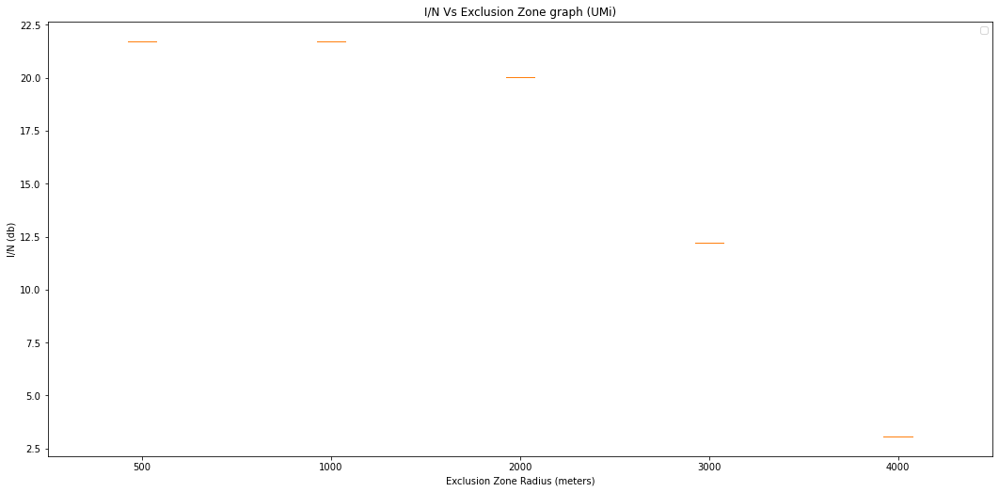

In [40]:
# EXCLUSION ZONE

# Creating dataset
# distance, interface_Noise = pairs_noAverage['UMi']
distance, interface_Noise = pairs['UMi']
 
# print(box_dict_UMi)
 
fig, ax = plt.subplots()

# Creating plot
for i, exclusion_zone in enumerate(exclusion_zones):
    # key is exclusion zone
#     ax.boxplot(interface_Noise[exclusion_zone],
     ax.boxplot([interface_Noise[exclusion_zone]],
               patch_artist=True,
               positions=[i],
               boxprops=dict(facecolor='white'))

# keys = sorted([key for key in box_dict_UMi])
# ax.boxplot([box_dict_UMi[key] for key in keys])
ax.set_xticklabels([int(i) for i in exclusion_zones])
 
ax.set_title('I/N Vs Exclusion Zone graph (UMi)')
ax.set_xlabel('Exclusion Zone Radius (meters)')
ax.set_ylabel('I/N (db)')
ax.legend()

# show plot
# plt.show()
fig.set_size_inches(18, 8.5)
# fig.savefig('NLOS_aggregate_omni_graphUmiexclusion5km.pdf', dpi=100)
plt.show()

In [39]:
# EXCLUSION ZONE (-15db BS)

# Creating dataset
distance, interface_Noise = pairs_noAverage['UMi']
# distance, interface_Noise = pairs['UMi']
 
# print(box_dict_UMi)
 
fig, ax = plt.subplots()

# Creating plot
for i, exclusion_zone in enumerate(exclusion_zones):
    # key is exclusion zone
#     ax.boxplot(interface_Noise[exclusion_zone],
     ax.boxplot( [x for x in  interface_Noise[exclusion_zone] if x < -5], (#lowest could be -7db)
               patch_artist=True,
               positions=[i],
               boxprops=dict(facecolor='white'))

# keys = sorted([key for key in box_dict_UMi])
# ax.boxplot([box_dict_UMi[key] for key in keys])
ax.set_xticklabels([int(i) for i in exclusion_zones])
 
ax.set_title('I/N Vs Exclusion Zone graph (UMi)')
ax.set_xlabel('Exclusion Zone Radius (meters)')
ax.set_ylabel('I/N (db)')
ax.legend()

# show plot
# plt.show()
fig.set_size_inches(18, 8.5)
# fig.savefig('-15dbaggregatedirecgraphUmiexclusion5km.pdf', dpi=100)
plt.show()

SyntaxError: invalid syntax (573427795.py, line 16)

In [ ]:
len(pairs_noAverage ['UMi'][1][1000])/10

In [ ]:
# EXCLUSION ZONE

# Creating dataset
distance, interface_Noise = pairs_noAverage['UMi']
# distance, interface_Noise = pairs['UMi']
 
# print(box_dict_UMi)
 
fig, ax = plt.subplots()

# Creating plot
for i, exclusion_zone in enumerate(exclusion_zones):
    # key is exclusion zone
#     ax.boxplot(interface_Noise[exclusion_zone],
     ax.boxplot([interface_Noise[exclusion_zone]],
               patch_artist=True,
               positions=[i],
               boxprops=dict(facecolor='white'))

# keys = sorted([key for key in box_dict_UMi])
# ax.boxplot([box_dict_UMi[key] for key in keys])
ax.set_xticklabels([int(i) for i in exclusion_zones])
 
ax.set_title('I/N Vs Exclusion Zone graph (UMi)')
ax.set_xlabel('Exclusion Zone Radius (meters)')
ax.set_ylabel('I/N (db)')
ax.legend()

# show plot
# plt.show()
fig.set_size_inches(18, 8.5)
# fig.savefig('graphUmiexclusion.pdf', dpi=100)
plt.show()

In [ ]:
# # Creating dataset
# box_dict_UMi = dict{2: I_N_UMi for 2000, 5: I_N_UMi for 5000, 10: I_N_UMi for 10000}
# distance, interface_Noise = pairs_noAverage['UMi']
# for i in range(len(interface_Noise)):
#     if not line_of_sight[i]:
#         continue   
#     if distance[i] not in box_dict_UMi:
#         box_dict_UMi[distance[i]] = []
#     box_dict_UMi[distance[i]].append([interface_Noise[i],line_of_sight[i]])

# # print(box_dict_UMi)

# fig, ax= plt.subplots()
 
# # Creating plot
# keys = sorted([key for key in box_dict_UMi])
# for i, key in enumerate(keys):
#     # key is distance
#     # print(key)
#     # print(box_dict_UMi[key])
#     line_of_sight1 = box_dict_UMi[key][0][1]
#     ax.boxplot([I_N for I_N, los in box_dict_UMi[key]],
#                patch_artist=True,
#                positions=[i],
#                boxprops=dict(facecolor='white', color='blue' if line_of_sight1  else 'red'))
    
# #     ax.boxplot([I_N for I_N, los in box_dict_UMi[key]],
# #                patch_artist=True,
# #                positions=[i],
# #                boxprops=dict(facecolor='white', color='red' if not line_of_sight1))
                
# # keys = sorted([key for key in box_dict_UMi])
# # ax.boxplot([box_dict_UMi[key] for key in keys])
# ax.set_xticklabels([int(i) for i in keys])

# ax.set_title('I/N Vs Distance graph (UMi LOS)')
# ax.set_xlabel('Distnace of Each BS from FSS (meters)')
# ax.set_ylabel('I/N (db)')
# ax.legend()
 
# # show plot
# # plt.show()
# fig.set_size_inches(18, 8.5)
# # fig.savefig('graphUmiomniwithlog10.pdf', dpi=100)
# plt.show()





In [ ]:
# Creating dataset
box_dict_UMi = dict()
distance, interface_Noise = pairs_noAverage['UMi']
for i in range(len(interface_Noise)):
    if line_of_sight[i]:
        continue
        
    if distance[i] not in box_dict_UMi:
        box_dict_UMi[distance[i]] = []
    box_dict_UMi[distance[i]].append([interface_Noise[i],line_of_sight[i]])

# print(box_dict_UMi)

fig, ax= plt.subplots()
 
# Creating plot
keys = sorted([key for key in box_dict_UMi])
for i, key in enumerate(keys):
    # key is distance
    # print(key)
    # print(box_dict_UMi[key])
    line_of_sight1 = box_dict_UMi[key][0][1]
#     ax.boxplot([I_N for I_N, los in box_dict_UMi[key]],
#                patch_artist=True,
#                positions=[i],
#                boxprops=dict(facecolor='white', color='blue' if line_of_sight1))
    
    ax.boxplot([I_N for I_N, los in box_dict_UMi[key]],
               patch_artist=True,
               positions=[i],
               boxprops=dict(facecolor='white', color='red' if not line_of_sight1 else 'red'))
                
# keys = sorted([key for key in box_dict_UMi])
# ax.boxplot([box_dict_UMi[key] for key in keys])
ax.set_xticklabels([int(i) for i in keys])

ax.set_title('I/N Vs Distance graph (UMi NLOS)')
ax.set_xlabel('Distnace of Each BS from FSS (meters)')
ax.set_ylabel('I/N (db)')
ax.legend()

 
# show plot
# plt.show()
fig.set_size_inches(18, 8.5)
# fig.savefig('graphUmiomniwithlog10.pdf', dpi=100)
plt.show()
    

In [ ]:
# Creating dataset
box_dict_UMa = dict()
distance, interface_Noise = pairs_noAverage['UMa']
for i in range(len(interface_Noise)):
    if distance[i] not in box_dict_UMa:
        box_dict_UMa[distance[i]] = []
    box_dict_UMa[distance[i]].append([interface_Noise[i],line_of_sight[i]])

# print(box_dict_UMi)

fig, ax= plt.subplots()
 
# Creating plot
keys = sorted([key for key in box_dict_UMa])
for i, key in enumerate(keys):
    # key is distance
    # print(key)
    # print(box_dict_UMi[key])
    line_of_sight1 = box_dict_UMa[key][0][1]
    ax.boxplot([I_N for I_N, los in box_dict_UMa[key]],
               patch_artist=True,
               positions=[i],
               boxprops=dict(facecolor='white', color='blue' if line_of_sight1 else 'red'))
                
# keys = sorted([key for key in box_dict_UMi])
# ax.boxplot([box_dict_UMi[key] for key in keys])
ax.set_xticklabels([int(i) for i in keys])

ax.set_title('I/N Vs Distance graph (UMa)')
ax.set_xlabel('Distnace of Each BS to FSS (meters)')
ax.set_ylabel('I/N (db)')
ax.legend()
 
# show plot
# plt.show()
fig.set_size_inches(18, 8.5)
# fig.savefig('graphUMa.pdf', dpi=100)
plt.show()

In [ ]:
# Creating dataset
box_dict_RMa = dict()
distance, interface_Noise = pairs_noAverage['RMa']
for i in range(len(interface_Noise)):
    if distance[i] not in box_dict_RMa:
        box_dict_RMa[distance[i]] = []
    box_dict_RMa[distance[i]].append([interface_Noise[i],line_of_sight[i]])

# print(box_dict_UMi)

fig, ax= plt.subplots()
 
# Creating plot
keys = sorted([key for key in box_dict_RMa])
for i, key in enumerate(keys):
    # key is distance
    # print(key)
    # print(box_dict_UMi[key])
    line_of_sight1 = box_dict_RMa[key][0][1]
    ax.boxplot([I_N for I_N, los in box_dict_RMa[key]],
               patch_artist=True,
               positions=[i],
               boxprops=dict(facecolor='white', color='blue' if line_of_sight1 else 'red'))
                
# keys = sorted([key for key in box_dict_UMi])
# ax.boxplot([box_dict_UMi[key] for key in keys])
ax.set_xticklabels([int(i) for i in keys])

ax.set_title('I/N Vs Distance graph (RMa)')
ax.set_xlabel('Distnace of Each BS to FSS (meters)')
ax.set_ylabel('I/N (db)')
ax.legend()
 
# show plot
# plt.show()
fig.set_size_inches(18, 8.5)
# fig.savefig('graphRma.pdf', dpi=100)
plt.show()